In [57]:
import pandas as pd
import numpy as np
import warnings
import os
import matplotlib.pyplot as plt
import missingno as msno

In [58]:
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_row', 200)

In [59]:
os.getcwd()

'D:\\jupyter\\01_Sangwoo_Project\\03_Project\\03_GyengnamTP\\03_Collecting_data'

In [60]:
os.listdir('D:/jupyter/01_Sangwoo_Project/03_Project/03_GyengnamTP/03_Collecting_data')

['(2022.09.15)preprocessing(making_valid_shot_no).ipynb',
 '(2022.09.16)preprocessing(making_valid_shot_no).ipynb',
 '(2022.09.21)preprocessing(making_valid_shot_no_compete)(R1)_and_build_mo....ipynb',
 '.ipynb_checkpoints',
 '01_Electronic_current',
 '02_Vibration',
 '03_SQL순서(파라미터기준)',
 '04_daehyunkim',
 'Collecting_data.ipynb',
 'Daeshin_parameter_detail_220713_0901_VL04.csv',
 'Daeshin_parameter_detail_220714_0901_VL04.csv',
 'Daeshin_parameter_detail_220714_0903_VL04.csv',
 'Database_data_EDA.ipynb',
 'Database_data_EDA_2(0712~)_prior_MC_ID.ipynb',
 'iForest-tree.png',
 'KakaoTalk_20220824_120214874.png',
 'Tool5_small_data_create.csv',
 'Tool5_small_data_create.ipynb',
 'Tool5_small_data_processing.csv',
 'tree.dot',
 'Untitled.ipynb',
 'Untitled1.ipynb',
 'VL04_0710_0721_analysis.ipynb',
 'VL04_0710_0721_analysis_Tool5_kimdaehyun.ipynb',
 'VL04_0710_0721_analysis_Tool9.ipynb',
 'VL04_0713_0903_EDA.ipynb',
 'VL04_data.parquet',
 'VL04_shot_prediction.ipynb',
 'VL04_Tool5_Anomaly_

In [61]:
df = pd.read_csv('Daeshin_parameter_detail_220714_0903_VL04.csv')
df.head()

,datetime,s_MC_Name,s_ITEM_Name,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1
0,2022-07-14 00:00:00.080648,VT750ML,HD Retarder Housing,707.0,5835,1,70,2023,299,33.0,1.0
1,2022-07-14 00:00:00.292011,VT750ML,HD Retarder Housing,707.0,5835,1,69,2023,299,33.0,1.0
2,2022-07-14 00:00:00.480669,VT750ML,HD Retarder Housing,707.0,5835,0,69,2023,299,33.0,1.0
3,2022-07-14 00:00:00.662358,VT750ML,HD Retarder Housing,707.0,5835,0,69,2023,299,33.0,1.0
4,2022-07-14 00:00:00.861922,VT750ML,HD Retarder Housing,707.0,5835,0,69,2023,299,33.0,1.0


In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20621699 entries, 0 to 20621698
Data columns (total 11 columns):
 #   Column           Dtype  
---  ------           -----  
 0   datetime         object 
 1   s_MC_Name        object 
 2   s_ITEM_Name      object 
 3   tool_number      float64
 4   shot_no          int64  
 5   current_x        int64  
 6   current_z        int64  
 7   current_spindle  int64  
 8   rpm              int64  
 9   feed             float64
 10  load_1           float64
dtypes: float64(3), int64(5), object(3)
memory usage: 1.7+ GB


In [63]:
df['tool_number'] = df['tool_number'].astype('str')
df['shot_no'] = df['shot_no'].astype('int64')

In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20621699 entries, 0 to 20621698
Data columns (total 11 columns):
 #   Column           Dtype  
---  ------           -----  
 0   datetime         object 
 1   s_MC_Name        object 
 2   s_ITEM_Name      object 
 3   tool_number      object 
 4   shot_no          int64  
 5   current_x        int64  
 6   current_z        int64  
 7   current_spindle  int64  
 8   rpm              int64  
 9   feed             float64
 10  load_1           float64
dtypes: float64(2), int64(5), object(4)
memory usage: 1.7+ GB


# 각 변수의 분포도 확인

<AxesSubplot:>

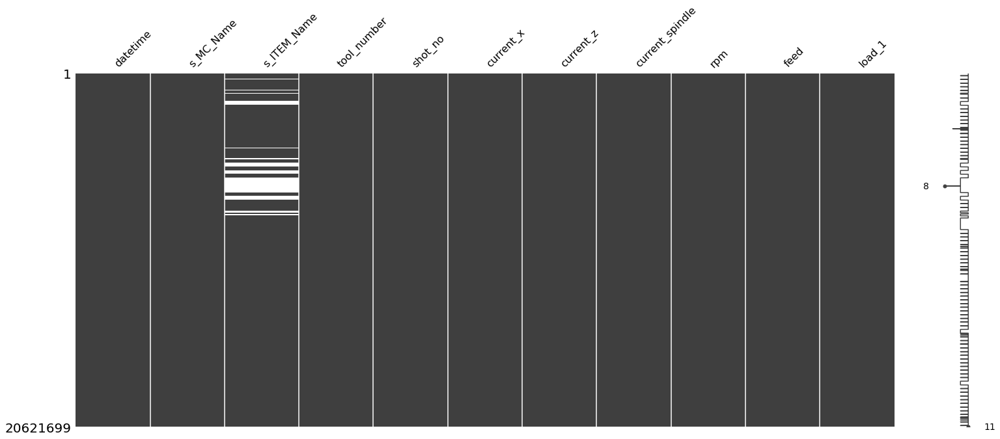

In [65]:
msno.matrix(df)

In [66]:
all_col = df.columns
for ic8 in range(0, len(all_col)):
    print('{}의 분포는'.format(all_col[ic8]))
    print(df[all_col[ic8]].value_counts())
    print(end = '\n\n')

datetime의 분포는
2022-07-14 00:00:00.080648    1
2022-08-19 01:32:48.512910    1
2022-08-19 01:32:49.924616    1
2022-08-19 01:32:49.718539    1
2022-08-19 01:32:49.511384    1
                             ..
2022-08-03 03:04:06.887064    1
2022-08-03 03:04:06.696002    1
2022-08-03 03:04:06.468000    1
2022-08-03 03:04:06.267784    1
2022-09-03 23:59:59.905122    1
Name: datetime, Length: 20621699, dtype: int64


s_MC_Name의 분포는
VT750ML    20621699
Name: s_MC_Name, dtype: int64


s_ITEM_Name의 분포는
HD Retarder Housing    17299607
Name: s_ITEM_Name, dtype: int64


tool_number의 분포는
101.0     7887088
707.0     5578717
1111.0    2200190
505.0     2114194
909.0     1979571
0.0        399102
303.0      365942
700.0       21237
100.0       19179
1100.0      18565
300.0       14227
900.0       10819
500.0        9812
-1.0         1376
nan           602
599.0         223
799.0         201
399.0         193
1199.0        180
999.0         165
199.0         116
Name: tool_number, dtype: int64


shot_n

<AxesSubplot:>

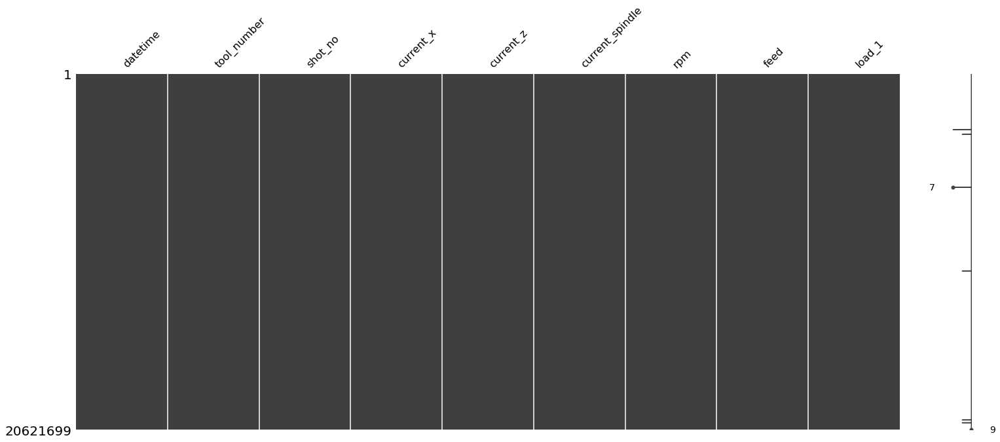

In [67]:
df_mod1 = df.drop(['s_MC_Name', 's_ITEM_Name'], axis = 1)
msno.matrix(df_mod1)

In [68]:
df_mod1['tool_number'].value_counts()

101.0     7887088
707.0     5578717
1111.0    2200190
505.0     2114194
909.0     1979571
0.0        399102
303.0      365942
700.0       21237
100.0       19179
1100.0      18565
300.0       14227
900.0       10819
500.0        9812
-1.0         1376
nan           602
599.0         223
799.0         201
399.0         193
1199.0        180
999.0         165
199.0         116
Name: tool_number, dtype: int64

In [69]:
df_mod1[df_mod1['tool_number'] == '0.0']

,datetime,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1
6567594,2022-08-02 09:59:04.985722,0.0,6217,5,2,0,0,0.0,0.0
6567595,2022-08-02 09:59:05.208215,0.0,6217,18,2,0,0,0.0,0.0
6567596,2022-08-02 09:59:05.382653,0.0,6217,18,2,0,0,0.0,0.0
6567597,2022-08-02 09:59:05.581171,0.0,6217,18,2,0,0,0.0,0.0
6567598,2022-08-02 09:59:05.785299,0.0,6217,18,2,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
6966691,2022-08-03 08:14:34.539374,0.0,6217,1,2,0,0,0.0,0.0
6966692,2022-08-03 08:14:34.715580,0.0,6217,1,2,0,0,0.0,0.0
6966693,2022-08-03 08:14:34.939415,0.0,6217,1,2,0,0,0.0,0.0
6966694,2022-08-03 08:14:35.139378,0.0,6217,1,2,0,0,0.0,0.0


해당 가동이력의 신호취득장비와, 진동기, 전력량기는 따로 구성되어 있어
실제 설비가 전원OFF 일지라도 진동기의 신호취득 장비의 전원이 켜져 있으면 DEASHIN_SIGNAL -> TPOP_MACHINE_PARAMETER DB 에 데이터가 들어올 수 있습니다.
VL04 : 2022-08-02 09:59:04 ~ 2022-08-03 08:14:35 (약 1일간)
2022-08-03 9시 이후의 데이터를 활용하여 처리 필요(팁이 망가질때까지 쓴 데이터가 포함됨)

In [70]:
19759018 - 399102

19359916

In [71]:
df_mod1['tool_number'].value_counts()

101.0     7887088
707.0     5578717
1111.0    2200190
505.0     2114194
909.0     1979571
0.0        399102
303.0      365942
700.0       21237
100.0       19179
1100.0      18565
300.0       14227
900.0       10819
500.0        9812
-1.0         1376
nan           602
599.0         223
799.0         201
399.0         193
1199.0        180
999.0         165
199.0         116
Name: tool_number, dtype: int64

In [72]:
df_mod1[df_mod1['datetime'] > '2022-07-31 19:59:59.90000']

,datetime,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1
5886253,2022-07-31 19:59:59.978895,707.0,6205,0,2,0,0,0.0,0.0
5886254,2022-07-31 20:00:00.174119,707.0,6205,0,2,0,0,0.0,0.0
5886255,2022-07-31 20:00:00.391033,707.0,6205,0,2,0,0,0.0,0.0
5886256,2022-07-31 20:00:00.596390,707.0,6205,0,2,0,0,0.0,0.0
5886257,2022-07-31 20:00:00.808133,707.0,6205,0,2,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
20621694,2022-09-03 23:59:59.094401,303.0,6801,0,128,16,0,50.0,0.0
20621695,2022-09-03 23:59:59.273896,303.0,6801,0,128,16,0,50.0,0.0
20621696,2022-09-03 23:59:59.482536,303.0,6801,1,126,17,0,50.0,0.0
20621697,2022-09-03 23:59:59.705053,303.0,6801,1,126,17,0,50.0,0.0


In [73]:
df_mod1[df_mod1['shot_no'] == 6210]

,datetime,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1
5957667,2022-07-31 23:58:55.649676,707.0,6210,0,10,5711,2,0.0,0.0
5957668,2022-07-31 23:58:55.867220,707.0,6210,0,4,1149,2,0.0,0.0
5957669,2022-07-31 23:58:56.041616,707.0,6210,0,4,1149,0,0.0,0.0
5957670,2022-07-31 23:58:56.261515,707.0,6210,0,4,1149,0,0.0,0.0
5957671,2022-07-31 23:58:56.440838,707.0,6210,0,4,52,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
5971341,2022-08-01 00:44:42.705768,707.0,6210,4,7,3660,224,0.0,121.0
5971342,2022-08-01 00:44:42.917168,707.0,6210,4,7,3660,224,0.0,121.0
5971343,2022-08-01 00:44:43.100070,707.0,6210,7,11,6295,141,0.0,122.0
5971344,2022-08-01 00:44:43.293087,707.0,6210,7,11,6295,141,0.0,122.0


# shot_no 6210부터 08-01 일자 데이터임

In [74]:
# shot_no 6210부터 08-01 일자 데이터임
df_mod2 = df_mod1[df_mod1['shot_no'] > 6209]
df_mod2

,datetime,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1
5957667,2022-07-31 23:58:55.649676,707.0,6210,0,10,5711,2,0.0,0.0
5957668,2022-07-31 23:58:55.867220,707.0,6210,0,4,1149,2,0.0,0.0
5957669,2022-07-31 23:58:56.041616,707.0,6210,0,4,1149,0,0.0,0.0
5957670,2022-07-31 23:58:56.261515,707.0,6210,0,4,1149,0,0.0,0.0
5957671,2022-07-31 23:58:56.440838,707.0,6210,0,4,52,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
20621694,2022-09-03 23:59:59.094401,303.0,6801,0,128,16,0,50.0,0.0
20621695,2022-09-03 23:59:59.273896,303.0,6801,0,128,16,0,50.0,0.0
20621696,2022-09-03 23:59:59.482536,303.0,6801,1,126,17,0,50.0,0.0
20621697,2022-09-03 23:59:59.705053,303.0,6801,1,126,17,0,50.0,0.0


In [75]:
df_mod2['tool_number'].value_counts()

101.0     5498408
707.0     4226782
1111.0    1464836
505.0     1434541
909.0     1328948
0.0        399102
303.0      243500
100.0       15369
700.0       14189
1100.0      12432
300.0        9440
900.0        7226
500.0        6554
-1.0         1376
599.0         161
799.0         151
399.0         120
1199.0        113
999.0         104
199.0          79
Name: tool_number, dtype: int64

In [76]:
df_mod2[df_mod2['tool_number'] == '-1.0']['load_1']

11418736   NaN
11418737   NaN
11418738   NaN
11418739   NaN
11418740   NaN
            ..
20216671   NaN
20216672   NaN
20216673   NaN
20216674   NaN
20216675   NaN
Name: load_1, Length: 1376, dtype: float64

In [77]:
df_mod3 = df_mod2.dropna(axis = 0)
df_mod3['tool_number'].value_counts()

101.0     5497949
707.0     4226782
1111.0    1464836
505.0     1434541
909.0     1328948
0.0        399102
303.0      243500
100.0       15369
700.0       14189
1100.0      12432
300.0        9440
900.0        7226
500.0        6554
599.0         161
799.0         151
399.0         120
1199.0        113
999.0         104
199.0          79
Name: tool_number, dtype: int64

In [78]:
len(df_mod2) - len(df_mod3) 

1835

In [79]:
5498408- 5497949

459

-1.0 값의 개수(1376개) + Tool number 101(459개) (총 1835개)만큼 삭제됨

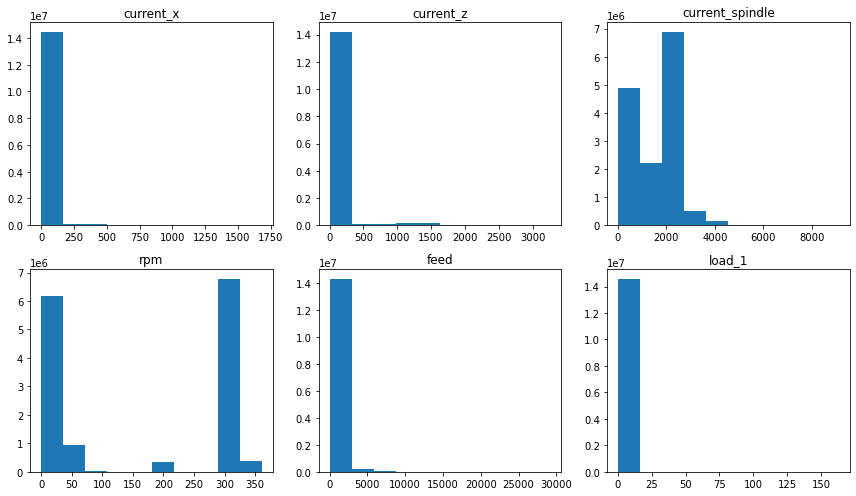

In [80]:
column_list = ['current_x', 'current_z', 'current_spindle', 'rpm', 'feed', 'load_1']
fig = plt.figure(figsize = (12,7))

for idx in range(0, len(column_list)):
    globals()['ax_{}'.format(idx)] = fig.add_subplot(round(len(column_list)/3),3,idx+1)
    globals()['ax_{}'.format(idx)].hist(df_mod3[column_list[idx]])
    globals()['ax_{}'.format(idx)].set_title(column_list[idx])
fig.tight_layout()

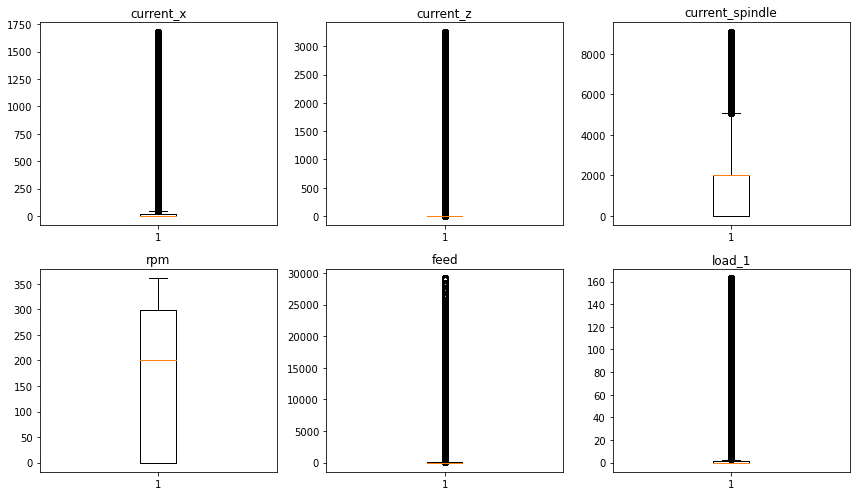

In [81]:
fig2 = plt.figure(figsize = (12,7))

for idx2 in range(0, len(column_list)):
    globals()['ax_box_{}'.format(idx2)] = fig2.add_subplot(round(len(column_list)/3),3,idx2+1)
    globals()['ax_box_{}'.format(idx2)].boxplot(df_mod3[column_list[idx2]])
    globals()['ax_box_{}'.format(idx2)].set_title(column_list[idx2])
fig2.tight_layout()

<AxesSubplot:>

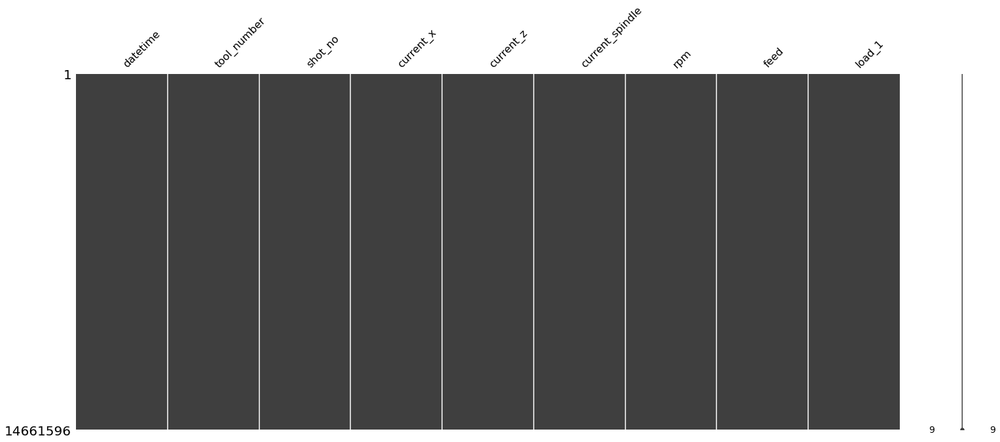

In [82]:
msno.matrix(df_mod3)

In [83]:
df_mod3['tool_number'].unique()

array(['707.0', '100.0', '101.0', '500.0', '505.0', '900.0', '909.0',
       '999.0', '1100.0', '1111.0', '700.0', '300.0', '303.0', '0.0',
       '1199.0', '399.0', '799.0', '599.0', '199.0'], dtype=object)

In [84]:
df_mod3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14661596 entries, 5957667 to 20621698
Data columns (total 9 columns):
 #   Column           Dtype  
---  ------           -----  
 0   datetime         object 
 1   tool_number      object 
 2   shot_no          int64  
 3   current_x        int64  
 4   current_z        int64  
 5   current_spindle  int64  
 6   rpm              int64  
 7   feed             float64
 8   load_1           float64
dtypes: float64(2), int64(5), object(2)
memory usage: 1.1+ GB


In [85]:
df_mod3[df_mod3['tool_number'] == 0.0]

,datetime,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1


# Tool_number 0인 데이터에 대한 처리를 위하여 shot_no 6217이후 값으로 활용

In [86]:
df_mod3 = df_mod3[df_mod3['shot_no'] > 6217]

In [87]:
df_mod3.head()

,datetime,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1
6978348,2022-08-03 08:53:38.108062,707.0,6218,0,12,1179,1,0.0,0.0
6978349,2022-08-03 08:53:38.308097,707.0,6218,0,4,1179,1,0.0,0.0
6978350,2022-08-03 08:53:38.501477,707.0,6218,0,4,1179,0,0.0,0.0
6978351,2022-08-03 08:53:38.694584,707.0,6218,0,2,56,0,0.0,0.0
6978352,2022-08-03 08:53:38.895916,707.0,6218,0,2,56,0,0.0,0.0


In [88]:
df_mod3['tool_number'].value_counts()

101.0     4896071
707.0     4222847
1111.0    1460058
505.0     1429999
909.0     1324606
303.0      242665
100.0       15329
700.0       14142
1100.0      12389
300.0        9406
900.0        7204
500.0        6533
599.0         161
799.0         151
399.0         120
1199.0        113
999.0         102
199.0          79
Name: tool_number, dtype: int64

In [89]:
df_mod3['datetime'] = pd.to_datetime(df_mod3['datetime'])
df_mod3['tool_number'] = df_mod3['tool_number'].astype('str')
df_mod3['date'] = df_mod3['datetime'].dt.date
df_mod3['hour'] = df_mod3['datetime'].dt.hour
df_mod3['minute'] = df_mod3['datetime'].dt.minute
df_mod3['second'] = df_mod3['datetime'].dt.second
df_mod3 = df_mod3.groupby(['date', 'hour', 'minute', 'second', 'tool_number', 'shot_no']).mean()
df_mod3.reset_index(inplace=True)
# df_mod3.resample('T', on = 'datetime').mean()

In [90]:
df_mod3

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1
0,2022-08-03,8,53,38,707.0,6218,0.0,4.8,729.8,0.4,0.0,0.0
1,2022-08-03,8,53,39,707.0,6218,0.0,2.0,22.4,0.0,0.0,0.0
2,2022-08-03,8,53,40,707.0,6218,0.0,2.0,0.0,0.0,0.0,0.0
3,2022-08-03,8,53,41,707.0,6218,0.0,2.0,0.0,0.0,0.0,0.0
4,2022-08-03,8,53,42,707.0,6218,0.0,2.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2740575,2022-09-03,23,59,55,303.0,6801,0.6,136.0,15.0,0.0,50.0,0.0
2740576,2022-09-03,23,59,56,303.0,6801,1.0,123.6,16.4,0.0,50.0,0.0
2740577,2022-09-03,23,59,57,303.0,6801,1.0,685.2,16.2,0.0,1317.2,0.0
2740578,2022-09-03,23,59,58,303.0,6801,0.6,655.2,14.4,0.0,41.4,0.0


In [91]:
df_mod3['tool_number'].unique()

array(['707.0', '100.0', '101.0', '500.0', '505.0', '900.0', '909.0',
       '999.0', '1100.0', '1111.0', '700.0', '300.0', '303.0', '1199.0',
       '399.0', '799.0', '599.0', '199.0'], dtype=object)

In [92]:
# tool, state 값 변경
df_mod3['tool_number'] = df_mod3['tool_number'].astype('float64')
df_mod3['tool'] = df_mod3['tool_number']
df_mod3['state'] = df_mod3['tool_number']
df_mod3.reset_index(inplace = True, drop = True)

In [93]:
df_mod3['tool'].unique()

array([ 707.,  100.,  101.,  500.,  505.,  900.,  909.,  999., 1100.,
       1111.,  700.,  300.,  303., 1199.,  399.,  799.,  599.,  199.])

In [94]:
df_mod3['state'].unique()

array([ 707.,  100.,  101.,  500.,  505.,  900.,  909.,  999., 1100.,
       1111.,  700.,  300.,  303., 1199.,  399.,  799.,  599.,  199.])

In [95]:
temp_state = df_mod3['state'].unique()
temp_tool = df_mod3['tool'].unique()
state_list = ['operation', 'cancel', 'operation', 'cancel', 'operation', 'cancel', 'operation', 'end', 'cancel', 'operation', 'cancel', 'cancel', 'operation', 'end', 'end', 'end', 'end', 'end']
tool_list = [7,1,1,5,5,9,9,9,11,11,7,3,3,11,3,7,5,1]
df_mod3['state'] = df_mod3['state'].replace(temp_state, state_list)
df_mod3['tool'] = df_mod3['tool'].replace(temp_tool, tool_list)
df_mod3['tool'] = df_mod3['tool'].astype('str')

In [96]:
df_mod3

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
0,2022-08-03,8,53,38,707.0,6218,0.0,4.8,729.8,0.4,0.0,0.0,7.0,operation
1,2022-08-03,8,53,39,707.0,6218,0.0,2.0,22.4,0.0,0.0,0.0,7.0,operation
2,2022-08-03,8,53,40,707.0,6218,0.0,2.0,0.0,0.0,0.0,0.0,7.0,operation
3,2022-08-03,8,53,41,707.0,6218,0.0,2.0,0.0,0.0,0.0,0.0,7.0,operation
4,2022-08-03,8,53,42,707.0,6218,0.0,2.0,0.0,0.0,0.0,0.0,7.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2740575,2022-09-03,23,59,55,303.0,6801,0.6,136.0,15.0,0.0,50.0,0.0,3.0,operation
2740576,2022-09-03,23,59,56,303.0,6801,1.0,123.6,16.4,0.0,50.0,0.0,3.0,operation
2740577,2022-09-03,23,59,57,303.0,6801,1.0,685.2,16.2,0.0,1317.2,0.0,3.0,operation
2740578,2022-09-03,23,59,58,303.0,6801,0.6,655.2,14.4,0.0,41.4,0.0,3.0,operation


In [97]:
df_mod3['date'] = df_mod3['date'].astype('str')
df_mod3['hour'] = df_mod3['hour'].astype('str')
df_mod3['minute'] = df_mod3['minute'].astype('str')
df_mod3['second'] = df_mod3['second'].astype('str')
df_mod3['datetime'] = df_mod3['date'] + ' ' + df_mod3['hour']+ ':' + df_mod3['minute'] + ':' + df_mod3['second']
df_mod3['datetime'] = pd.to_datetime(df_mod3['datetime'])
df_mod3 = df_mod3.set_index('datetime')

# VL04 08-03 이후의 데이터를 중심으로 처리(교체이력) - 공구교체이력 C-LIVE 참조
1. 교체이력
- 2022-08-03에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-03  9:30
- 2022-08-16에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-16  13:29
- 2022-08-17에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-17  8:18
- 2022-08-18에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-18  8:27
- 2022-08-19에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-19  9:02
- 2022-08-20에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-20  9:24
- 2022-08-21에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-21  14:24
- 2022-08-28에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-28  18:48
- 2022-08-29에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-29  17:50
- 2022-08-30에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-30  9:52
- 2022-08-31에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-31  19:07
- 2022-09-01에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-09-01  10:49
- 2022-09-02에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-09-02  13:30
- 2022-09-03에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-09-03  9:49

In [98]:
df_mod3[df_mod3['shot_no'] == 6800]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 22:41:50,2022-09-03,22,41,50,707.0,6800,0.800000,2.0,394.800000,0.2,0.0,0.000000,7.0,operation
2022-09-03 22:41:51,2022-09-03,22,41,51,707.0,6800,0.000000,2.0,6.600000,0.0,0.0,0.000000,7.0,operation
2022-09-03 22:41:52,2022-09-03,22,41,52,707.0,6800,0.000000,2.0,0.000000,0.0,0.0,0.000000,7.0,operation
2022-09-03 22:41:53,2022-09-03,22,41,53,707.0,6800,0.000000,2.0,0.000000,0.0,0.0,0.000000,7.0,operation
2022-09-03 22:41:54,2022-09-03,22,41,54,707.0,6800,0.000000,2.0,0.000000,0.0,0.0,0.000000,7.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 23:24:39,2022-09-03,23,24,39,707.0,6800,0.000000,2.0,2014.600000,299.6,0.0,0.000000,7.0,operation
2022-09-03 23:24:40,2022-09-03,23,24,40,707.0,6800,0.000000,2.0,2015.600000,299.0,0.0,0.200000,7.0,operation
2022-09-03 23:24:41,2022-09-03,23,24,41,707.0,6800,0.000000,2.0,2016.000000,299.0,0.0,0.000000,7.0,operation


In [99]:
df_mod4 = df_mod3[(df_mod3['shot_no'] < 6801)]

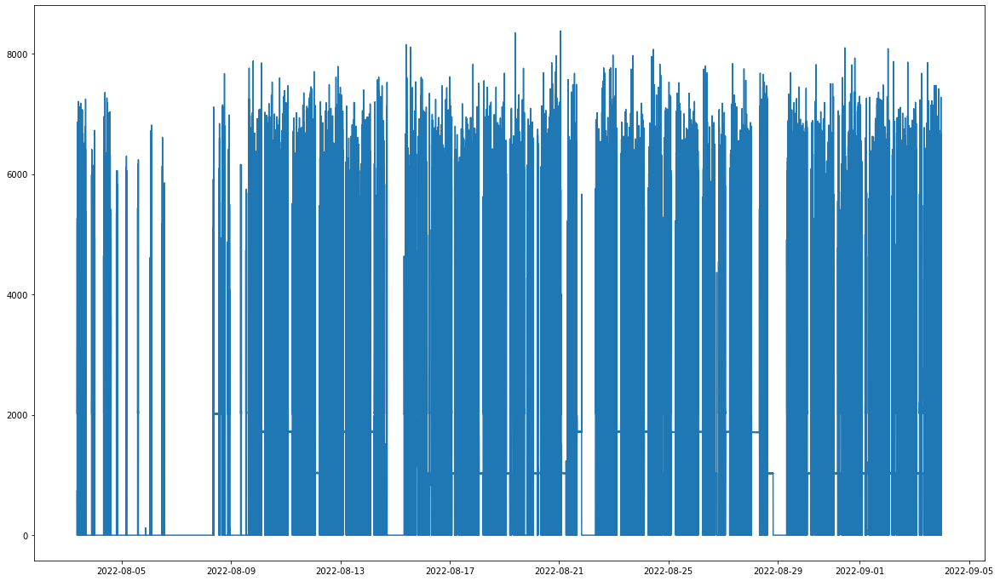

In [100]:
plt.figure(figsize = (20, 12))
plt.plot(df_mod4['current_spindle'])

<AxesSubplot:xlabel='shot_no'>

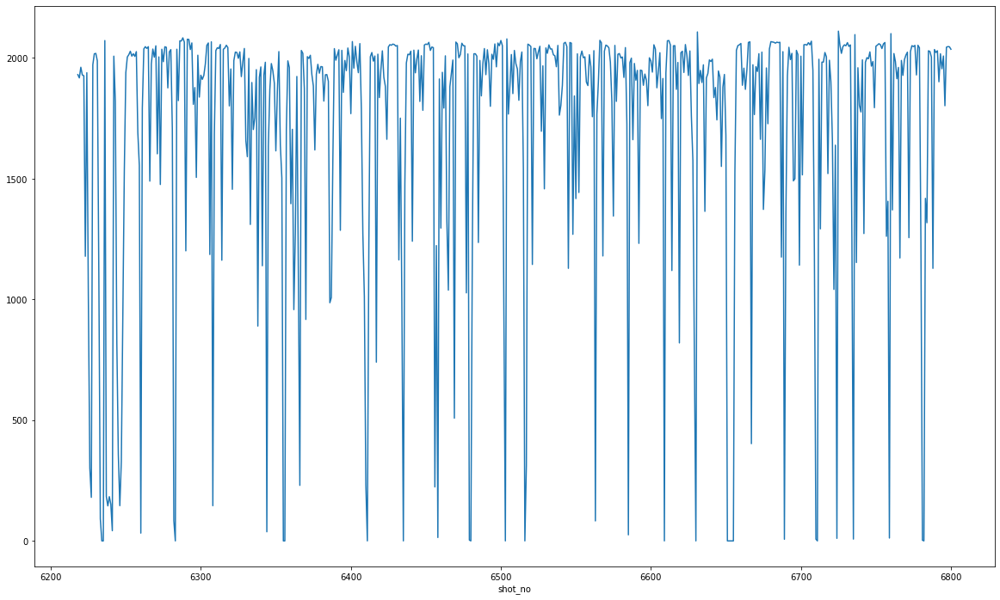

In [101]:
plt.figure(figsize = (20, 12))
df_mod4.groupby('shot_no').mean()['current_spindle'].plot()

<AxesSubplot:xlabel='shot_no'>

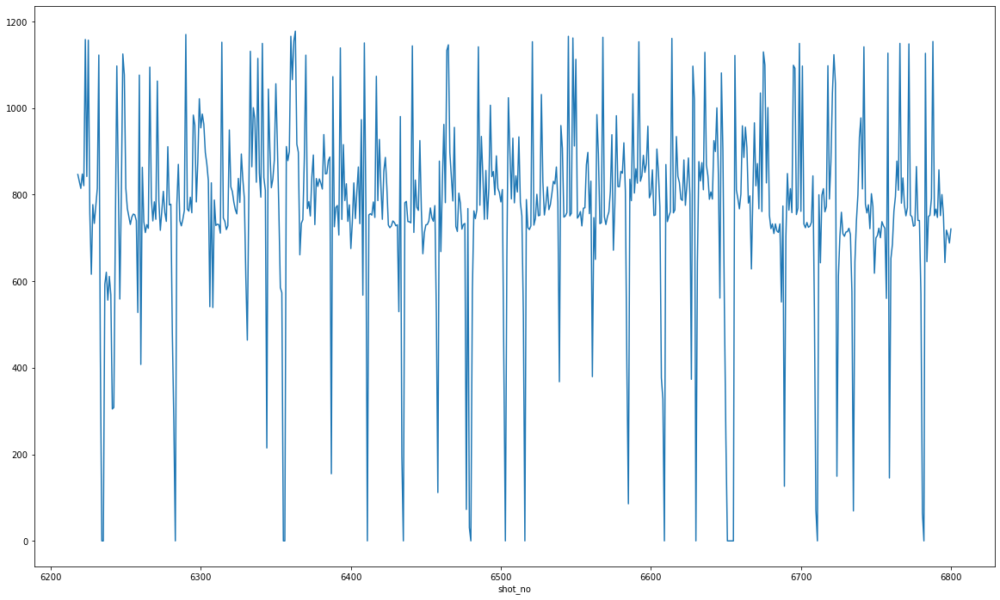

In [102]:
plt.figure(figsize = (20, 12))
df_mod4.groupby('shot_no').std()['current_spindle'].plot()

In [103]:
# tool별 교체
tool_1 = df_mod4[df_mod4['tool'] == '1.0']
tool_7 = df_mod4[df_mod4['tool'] == '7.0']
tool_11 = df_mod4[df_mod4['tool'] == '11.0']
tool_9 = df_mod4[df_mod4['tool'] == '9.0']
tool_5 = df_mod4[df_mod4['tool'] == '5.0']
tool_3 = df_mod4[df_mod4['tool'] == '3.0']

# 2022-08-03 교체 이후 시점부터의 데이터로 활용

# 1. Tool1 EDA

In [104]:
tool_1.head()

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218,0.0,4.250000,0.000000,0.000000,12000.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218,0.0,3.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218,2.0,3.333333,456.666667,5.333333,0.0,116.0,1.0,operation
2022-08-03 08:57:22,2022-08-03,8,57,22,101.0,6218,100.0,30.400000,5262.800000,170.000000,2414.2,98.2,1.0,operation


In [105]:
tool_1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 983721 entries, 2022-08-03 08:57:19 to 2022-09-03 22:55:28
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   date             983721 non-null  object 
 1   hour             983721 non-null  object 
 2   minute           983721 non-null  object 
 3   second           983721 non-null  object 
 4   tool_number      983721 non-null  float64
 5   shot_no          983721 non-null  int64  
 6   current_x        983721 non-null  float64
 7   current_z        983721 non-null  float64
 8   current_spindle  983721 non-null  float64
 9   rpm              983721 non-null  float64
 10  feed             983721 non-null  float64
 11  load_1           983721 non-null  float64
 12  tool             983721 non-null  object 
 13  state            983721 non-null  object 
dtypes: float64(7), int64(1), object(6)
memory usage: 112.6+ MB


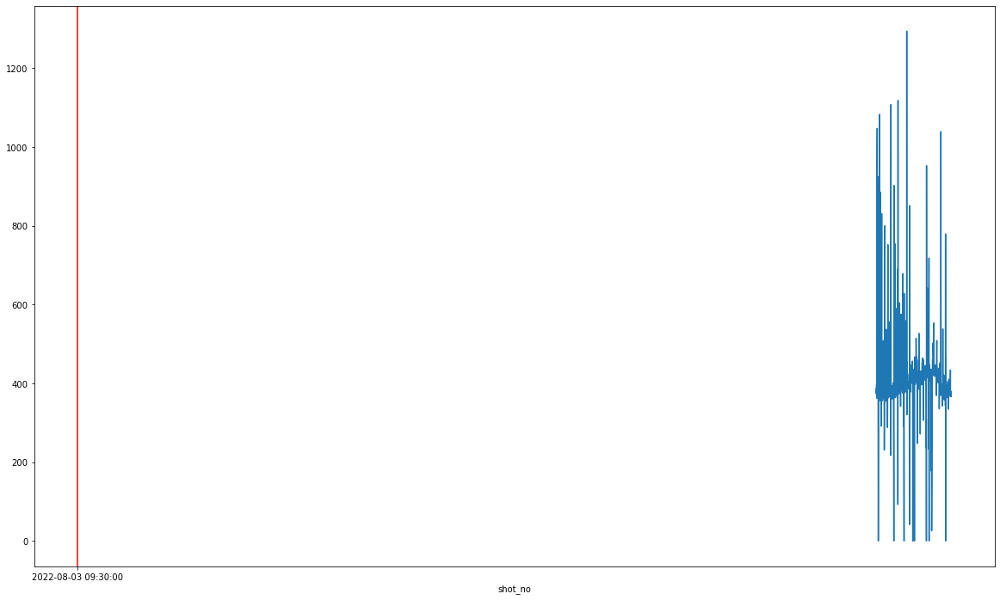

In [106]:
plt.figure(figsize = (20, 12))
tool_1.groupby('shot_no').std()['current_spindle'].plot()
plt.axvline('2022-08-03 09:30:00', color = 'red', label = 'tool_change1', linestyle = 'solid')

<AxesSubplot:xlabel='shot_no'>

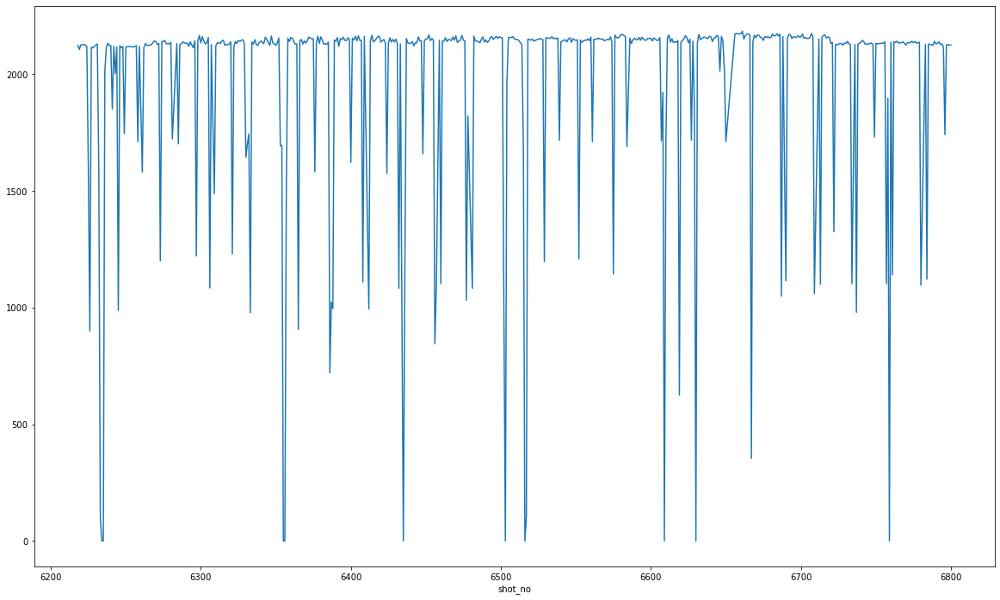

In [107]:
plt.figure(figsize = (20, 12))
tool_1.groupby('shot_no').mean()['current_spindle'].plot()

<AxesSubplot:xlabel='shot_no'>

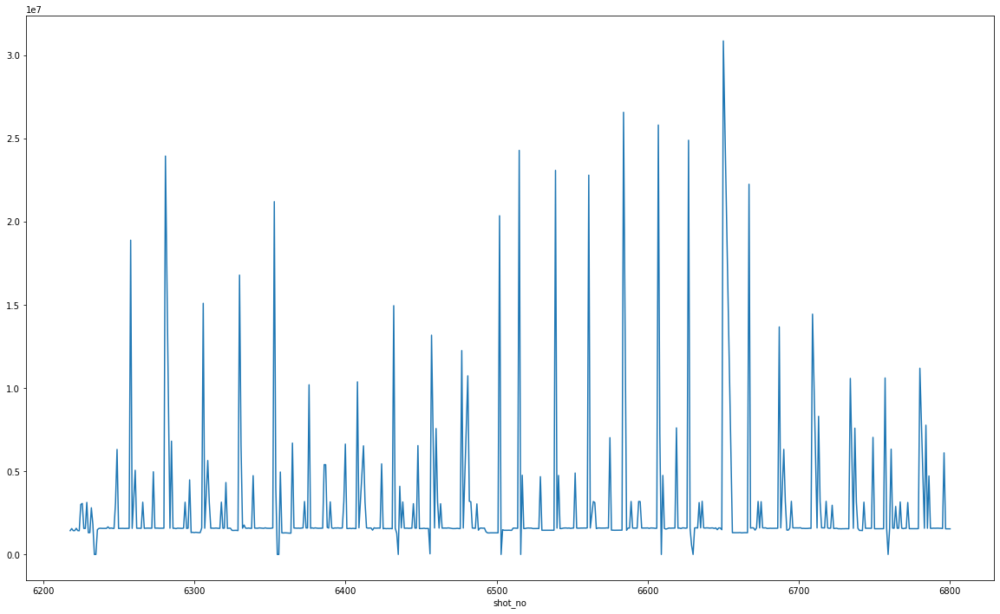

In [108]:
plt.figure(figsize = (20, 12))
tool_1.groupby('shot_no').sum()['current_spindle'].plot()

In [109]:
tool1_mean = pd.Series(tool_1.groupby('shot_no').mean()['current_spindle'], name = 'mean')
tool1_sum = pd.Series(tool_1.groupby('shot_no').sum()['current_spindle'], name = 'sum')
tool1_std = pd.Series(tool_1.groupby('shot_no').std()['current_spindle'], name = 'std')
tool1_sem = pd.Series(tool_1.groupby('shot_no').sem()['current_spindle'], name = 'sem')
tool1_median = pd.Series(tool_1.groupby('shot_no').median()['current_spindle'], name = 'median')
tool1_var = pd.Series(tool_1.groupby('shot_no').var()['current_spindle'], name = 'var')
tool1_max = pd.Series(tool_1.groupby('shot_no').max()['current_spindle'], name = 'max')
temp = [tool1_mean, tool1_sum, tool1_std, tool1_sem, tool1_median, tool1_var, tool1_max]
tool1_stat = pd.Series()
for add in temp:
    tool1_stat = pd.concat([tool1_stat, add], axis = 1)
tool1_stat.drop(0, axis = 1, inplace = True)
tool1_stat

,mean,sum,std,sem,median,var,max
6218,2123.190950,1.431031e+06,386.191552,14.875543,2020.20,149143.915037,5262.8
6219,2105.938746,1.556289e+06,373.044091,13.722649,2018.75,139161.894000,5851.8
6220,2125.301954,1.432454e+06,379.011148,14.598964,2019.55,143649.450679,4215.2
6221,2125.793784,1.430659e+06,397.045902,15.304995,2020.00,157645.448455,6344.0
6222,2127.148602,1.571963e+06,362.376041,13.330218,2029.60,131316.395294,5409.8
...,...,...,...,...,...,...,...
6796,1740.725159,6.104723e+06,433.763939,7.324628,1716.00,188151.154999,6320.6
6797,2124.988207,1.540616e+06,365.913004,13.589668,2023.60,133892.326295,4635.4
6798,2127.164023,1.542194e+06,379.995031,14.112661,2020.60,144396.223950,4941.0
6799,2124.216483,1.542181e+06,376.539054,13.974675,2020.50,141781.658936,4136.0


In [110]:
tool1_stat.columns[0]

'mean'

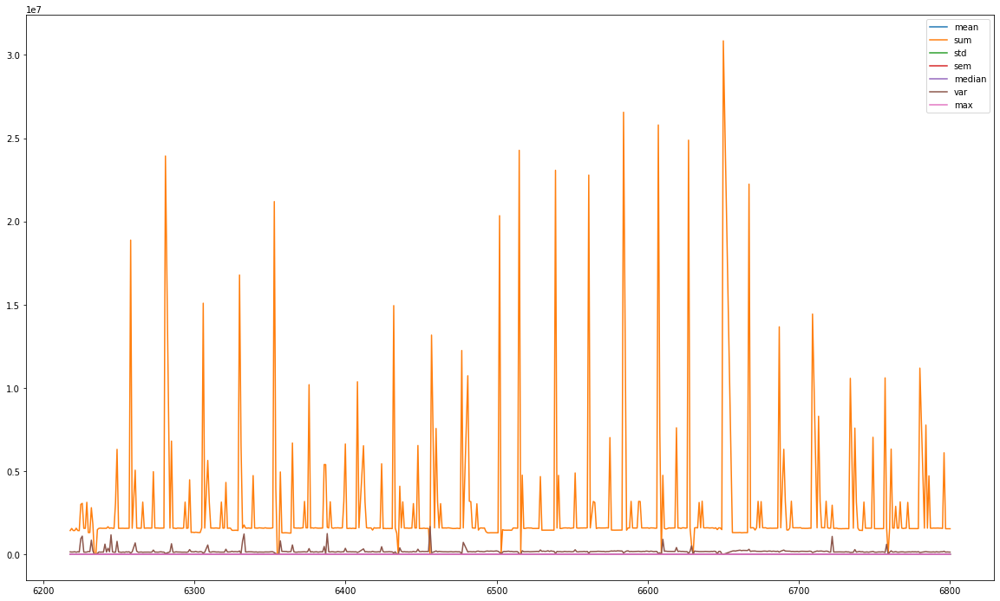

In [111]:
plt.figure(figsize = (20,12))
for overall in range(len(tool1_stat.columns)):
    plt.plot(tool1_stat[tool1_stat.columns[overall]], label = '{}'.format(tool1_stat.columns[overall]))
plt.legend()
plt.show()

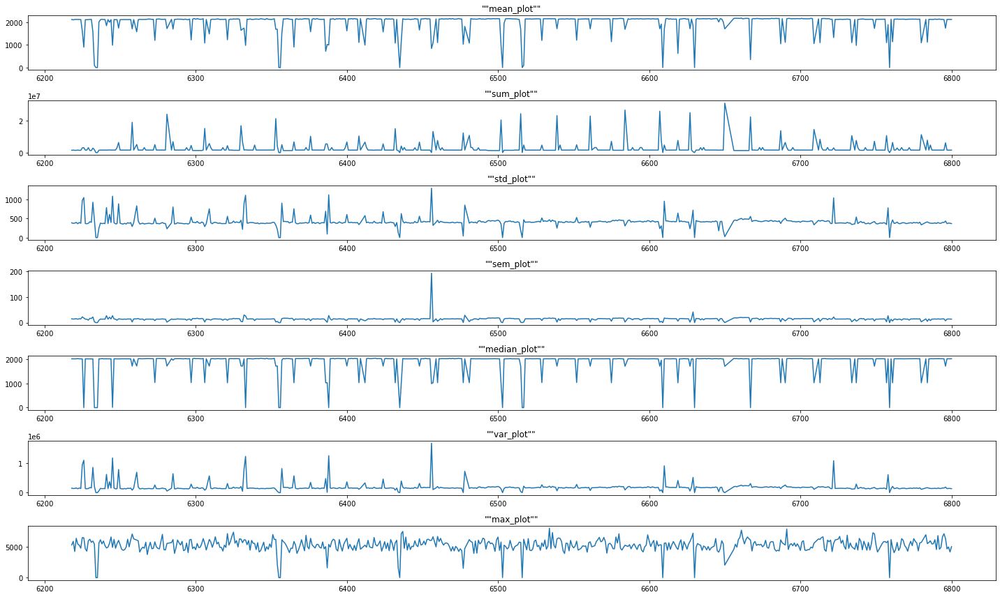

In [112]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(temp)):
    globals()['ax()'.format(idx)] = fig.add_subplot(len(temp),1,idx+1)
    globals()['ax()'.format(idx)].plot(tool1_stat.iloc[:,idx])
    globals()['ax()'.format(idx)].set_title('""{}_plot""'.format(tool1_stat.iloc[:,idx].name))
plt.tight_layout()

누적값 도출을 위한 교체시점 데이터화 수행
해당 데이터에 대한 교체 시간 입력하여 구분

In [113]:
# 교체시간 리스트화
change_list = pd.Series(['2022-08-03 09:30:00', '2022-08-16 13:29:00', '2022-08-17 08:18:00', '2022-08-18 08:27:00', '2022-08-19 09:02:00', '2022-08-20 09:24:00', '2022-08-21 14:24:00', '2022-08-28 18:48:00', '2022-08-29 17:50:00', '2022-08-30 09:52:00', '2022-08-31 19:07:00', '2022-09-01 10:49:00', '2022-09-02 13:30:00', '2022-09-03 09:49:00'], name = 'datetime')
change_shot = pd.Series([6218.5, 6393.5, 6412.5, 6436.5, 6460.5, 6481.5, 6513.5, 6667.5, 6675.5, 6691.5, 6723.5, 6739.5, 6766.5, 6785.5], name = 'shot_no')
state_list = []
for state_idx in range(0, len(change_list)):
    state_list.append('change')
state_list = pd.Series(state_list, name = 'state')
change_data = pd.concat([change_shot, state_list], axis = 1) # change_list
change_data = pd.concat([change_list, change_data], axis = 1)
change_data = change_data.set_index('datetime')
change_data

,shot_no,state
datetime,,
2022-08-03 09:30:00,6218.5,change
2022-08-16 13:29:00,6393.5,change
2022-08-17 08:18:00,6412.5,change
2022-08-18 08:27:00,6436.5,change
2022-08-19 09:02:00,6460.5,change
2022-08-20 09:24:00,6481.5,change
2022-08-21 14:24:00,6513.5,change
2022-08-28 18:48:00,6667.5,change
2022-08-29 17:50:00,6675.5,change


# raw 데이터 shot 기준 시각화

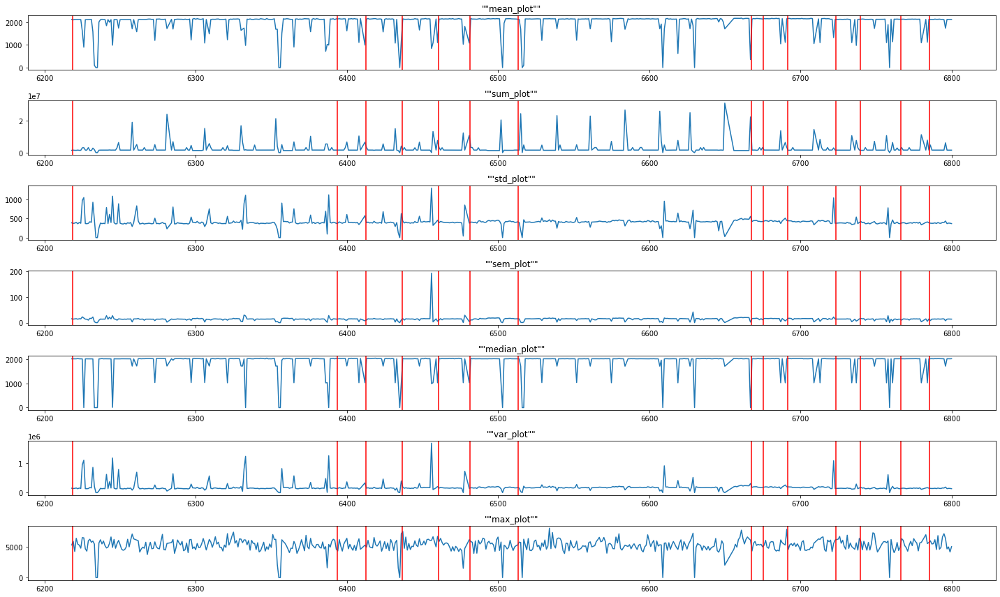

In [114]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(temp),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool1_stat.iloc[:,idx])
    for chl_idx in change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_stat.iloc[:,idx].name))
plt.tight_layout()

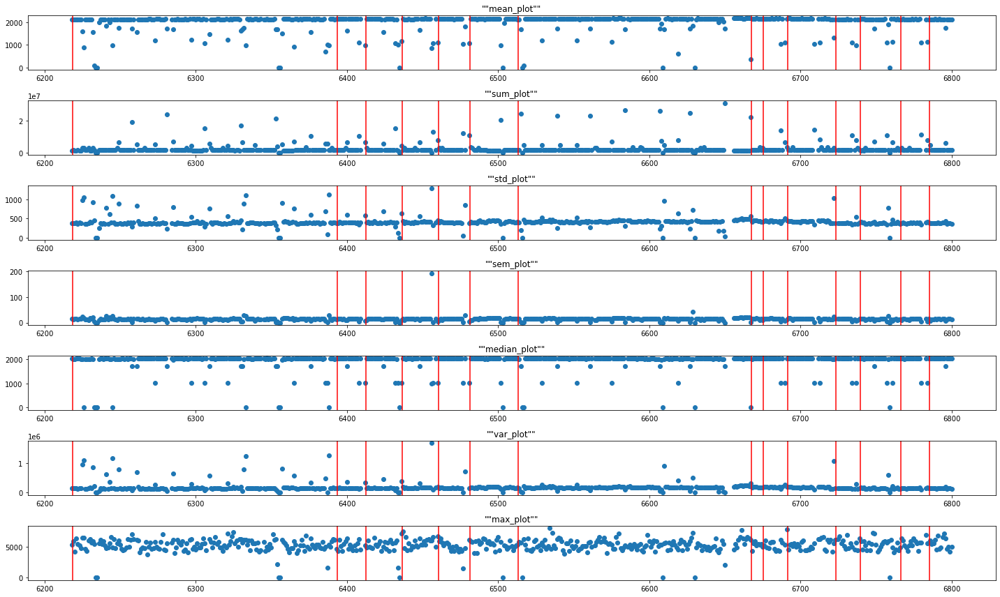

In [115]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(temp),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool1_stat.index, tool1_stat.iloc[:,idx])
    for chl_idx in change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_stat.iloc[:,idx].name))
plt.tight_layout()

# Shot기준 raw 극단치(max) 제거 시각화

In [116]:
tool_1

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218,0.0,4.250000,0.000000,0.000000,12000.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218,0.0,3.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218,2.0,3.333333,456.666667,5.333333,0.0,116.0,1.0,operation
2022-08-03 08:57:22,2022-08-03,8,57,22,101.0,6218,100.0,30.400000,5262.800000,170.000000,2414.2,98.2,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800,29.2,2.000000,2050.200000,299.400000,75.0,0.4,1.0,operation
2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800,28.8,2.000000,2016.400000,299.200000,75.0,0.4,1.0,operation
2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800,27.4,1227.200000,2014.000000,299.400000,12015.0,0.4,1.0,operation


In [117]:
tool1_max_del = tool_1.drop(tool_1.loc[tool_1.groupby('shot_no')['current_spindle'].idxmax()].index, axis = 0)
tool1_max_del

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218,0.0,4.250000,0.000000,0.000000,12000.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218,0.0,3.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218,2.0,3.333333,456.666667,5.333333,0.0,116.0,1.0,operation
2022-08-03 08:57:23,2022-08-03,8,57,23,101.0,6218,186.0,1019.000000,3723.000000,299.250000,5000.0,1.5,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800,29.2,2.000000,2050.200000,299.400000,75.0,0.4,1.0,operation
2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800,28.8,2.000000,2016.400000,299.200000,75.0,0.4,1.0,operation
2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800,27.4,1227.200000,2014.000000,299.400000,12015.0,0.4,1.0,operation


In [118]:
tool_1.groupby('shot_no').max()

,date,hour,minute,second,tool_number,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
shot_no,,,,,,,,,,,,,
6218,2022-08-03,9,8,9,101.0,580.6,1527.8,5262.8,300.0,12000.0,116.000000,1.0,operation
6219,2022-08-03,9,52,9,101.0,442.8,1489.0,5851.8,300.0,10628.6,153.333333,1.0,operation
6220,2022-08-03,10,37,9,101.0,500.2,1540.4,4215.2,302.0,12000.0,114.400000,1.0,operation
6221,2022-08-03,11,9,9,101.0,429.4,1581.0,6344.0,300.6,7200.0,137.600000,1.0,operation
6222,2022-08-03,12,59,9,101.0,542.2,1469.4,5409.8,300.0,7200.0,144.250000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6796,2022-09-03,20,9,9,101.0,916.8,2374.0,6320.6,300.0,23313.6,126.600000,1.0,operation
6797,2022-09-03,20,47,9,101.0,953.2,2198.6,4635.4,302.6,20000.0,136.000000,1.0,operation
6798,2022-09-03,21,29,9,101.0,1139.0,2121.4,4941.0,300.0,18967.0,145.333333,1.0,operation


In [119]:
tool1_mean_max_del = pd.Series(tool1_max_del.groupby('shot_no').mean()['current_spindle'], name = 'mean')
tool1_sum_max_del = pd.Series(tool1_max_del.groupby('shot_no').sum()['current_spindle'], name = 'sum')
tool1_std_max_del = pd.Series(tool1_max_del.groupby('shot_no').std()['current_spindle'], name = 'std')
tool1_sem_max_del = pd.Series(tool1_max_del.groupby('shot_no').sem()['current_spindle'], name = 'sem')
tool1_median_max_del = pd.Series(tool1_max_del.groupby('shot_no').median()['current_spindle'], name = 'median')
tool1_var_max_del = pd.Series(tool1_max_del.groupby('shot_no').var()['current_spindle'], name = 'var')
tool1_max_max_del = pd.Series(tool1_max_del.groupby('shot_no').max()['current_spindle'], name = 'max')
temp_max_del = [tool1_mean_max_del, tool1_sum_max_del, tool1_std_max_del, tool1_sem_max_del, tool1_median_max_del, tool1_var_max_del, tool1_max_max_del]
tool1_stat_max_del = pd.Series()
for add_max_del in temp_max_del:
    tool1_stat_max_del = pd.concat([tool1_stat_max_del, add_max_del], axis = 1)
tool1_stat_max_del.drop(0, axis = 1, inplace = True)
tool1_stat_max_del

,mean,sum,std,sem,median,var,max
6218,2118.525854,1.425768e+06,366.981865,14.146111,2020.200000,134675.689368,3780.4
6219,2100.863053,1.550437e+06,346.823125,12.766736,2018.708333,120286.280050,3824.2
6220,2122.196607,1.428238e+06,370.613063,14.286084,2019.500000,137354.042567,4059.6
6221,2119.516691,1.424315e+06,362.385702,13.979332,2020.000000,131323.397334,3832.5
6222,2122.700565,1.566553e+06,341.838548,12.583251,2029.600000,116853.593174,3648.6
...,...,...,...,...,...,...,...
6796,1739.418862,6.098403e+06,426.870880,7.209258,1716.000000,182218.748413,5070.0
6797,2121.520787,1.535981e+06,354.046305,13.158027,2023.500000,125348.785913,3768.6
6798,2123.277509,1.537253e+06,365.553933,13.585705,2020.400000,133629.678038,3652.4
6799,2121.441609,1.538045e+06,369.296119,13.715314,2020.400000,136379.623431,3832.0


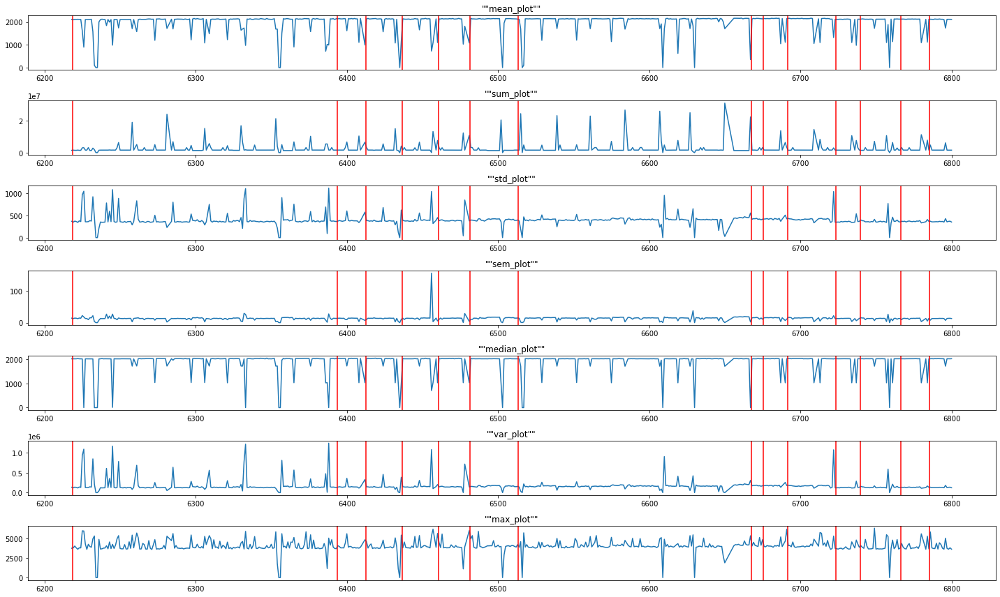

In [120]:
fig = plt.figure(figsize = (20, 12))

for idx_max_del in range(len(temp_max_del)):
    globals()['ax{}'.format(idx_max_del)] = fig.add_subplot(len(temp_max_del),1,idx_max_del+1)
    globals()['ax{}'.format(idx_max_del)].plot(tool1_stat_max_del.iloc[:,idx_max_del])
    for chl_idx_max_del in change_shot:
        globals()['ax{}'.format(idx_max_del)].axvline(chl_idx_max_del, color = 'red', label = '{}'.format(chl_idx_max_del), linestyle = 'solid')
    globals()['ax{}'.format(idx_max_del)].set_title('""{}_plot""'.format(tool1_stat_max_del.iloc[:,idx_max_del].name))
plt.tight_layout()

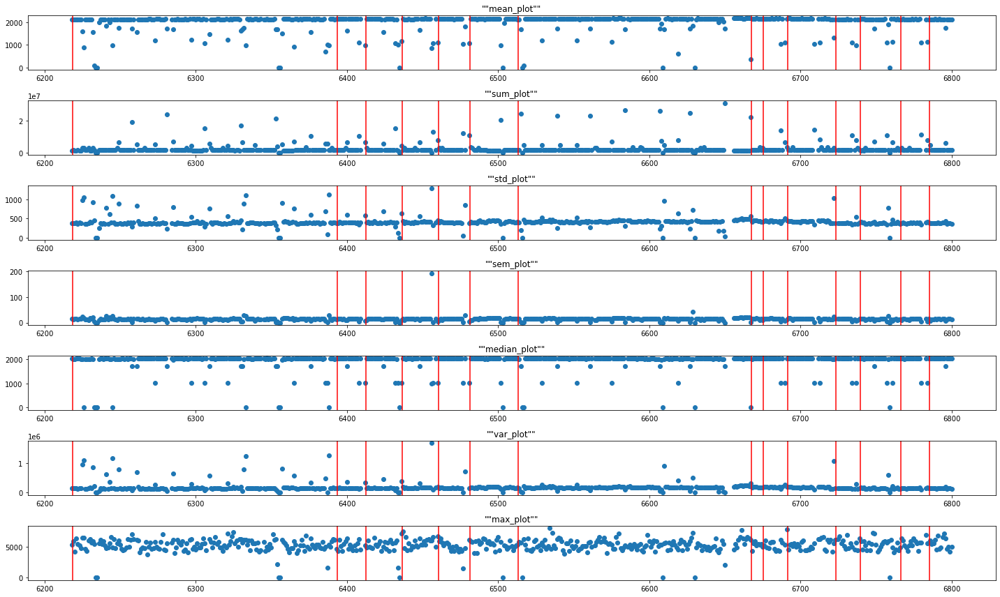

In [121]:
fig = plt.figure(figsize = (20, 12))

for idx_max_del_sc in range(len(temp_max_del)):
    globals()['ax{}'.format(idx_max_del_sc)] = fig.add_subplot(len(temp_max_del),1,idx_max_del_sc+1)
    globals()['ax{}'.format(idx_max_del_sc)].scatter(tool1_stat.index, tool1_stat.iloc[:,idx_max_del_sc])
    for chl_idx_max_del_sc in change_shot:
        globals()['ax{}'.format(idx_max_del_sc)].axvline(chl_idx_max_del_sc, color = 'red', label = '{}'.format(chl_idx_max_del_sc), linestyle = 'solid')
    globals()['ax{}'.format(idx_max_del_sc)].set_title('""{}_plot""'.format(tool1_stat.iloc[:,idx_max_del_sc].name))
plt.tight_layout()

# Raw data Scaling 적용 후 시각화

In [122]:
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [123]:
tool_1.head()

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218,0.0,4.250000,0.000000,0.000000,12000.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218,0.0,3.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218,2.0,3.333333,456.666667,5.333333,0.0,116.0,1.0,operation
2022-08-03 08:57:22,2022-08-03,8,57,22,101.0,6218,100.0,30.400000,5262.800000,170.000000,2414.2,98.2,1.0,operation


In [124]:
tool_1_mod = tool_1.reset_index()
tool_1_mod_info = tool_1_mod[['datetime', 'date', 'hour', 'minute', 'second', 'tool_number', 'shot_no', 'tool', 'state']]
tool_1_mod_value = tool_1_mod[['current_x', 'current_z','current_spindle', 'rpm', 'feed', 'load_1']]

In [125]:
stdS = StandardScaler()
mmS = MinMaxScaler()
rS = RobustScaler()
tool1_stdS = pd.DataFrame(stdS.fit_transform(tool_1_mod_value), columns = tool_1_mod_value.columns)
tool1_stdS = pd.concat([tool_1_mod_info, tool1_stdS], axis = 1)
tool1_mmS = pd.DataFrame(mmS.fit_transform(tool_1_mod_value), columns = tool_1_mod_value.columns)
tool1_mmS = pd.concat([tool_1_mod_info, tool1_mmS], axis = 1)
tool1_rS = pd.DataFrame(rS.fit_transform(tool_1_mod_value), columns = tool_1_mod_value.columns)
tool1_rS = pd.concat([tool_1_mod_info, tool1_rS], axis = 1)
tool1_stdS

,datetime,date,hour,minute,second,tool_number,shot_no,tool,state,current_x,current_z,current_spindle,rpm,feed,load_1
0,2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218,1.0,cancel,-0.458411,-0.118691,-1.878331,-1.110910,-0.158074,-0.222795
1,2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218,1.0,cancel,-0.458411,-0.100341,-1.878331,-1.110910,17.418370,-0.222795
2,2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218,1.0,cancel,-0.458411,-0.110535,-1.878331,-1.110910,-0.158074,-0.222795
3,2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218,1.0,operation,-0.410085,-0.107816,-1.305201,-1.071223,-0.158074,25.183160
4,2022-08-03 08:57:22,2022-08-03,8,57,22,101.0,6218,1.0,operation,1.957898,0.112927,4.726631,0.154099,3.378014,21.284660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
983716,2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800,1.0,operation,0.247151,-0.118691,0.694728,1.116994,-0.048221,-0.135189
983717,2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800,1.0,operation,0.237486,-0.118691,0.652308,1.115505,-0.048221,-0.135189
983718,2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800,1.0,operation,0.203658,9.873494,0.649296,1.116994,17.440340,-0.135189
983719,2022-09-03 22:55:27,2022-09-03,22,55,27,101.0,6800,1.0,operation,12.449513,16.593670,0.649296,1.114017,21.804278,-0.135189


In [126]:
# Standard Scaler 기술통계값 도출
tool1_stdS_mean = pd.Series(tool1_stdS.groupby('shot_no').mean()['current_spindle'], name = 'mean')
tool1_stdS_sum = pd.Series(tool1_stdS.groupby('shot_no').sum()['current_spindle'], name = 'sum')
tool1_stdS_std = pd.Series(tool1_stdS.groupby('shot_no').std()['current_spindle'], name = 'std')
tool1_stdS_sem = pd.Series(tool1_stdS.groupby('shot_no').sem()['current_spindle'], name = 'sem')
tool1_stdS_median = pd.Series(tool1_stdS.groupby('shot_no').median()['current_spindle'], name = 'median')
tool1_stdS_var = pd.Series(tool1_stdS.groupby('shot_no').var()['current_spindle'], name = 'var')
tool1_stdS_max = pd.Series(tool1_stdS.groupby('shot_no').max()['current_spindle'], name = 'max')
temp_stdS = [tool1_stdS_mean, tool1_stdS_sum, tool1_stdS_std, tool1_stdS_sem, tool1_stdS_median, tool1_stdS_var, tool1_stdS_max]
tool1_stdS_stat = pd.Series()
for add_stdS in temp_stdS:
    tool1_stdS_stat = pd.concat([tool1_stdS_stat, add_stdS], axis = 1)
tool1_stdS_stat.drop([0], axis = 1, inplace = True)
tool1_stdS_stat

,mean,sum,std,sem,median,var,max
6218,0.786334,529.988786,0.484681,0.018669,0.657077,0.234916,4.726631
6219,0.764682,565.099637,0.468181,0.017222,0.655257,0.219193,5.465842
6220,0.788983,531.774461,0.475670,0.018322,0.656261,0.226262,3.411864
6221,0.789600,531.400895,0.498304,0.019208,0.656826,0.248307,6.083567
6222,0.791300,584.771051,0.454792,0.016730,0.668874,0.206836,4.911120
...,...,...,...,...,...,...,...
6796,0.306328,1074.293039,0.544386,0.009193,0.275297,0.296356,6.054200
6797,0.788589,571.727111,0.459231,0.017055,0.661344,0.210893,3.939226
6798,0.791320,573.706876,0.476904,0.017712,0.657579,0.227438,4.322763
6799,0.787621,571.812544,0.472567,0.017539,0.657453,0.223320,3.312465


In [127]:
# MinMax 기술통계값 도출
tool1_mmS_mean = pd.Series(tool1_mmS.groupby('shot_no').mean()['current_spindle'], name = 'mean')
tool1_mmS_sum = pd.Series(tool1_mmS.groupby('shot_no').sum()['current_spindle'], name = 'sum')
tool1_mmS_std = pd.Series(tool1_mmS.groupby('shot_no').std()['current_spindle'], name = 'std')
tool1_mmS_sem = pd.Series(tool1_mmS.groupby('shot_no').sem()['current_spindle'], name = 'sem')
tool1_mmS_median = pd.Series(tool1_mmS.groupby('shot_no').median()['current_spindle'], name = 'median')
tool1_mmS_var = pd.Series(tool1_mmS.groupby('shot_no').var()['current_spindle'], name = 'var')
tool1_mmS_max = pd.Series(tool1_mmS.groupby('shot_no').var()['current_spindle'], name = 'max')
temp_mmS = [tool1_mmS_mean, tool1_mmS_sum, tool1_mmS_std, tool1_mmS_sem, tool1_mmS_median, tool1_mmS_var, tool1_mmS_max]
tool1_mmS_stat = pd.Series()
for add_mmS in temp_mmS:
    tool1_mmS_stat = pd.concat([tool1_mmS_stat, add_mmS], axis = 1)
tool1_mmS_stat.drop([0], axis = 1, inplace = True)
tool1_mmS_stat

,mean,sum,std,sem,median,var,max
6218,0.266197,179.417089,0.048419,0.001865,0.253285,0.002344,0.002344
6219,0.264034,195.121456,0.046771,0.001720,0.253103,0.002188,0.002188
6220,0.266462,179.595476,0.047519,0.001830,0.253203,0.002258,0.002258
6221,0.266524,179.370514,0.049780,0.001919,0.253260,0.002478,0.002478
6222,0.266694,197.086612,0.045433,0.001671,0.254463,0.002064,0.002064
...,...,...,...,...,...,...,...
6796,0.218245,765.386551,0.054384,0.000918,0.215145,0.002958,0.002958
6797,0.266423,193.156526,0.045877,0.001704,0.253711,0.002105,0.002105
6798,0.266696,193.354302,0.047642,0.001769,0.253335,0.002270,0.002270
6799,0.266326,193.352704,0.047209,0.001752,0.253322,0.002229,0.002229


In [128]:
# Robust 기술통계값 도출
tool1_rS_mean = pd.Series(tool1_rS.groupby('shot_no').mean()['current_spindle'], name = 'mean')
tool1_rS_sum = pd.Series(tool1_rS.groupby('shot_no').sum()['current_spindle'], name = 'sum')
tool1_rS_std = pd.Series(tool1_rS.groupby('shot_no').std()['current_spindle'], name = 'std')
tool1_rS_sem = pd.Series(tool1_rS.groupby('shot_no').sem()['current_spindle'], name = 'sem')
tool1_rS_median = pd.Series(tool1_rS.groupby('shot_no').median()['current_spindle'], name = 'median')
tool1_rS_var = pd.Series(tool1_rS.groupby('shot_no').var()['current_spindle'], name = 'var')
tool1_rS_max = pd.Series(tool1_rS.groupby('shot_no').var()['current_spindle'], name = 'max')
temp_rS = [tool1_rS_mean, tool1_rS_sum, tool1_rS_std, tool1_rS_sem, tool1_rS_median, tool1_rS_var, tool1_rS_max]
tool1_rS_stat = pd.Series()
for add_rS in temp_rS:
    tool1_rS_stat = pd.concat([tool1_rS_stat, add_rS], axis = 1)
tool1_rS_stat.drop([0], axis = 1, inplace = True)
tool1_rS_stat

,mean,sum,std,sem,median,var,max
6218,0.408091,275.053317,0.389725,0.015012,0.304158,0.151886,0.151886
6219,0.390681,288.713200,0.376457,0.013848,0.302694,0.141720,0.141720
6220,0.410221,276.489152,0.382479,0.014733,0.303502,0.146290,0.146290
6221,0.410718,276.412961,0.400679,0.015445,0.303956,0.160543,0.160543
6222,0.412085,304.530695,0.365692,0.013452,0.313644,0.133730,0.133730
...,...,...,...,...,...,...,...
6796,0.022126,77.595059,0.437733,0.007392,-0.002826,0.191610,0.191610
6797,0.409905,297.180890,0.369261,0.013714,0.307589,0.136354,0.136354
6798,0.412100,298.772790,0.383472,0.014242,0.304561,0.147051,0.147051
6799,0.409126,297.025397,0.379984,0.014103,0.304460,0.144388,0.144388


# 스케일러 비교 시각화

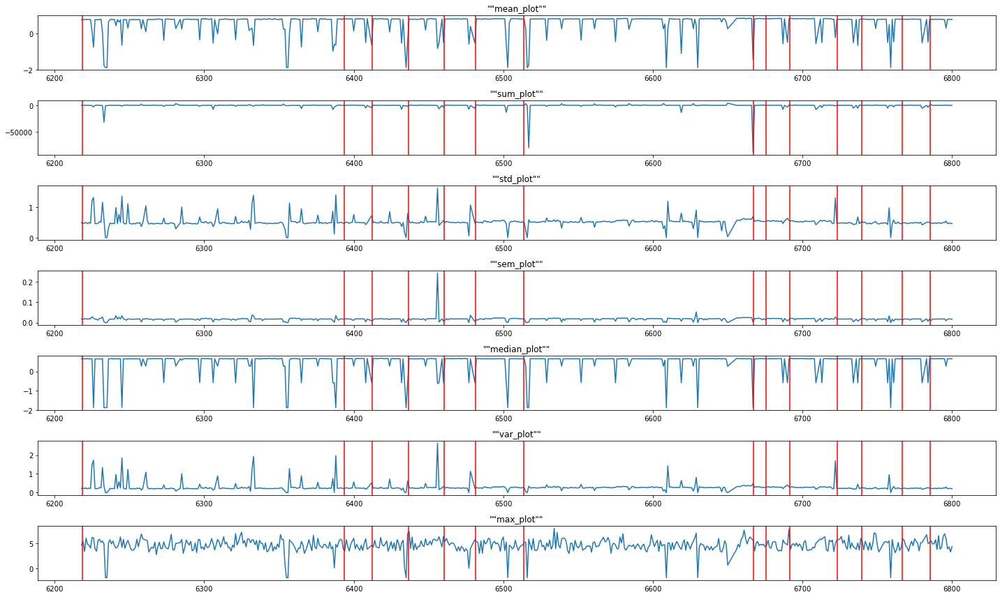

In [129]:
# Standard Scaler line plot 시각화
fig = plt.figure(figsize = (20, 12))

for scaler1 in range(len(temp_stdS)):
    locals()['ax{}'.format(scaler1)] = fig.add_subplot(len(temp_stdS),1,scaler1+1)
    locals()['ax{}'.format(scaler1)].plot(tool1_stdS_stat.iloc[:,scaler1])
    for chl_scaler1 in change_shot:
        locals()['ax{}'.format(scaler1)].axvline(chl_scaler1, color = 'red', label = '{}'.format(chl_scaler1), linestyle = 'solid')
    locals()['ax{}'.format(scaler1)].set_title('""{}_plot""'.format(tool1_stdS_stat.iloc[:,scaler1].name))
plt.tight_layout()

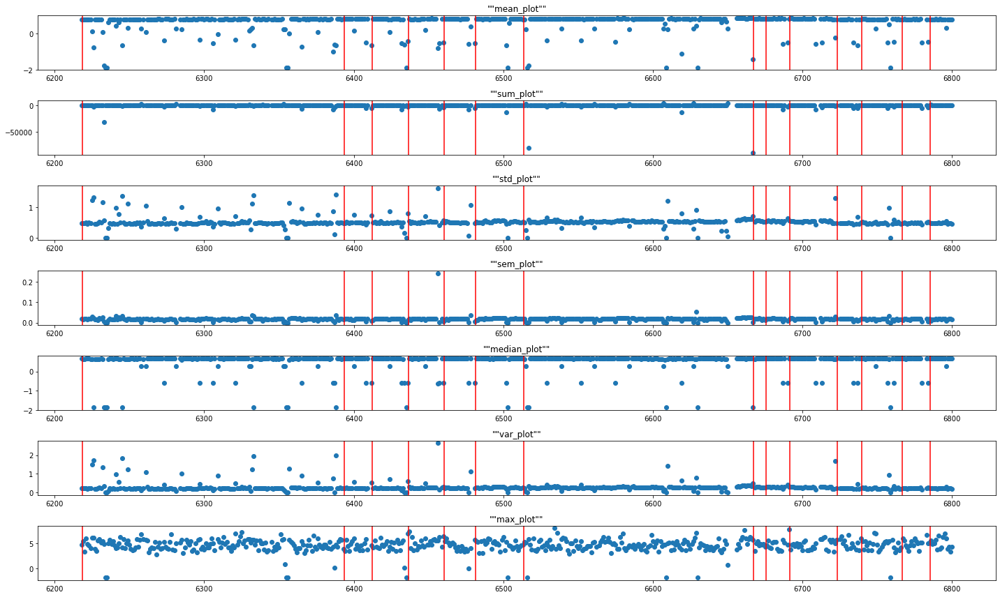

In [130]:
# Standard Scaler scatter plot 시각화

fig = plt.figure(figsize = (20, 12))

for scaler1_sc in range(len(temp_stdS)):
    locals()['ax{}'.format(scaler1_sc)] = fig.add_subplot(len(temp_stdS),1,scaler1_sc+1)
    locals()['ax{}'.format(scaler1_sc)].scatter(tool1_stdS_stat.index,tool1_stdS_stat.iloc[:,scaler1_sc])
    for chl_scaler1_sc in change_shot:
        locals()['ax{}'.format(scaler1_sc)].axvline(chl_scaler1_sc, color = 'red', label = '{}'.format(chl_scaler1_sc), linestyle = 'solid')
    locals()['ax{}'.format(scaler1_sc)].set_title('""{}_plot""'.format(tool1_stdS_stat.iloc[:,scaler1_sc].name))
plt.tight_layout()

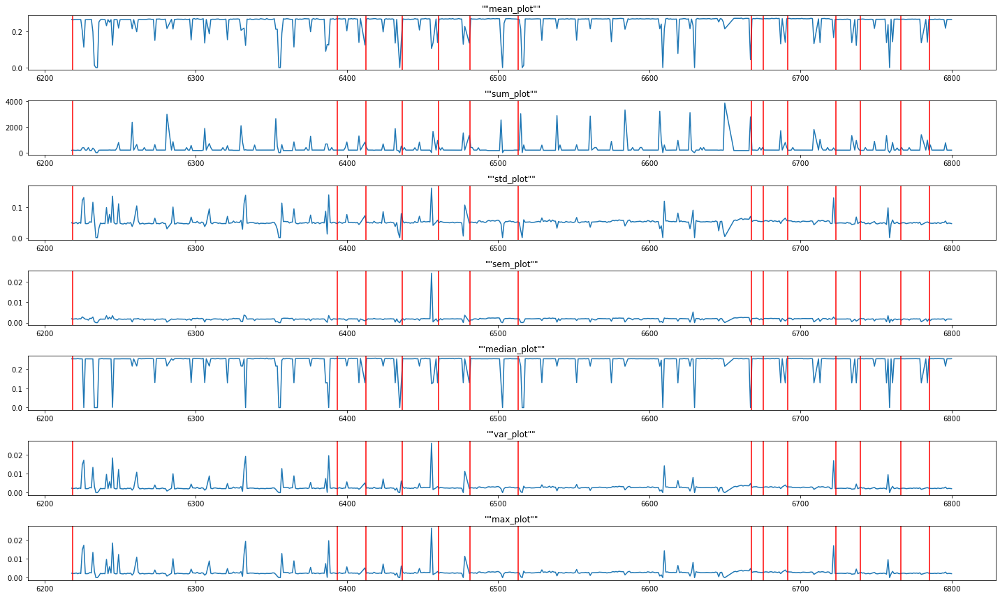

In [131]:
# Minmax Scaler line plot 시각화
fig = plt.figure(figsize = (20, 12))

for scaler2 in range(len(temp_mmS)):
    locals()['ax{}'.format(scaler2)] = fig.add_subplot(len(temp_mmS),1,scaler2+1)
    locals()['ax{}'.format(scaler2)].plot(tool1_mmS_stat.iloc[:,scaler2])
    for chl_scaler2 in change_shot:
        locals()['ax{}'.format(scaler2)].axvline(chl_scaler2, color = 'red', label = '{}'.format(chl_scaler2), linestyle = 'solid')
    locals()['ax{}'.format(scaler2)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,scaler2].name))
plt.tight_layout()

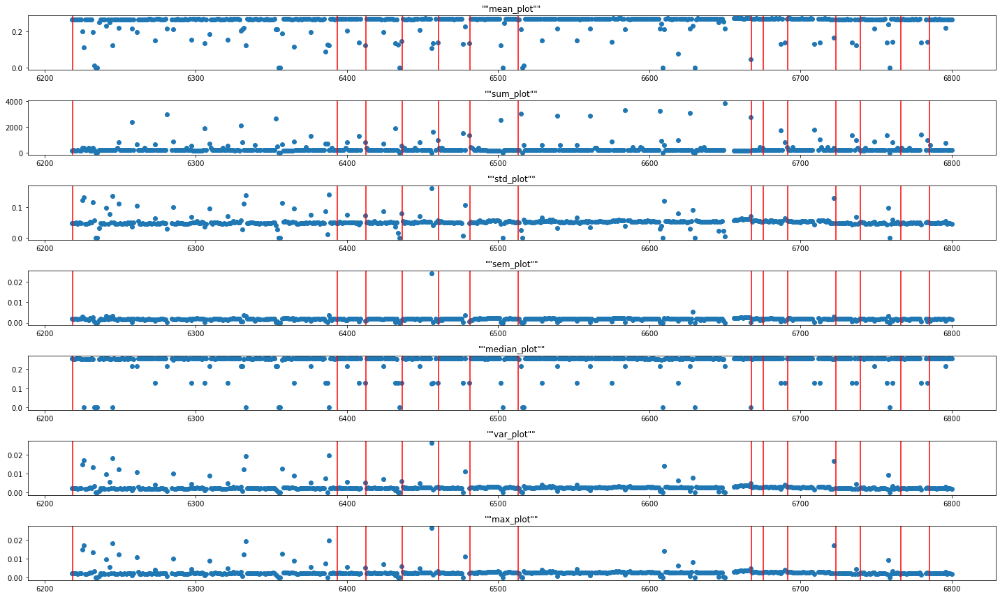

In [132]:
# Minmax Scaler scatter plot 시각화

fig = plt.figure(figsize = (20, 12))

for scaler2_mmS in range(len(temp_mmS)):
    locals()['ax{}'.format(scaler2_mmS)] = fig.add_subplot(len(temp_mmS),1,scaler2_mmS+1)
    locals()['ax{}'.format(scaler2_mmS)].scatter(tool1_mmS_stat.index,tool1_mmS_stat.iloc[:,scaler2_mmS])
    for chl_scaler2_mmS in change_shot:
        locals()['ax{}'.format(scaler2_mmS)].axvline(chl_scaler2_mmS, color = 'red', label = '{}'.format(chl_scaler2_mmS), linestyle = 'solid')
    locals()['ax{}'.format(scaler2_mmS)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,scaler2_mmS].name))
plt.tight_layout()

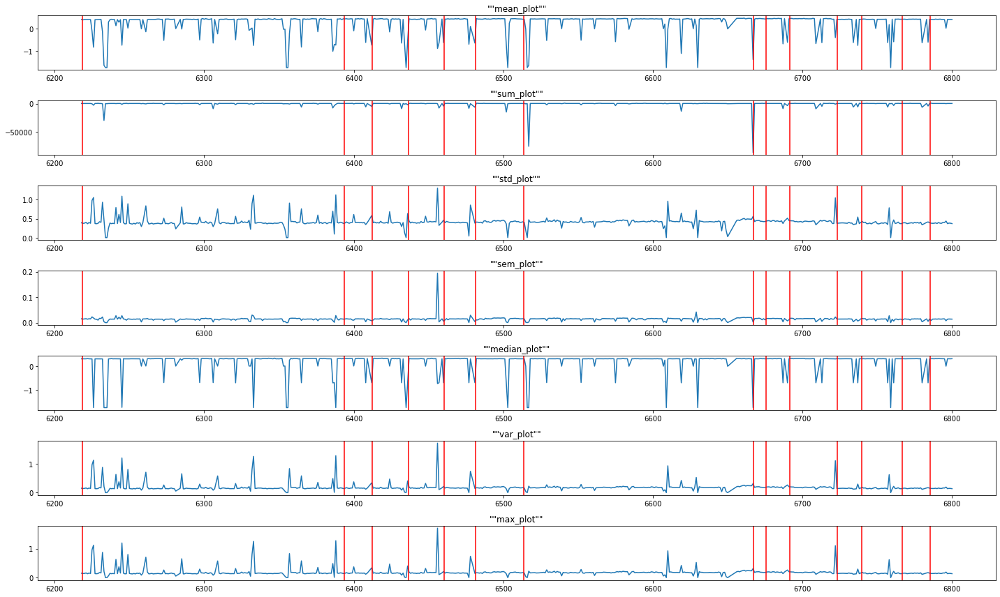

In [133]:
# Robust Scaler line plot 시각화
fig = plt.figure(figsize = (20, 12))

for scaler3 in range(len(temp_rS)):
    locals()['ax{}'.format(scaler3)] = fig.add_subplot(len(temp_rS),1,scaler3+1)
    locals()['ax{}'.format(scaler3)].plot(tool1_rS_stat.iloc[:,scaler3])
    for chl_scaler3 in change_shot:
        locals()['ax{}'.format(scaler3)].axvline(chl_scaler3, color = 'red', label = '{}'.format(chl_scaler3), linestyle = 'solid')
    locals()['ax{}'.format(scaler3)].set_title('""{}_plot""'.format(tool1_rS_stat.iloc[:,scaler3].name))
plt.tight_layout()

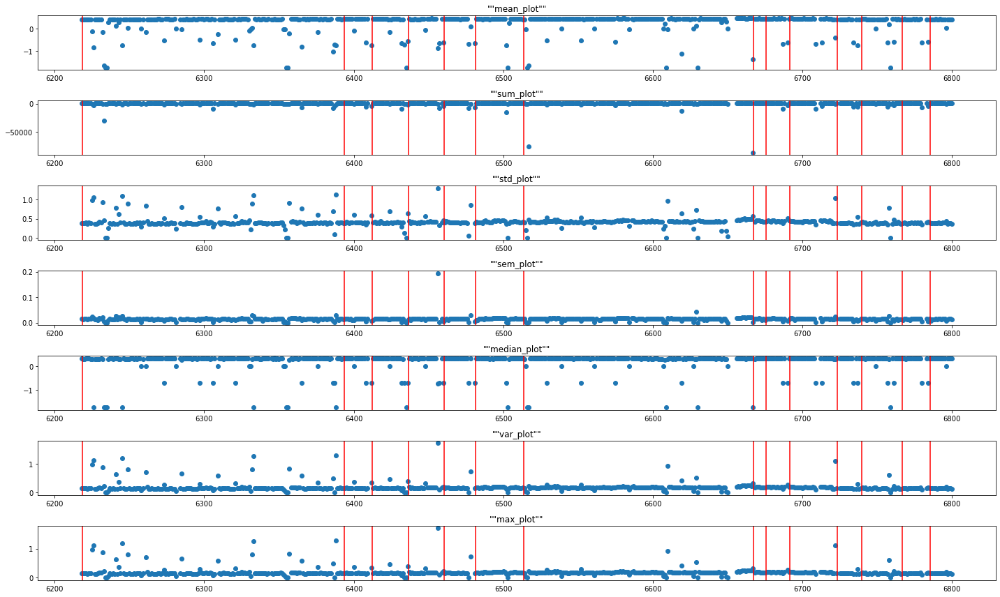

In [134]:
# Robust Scaler scatter plot 시각화

fig = plt.figure(figsize = (20, 12))

for scaler2_rS in range(len(temp_rS)):
    locals()['ax{}'.format(scaler2_rS)] = fig.add_subplot(len(temp_rS),1,scaler2_rS+1)
    locals()['ax{}'.format(scaler2_rS)].scatter(tool1_rS_stat.index,tool1_rS_stat.iloc[:,scaler2_rS])
    for chl_scaler2_rS in change_shot:
        locals()['ax{}'.format(scaler2_rS)].axvline(chl_scaler2_rS, color = 'red', label = '{}'.format(chl_scaler2_rS), linestyle = 'solid')
    locals()['ax{}'.format(scaler2_rS)].set_title('""{}_plot""'.format(tool1_rS_stat.iloc[:,scaler2_rS].name))
plt.tight_layout()

# 통계치의 scaling - 통계치 간의 단위 변환(분포 비교)

In [135]:
tool1_stat.index

Index([6218, 6219, 6220, 6221, 6222, 6223, 6224, 6225, 6226, 6227,
       ...
       6791, 6792, 6793, 6794, 6795, 6796, 6797, 6798, 6799, 6800],
      dtype='object', length=559)

In [136]:
# 기술통계값의 standard scaler 도출
tool1_stat_stdS = pd.DataFrame(stdS.fit_transform(tool1_stat), columns = tool1_stat.columns, index = tool1_stat.index)
tool1_stat_mmS = pd.DataFrame(mmS.fit_transform(tool1_stat), columns = tool1_stat.columns, index = tool1_stat.index)
tool1_stat_rS = pd.DataFrame(rS.fit_transform(tool1_stat), columns = tool1_stat.columns, index = tool1_stat.index)
tool1_stat_mmS

,mean,sum,std,sem,median,var,max
6218,0.971978,0.046390,0.298487,0.077126,0.985944,0.089095,0.659829
6219,0.964080,0.050451,0.288326,0.071149,0.985237,0.083132,0.733676
6220,0.972944,0.046436,0.292938,0.075692,0.985627,0.085812,0.528485
6221,0.973169,0.046378,0.306877,0.079353,0.985847,0.094173,0.795386
6222,0.973789,0.050959,0.280080,0.069114,0.990532,0.078445,0.678260
...,...,...,...,...,...,...,...
6796,0.796888,0.197898,0.335256,0.037977,0.837482,0.112397,0.792452
6797,0.972800,0.049942,0.282814,0.070459,0.987604,0.079984,0.581169
6798,0.973797,0.049994,0.293698,0.073171,0.986140,0.086259,0.619483
6799,0.972447,0.049993,0.291027,0.072455,0.986091,0.084697,0.518556


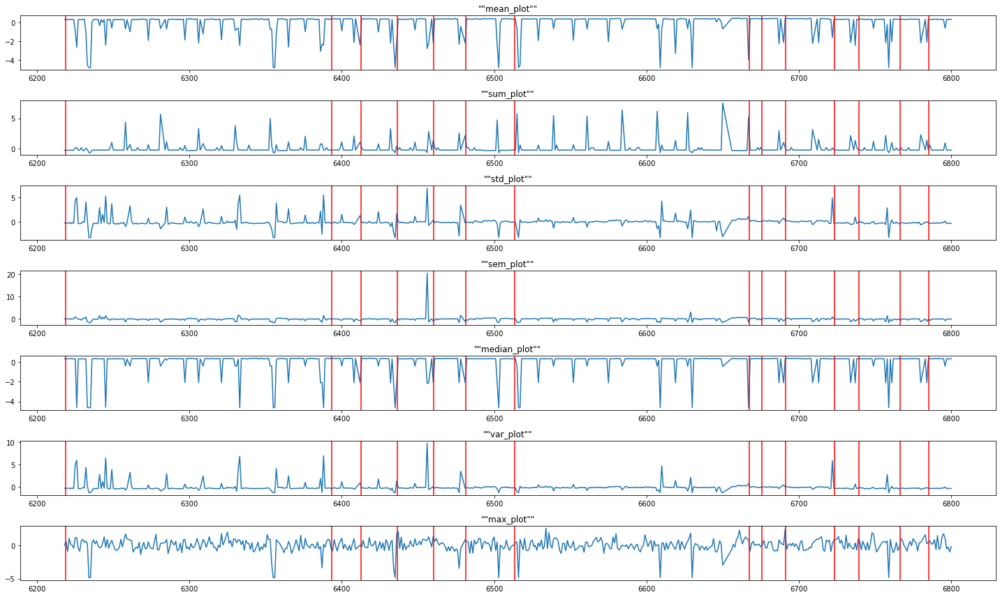

In [137]:
# statistics stadard scaler 시각화
fig = plt.figure(figsize = (20, 12))

for statistics_stdS in range(len(temp_stdS)):
    locals()['ax{}'.format(statistics_stdS)] = fig.add_subplot(len(temp_stdS),1,statistics_stdS+1)
    locals()['ax{}'.format(statistics_stdS)].plot(tool1_stat_stdS[tool1_stat_stdS.columns[statistics_stdS]])
    for chl_statistics_stdS in change_shot:
        locals()['ax{}'.format(statistics_stdS)].axvline(chl_statistics_stdS, color = 'red', label = '{}'.format(chl_statistics_stdS), linestyle = 'solid')
    locals()['ax{}'.format(statistics_stdS)].set_title('""{}_plot""'.format(tool1_stdS_stat.iloc[:,statistics_stdS].name))
plt.tight_layout()

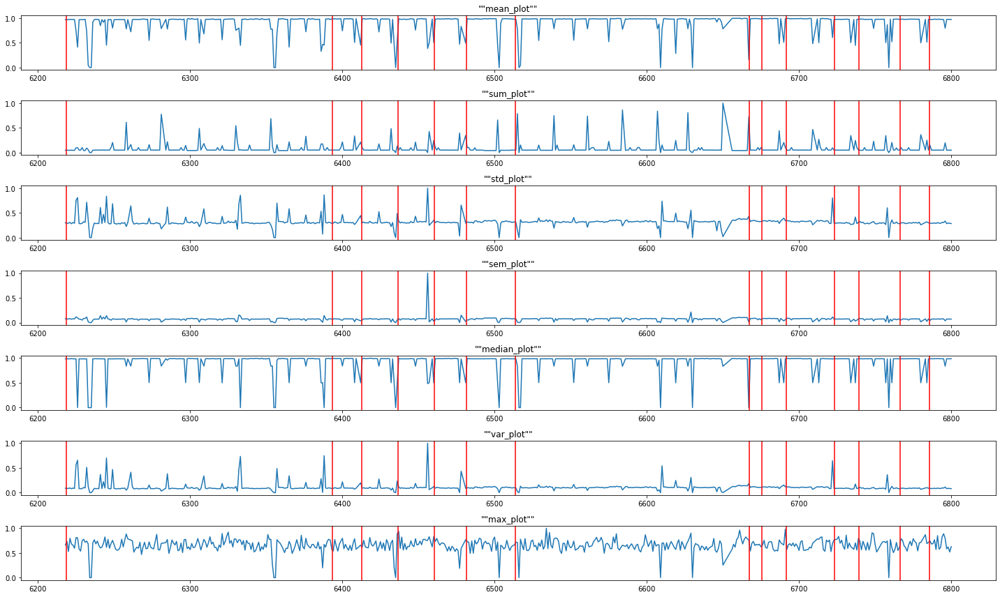

In [138]:
# statistics minmax scaler 시각화
fig = plt.figure(figsize = (20, 12))

for statistics_mmS in range(len(temp_mmS)):
    locals()['ax{}'.format(statistics_mmS)] = fig.add_subplot(len(temp_mmS),1,statistics_mmS+1)
    locals()['ax{}'.format(statistics_mmS)].plot(tool1_stat_mmS[tool1_stat_mmS.columns[statistics_mmS]])
    for chl_statistics_mmS in change_shot:
        locals()['ax{}'.format(statistics_mmS)].axvline(chl_statistics_mmS, color = 'red', label = '{}'.format(chl_statistics_mmS), linestyle = 'solid')
    locals()['ax{}'.format(statistics_mmS)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,statistics_mmS].name))
plt.tight_layout()

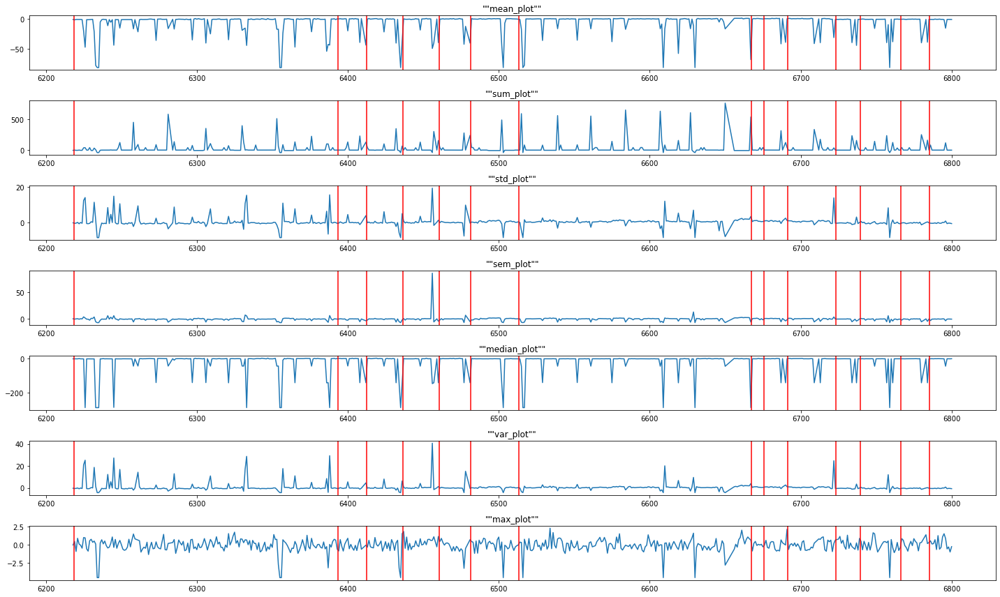

In [139]:
# statistics robust scaler 시각화
fig = plt.figure(figsize = (20, 12))

for statistics_rS in range(len(temp_rS)):
    locals()['ax{}'.format(statistics_rS)] = fig.add_subplot(len(temp_rS),1,statistics_rS+1)
    locals()['ax{}'.format(statistics_rS)].plot(tool1_stat_rS[tool1_stat_rS.columns[statistics_rS]])
    for chl_statistics_rS in change_shot:
        locals()['ax{}'.format(statistics_rS)].axvline(chl_statistics_rS, color = 'red', label = '{}'.format(chl_statistics_rS), linestyle = 'solid')
    locals()['ax{}'.format(statistics_rS)].set_title('""{}_plot""'.format(tool1_rS_stat.iloc[:,statistics_rS].name))
plt.tight_layout()

In [140]:
tool_1_mod1 = pd.concat([tool_1, change_data], axis = 0)
tool_1_mod1 = tool_1_mod1.reset_index()
tool_1_mod1['datetime'] = pd.to_datetime(tool_1_mod1['datetime'])
tool_1_mod1.set_index('datetime', inplace = True)
tool_1_mod1 = tool_1_mod1.sort_index(ascending = True)
tool_1_mod1.reset_index(inplace = True)
tool_1_mod1

,datetime,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
0,2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218.0,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
1,2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218.0,0.0,4.250000,0.000000,0.000000,12000.0,0.0,1.0,cancel
2,2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218.0,0.0,3.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
3,2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218.0,2.0,3.333333,456.666667,5.333333,0.0,116.0,1.0,operation
4,2022-08-03 08:57:22,2022-08-03,8,57,22,101.0,6218.0,100.0,30.400000,5262.800000,170.000000,2414.2,98.2,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
983730,2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800.0,29.2,2.000000,2050.200000,299.400000,75.0,0.4,1.0,operation
983731,2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800.0,28.8,2.000000,2016.400000,299.200000,75.0,0.4,1.0,operation
983732,2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800.0,27.4,1227.200000,2014.000000,299.400000,12015.0,0.4,1.0,operation
983733,2022-09-03 22:55:27,2022-09-03,22,55,27,101.0,6800.0,534.2,2051.200000,2014.000000,299.000000,14994.4,0.4,1.0,operation


In [141]:
tool_1_mod1.groupby('shot_no').current_spindle.cumsum().head(100)

0          0.000000
1          0.000000
2          0.000000
3        456.666667
4       5719.466667
5       9442.466667
6      11866.266667
7      13927.066667
8      15950.866667
9      17966.466667
10     19980.466667
11     21997.866667
12     24016.866667
13     26036.466667
14     28056.666667
15     30077.266667
16     32097.666667
17     34118.066667
18     36139.066667
19     38160.266667
20     40182.266667
21     42203.466667
22     44225.866667
23     46249.266667
24     48273.266667
25     50297.666667
26     52321.066667
27     54345.066667
28     56368.266667
29     58391.266667
30     60413.666667
31     62435.666667
32     64457.666667
33     66479.066667
34     68500.666667
35     70522.266667
36     72543.866667
37     74563.866667
38     76582.866667
39     78601.866667
40     80619.866667
41     82637.866667
42     84655.866667
43     86672.866667
44     88690.466667
45     90707.466667
46     92724.466667
47     94741.466667
48     96758.866667
49     98776.466667


In [142]:
# 누적값 수동으로 작성
change1 = tool_1_mod1[tool_1_mod1['shot_no'] < 6393.5]
change1['spindle_cumsum'] = change1.groupby('shot_no').current_spindle.cumsum()
change2 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6393.5) & (tool_1_mod1['shot_no'] < 6412.5)]
change2['spindle_cumsum'] = change2.groupby('shot_no').current_spindle.cumsum()
con1 = pd.concat([change1, change2], axis = 0)
change3 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6412.5) & (tool_1_mod1['shot_no'] < 6436.5)]
change3['spindle_cumsum'] = change3.groupby('shot_no').current_spindle.cumsum()
con2 = pd.concat([con1, change3], axis = 0)
change4 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6436.5) & (tool_1_mod1['shot_no'] < 6460.5)]
change4['spindle_cumsum'] = change4.groupby('shot_no').current_spindle.cumsum()
con3 = pd.concat([con2, change4], axis = 0)
change5 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6460.5) & (tool_1_mod1['shot_no'] < 6481.5)]
change5['spindle_cumsum'] = change5.groupby('shot_no').current_spindle.cumsum()
con4 = pd.concat([con3, change5], axis = 0)
change6 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6481.5) & (tool_1_mod1['shot_no'] < 6513.5)]
change6['spindle_cumsum'] = change6.groupby('shot_no').current_spindle.cumsum()
con5 = pd.concat([con4, change6], axis = 0)
change7 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6513.5) & (tool_1_mod1['shot_no'] < 6667.5)]
change7['spindle_cumsum'] = change7.groupby('shot_no').current_spindle.cumsum()
con6 = pd.concat([con5, change7], axis = 0)
change8 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6667.5) & (tool_1_mod1['shot_no'] < 6675.5)]
change8['spindle_cumsum'] = change8.groupby('shot_no').current_spindle.cumsum()
con7 = pd.concat([con6, change8], axis = 0)
change9 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6675.5) & (tool_1_mod1['shot_no'] < 6691.5)]
change9['spindle_cumsum'] = change9.groupby('shot_no').current_spindle.cumsum()
con8 = pd.concat([con7, change9], axis = 0)
change10 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6691.5) & (tool_1_mod1['shot_no'] < 6723.5)]
change10['spindle_cumsum'] = change10.groupby('shot_no').current_spindle.cumsum()
con9 = pd.concat([con8, change10], axis = 0)
change11 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6723.5) & (tool_1_mod1['shot_no'] < 6739.5)]
change11['spindle_cumsum'] = change11.groupby('shot_no').current_spindle.cumsum()
con10 = pd.concat([con9, change11], axis = 0)
change12 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6739.5) & (tool_1_mod1['shot_no'] < 6766.5)]
change12['spindle_cumsum'] = change12.groupby('shot_no').current_spindle.cumsum()
con11 = pd.concat([con10, change12], axis = 0)
change13 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6766.5) & (tool_1_mod1['shot_no'] < 6785.5)]
change13['spindle_cumsum'] = change13.groupby('shot_no').current_spindle.cumsum()
con12 = pd.concat([con11, change13], axis = 0)
change14 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6785.5)]
change14['spindle_cumsum'] = change14.groupby('shot_no').current_spindle.cumsum()
con13 = pd.concat([con12, change14], axis = 0)
con13.set_index('datetime', inplace = True)

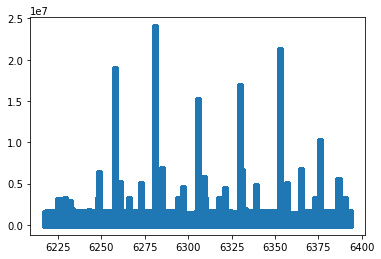

In [143]:
plt.scatter(change1['shot_no'], change1['spindle_cumsum'])

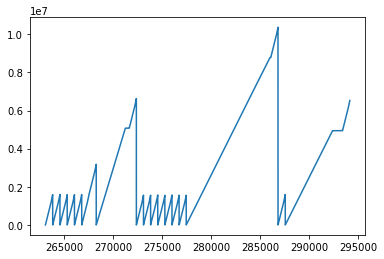

In [144]:
plt.plot(change2['spindle_cumsum'])

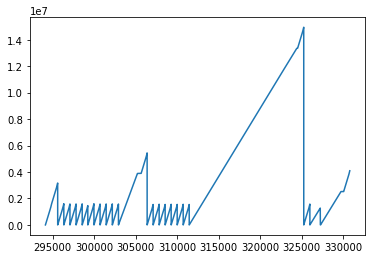

In [145]:
plt.plot(change3['spindle_cumsum'])

<AxesSubplot:>

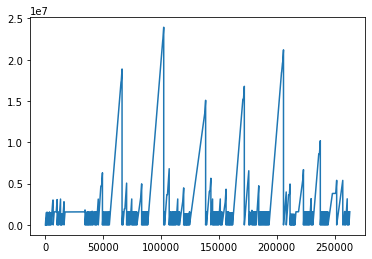

In [146]:
change1['spindle_cumsum'].plot()

In [147]:
tool_1_mod2 = pd.concat([con13, change_data], axis = 0)
tool_1_mod2 = tool_1_mod2.reset_index()
tool_1_mod2['datetime'] = pd.to_datetime(tool_1_mod2['datetime'])
tool_1_mod2.set_index('datetime', inplace = True)
tool_1_mod2 = tool_1_mod2.sort_index(ascending = True)
tool_1_mod2.reset_index(inplace = True)
tool_1_mod2

,datetime,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state,spindle_cumsum
0,2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218.0,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel,0.000000e+00
1,2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218.0,0.0,4.250000,0.000000,0.000000,12000.0,0.0,1.0,cancel,0.000000e+00
2,2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218.0,0.0,3.000000,0.000000,0.000000,0.0,0.0,1.0,cancel,0.000000e+00
3,2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218.0,2.0,3.333333,456.666667,5.333333,0.0,116.0,1.0,operation,4.566667e+02
4,2022-08-03 08:57:22,2022-08-03,8,57,22,101.0,6218.0,100.0,30.400000,5262.800000,170.000000,2414.2,98.2,1.0,operation,5.719467e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
983731,2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800.0,29.2,2.000000,2050.200000,299.400000,75.0,0.4,1.0,operation,1.532149e+06
983732,2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800.0,28.8,2.000000,2016.400000,299.200000,75.0,0.4,1.0,operation,1.534166e+06
983733,2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800.0,27.4,1227.200000,2014.000000,299.400000,12015.0,0.4,1.0,operation,1.536180e+06
983734,2022-09-03 22:55:27,2022-09-03,22,55,27,101.0,6800.0,534.2,2051.200000,2014.000000,299.000000,14994.4,0.4,1.0,operation,1.538194e+06


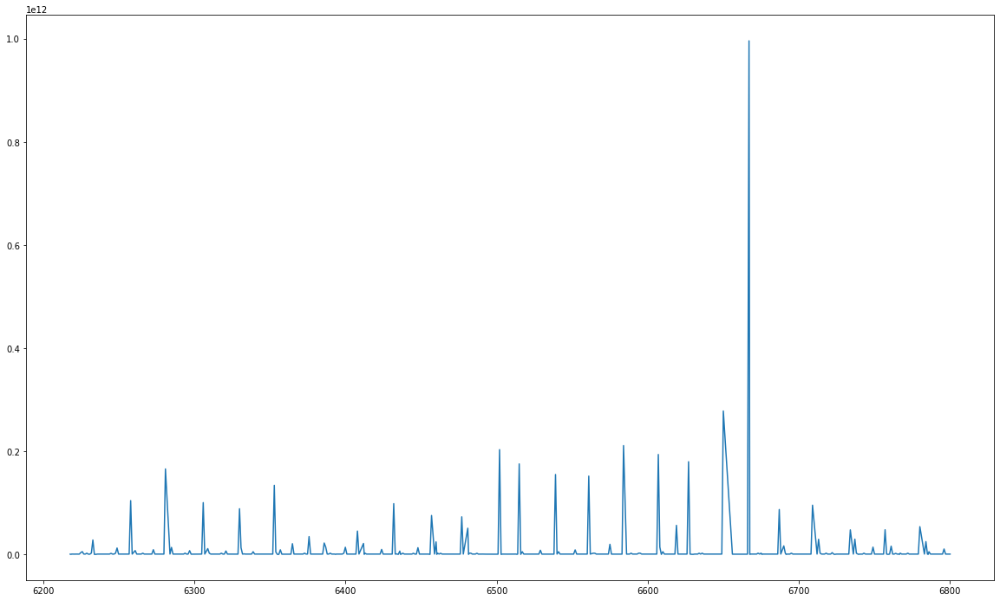

In [148]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1_mod2.groupby('shot_no').sum()['spindle_cumsum'])

<AxesSubplot:>

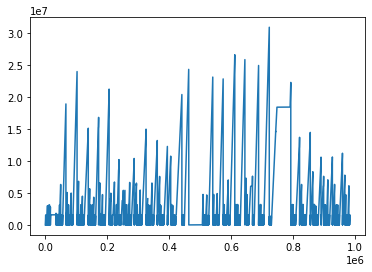

In [149]:

tool_1_mod2['spindle_cumsum'].plot()

In [150]:
tool_1_mod1[tool_1_mod1['shot_no'] == 6218.0]

,datetime,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
0,2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218.0,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
1,2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218.0,0.0,4.250000,0.000000,0.000000,12000.0,0.0,1.0,cancel
2,2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218.0,0.0,3.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
3,2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218.0,2.0,3.333333,456.666667,5.333333,0.0,116.0,1.0,operation
4,2022-08-03 08:57:22,2022-08-03,8,57,22,101.0,6218.0,100.0,30.400000,5262.800000,170.000000,2414.2,98.2,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
669,2022-08-03 09:08:27,2022-08-03,9,8,27,101.0,6218.0,112.2,1462.600000,2016.200000,299.200000,6242.6,0.4,1.0,operation
670,2022-08-03 09:08:28,2022-08-03,9,8,28,101.0,6218.0,417.6,1527.800000,2016.000000,299.000000,7071.0,0.6,1.0,operation
671,2022-08-03 09:08:29,2022-08-03,9,8,29,101.0,6218.0,291.8,1498.200000,2017.000000,299.200000,5828.4,0.8,1.0,operation
672,2022-08-03 09:08:30,2022-08-03,9,8,30,101.0,6218.0,9.0,1502.600000,2016.000000,299.200000,4000.0,0.8,1.0,operation


In [151]:
tool_1_mod1[tool_1_mod1['shot_no'] == 6219.0]

,datetime,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
675,2022-08-03 09:40:26,2022-08-03,9,40,26,100.0,6219.0,0.0,4.000000,0.0,0.000000,0.0,0.000000,1.0,cancel
676,2022-08-03 09:40:27,2022-08-03,9,40,27,100.0,6219.0,0.0,2.000000,0.0,0.000000,1028.6,0.000000,1.0,cancel
677,2022-08-03 09:40:28,2022-08-03,9,40,28,100.0,6219.0,0.0,5.000000,0.0,0.000000,10628.6,0.000000,1.0,cancel
678,2022-08-03 09:40:29,2022-08-03,9,40,29,100.0,6219.0,0.0,4.000000,0.0,0.000000,0.0,0.000000,1.0,cancel
679,2022-08-03 09:40:29,2022-08-03,9,40,29,101.0,6219.0,0.0,6.333333,1576.0,28.666667,0.0,153.333333,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1409,2022-08-03 09:52:39,2022-08-03,9,52,39,101.0,6219.0,26.0,1466.000000,2016.2,299.800000,5414.2,0.600000,1.0,operation
1410,2022-08-03 09:52:40,2022-08-03,9,52,40,101.0,6219.0,294.4,1447.800000,2017.0,299.000000,7071.0,0.600000,1.0,operation
1411,2022-08-03 09:52:41,2022-08-03,9,52,41,101.0,6219.0,351.2,1483.800000,2017.0,299.400000,6736.8,0.400000,1.0,operation
1412,2022-08-03 09:52:42,2022-08-03,9,52,42,101.0,6219.0,143.8,1485.000000,2016.0,299.000000,5000.0,0.400000,1.0,operation


In [152]:
tool_1_mod1[tool_1_mod1['shot_no'] == 6393.5]

,datetime,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
263118,2022-08-16 13:29:00,NaN,NaN,NaN,NaN,NaN,6393.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,change


In [153]:
tool_1_mod1[tool_1_mod1['shot_no'] == 6394]

,datetime,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
263119,2022-08-16 13:46:10,2022-08-16,13,46,10,100.0,6394.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
263120,2022-08-16 13:46:11,2022-08-16,13,46,11,100.0,6394.0,0.0,3.2,0.0,0.0,11314.2,0.0,1.0,cancel
263121,2022-08-16 13:46:12,2022-08-16,13,46,12,100.0,6394.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,cancel
263122,2022-08-16 13:46:12,2022-08-16,13,46,12,101.0,6394.0,0.0,2.0,0.0,5.0,0.0,156.0,1.0,operation
263123,2022-08-16 13:46:13,2022-08-16,13,46,13,101.0,6394.0,20.4,14.8,4296.4,192.4,1414.2,108.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263853,2022-08-16 13:58:23,2022-08-16,13,58,23,101.0,6394.0,426.4,1546.6,2015.6,299.0,7071.0,0.6,1.0,operation
263854,2022-08-16 13:58:24,2022-08-16,13,58,24,101.0,6394.0,387.8,1459.8,2019.0,299.2,7071.0,0.6,1.0,operation
263855,2022-08-16 13:58:25,2022-08-16,13,58,25,101.0,6394.0,186.6,1459.4,2019.4,299.4,5303.8,0.6,1.0,operation
263856,2022-08-16 13:58:26,2022-08-16,13,58,26,101.0,6394.0,2.4,1365.0,2020.0,299.2,3000.0,0.4,1.0,operation


# 08-16 ~ 21까지 연속 데이터 확인

In [154]:
tool_1_mod2 = tool_1_mod1[(tool_1_mod1['shot_no'] > 6393) & (tool_1_mod1['shot_no'] < 6514)]

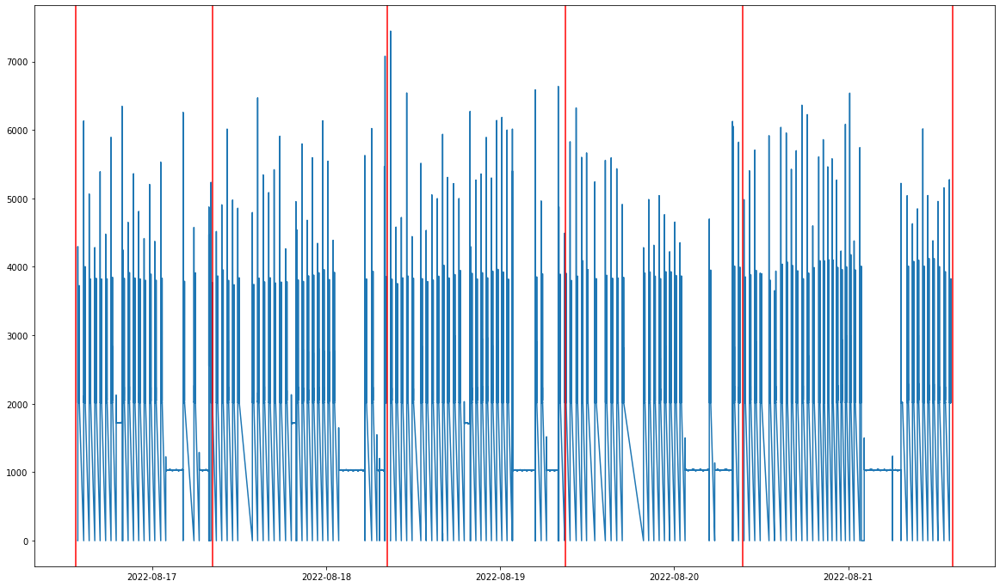

In [155]:
tool_1_mod2 = tool_1_mod2.set_index('datetime')
change_list_mod1 = pd.Series(['2022-08-16 13:29:00', '2022-08-17 08:18:00', '2022-08-18 08:27:00', '2022-08-19 09:02:00', '2022-08-20 09:24:00', '2022-08-21 14:24:00'], name = 'datetime')
plt.figure(figsize = (20,12))
plt.plot(tool_1_mod2['current_spindle'])
for chl_idx in change_list_mod1:
    plt.axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')

<AxesSubplot:>

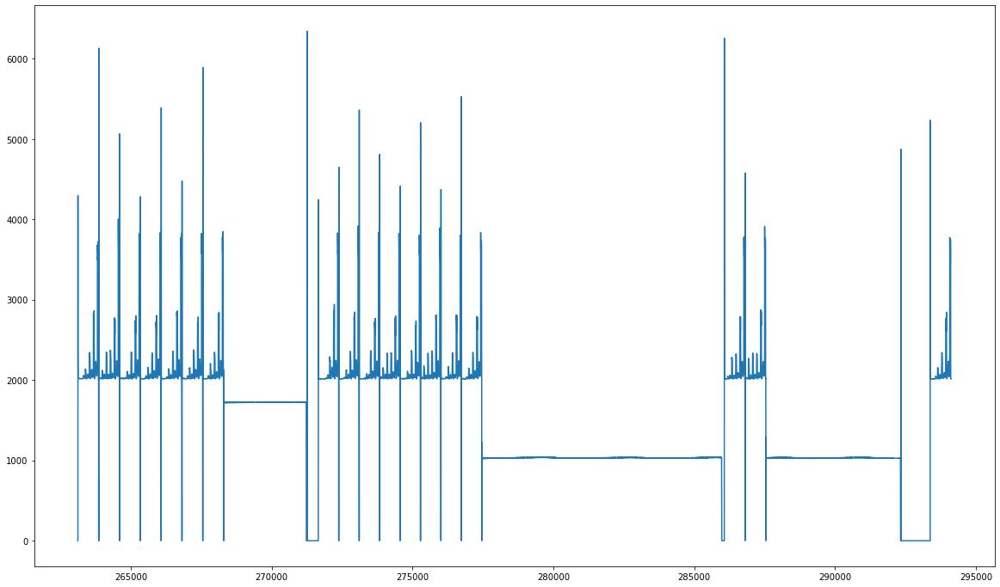

In [156]:
plt.figure(figsize = (20, 12))
tool_1_mod1[(tool_1_mod1['shot_no'] > 6393) & (tool_1_mod1['shot_no'] < 6413)]['current_spindle'].plot()

<AxesSubplot:xlabel='datetime'>

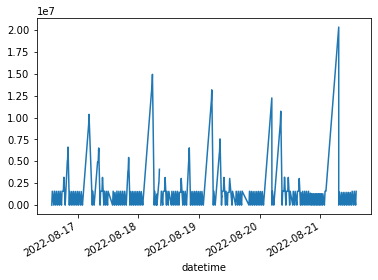

In [157]:
tool_1_mod2.groupby(['shot_no']).cumsum()['current_spindle'].plot()

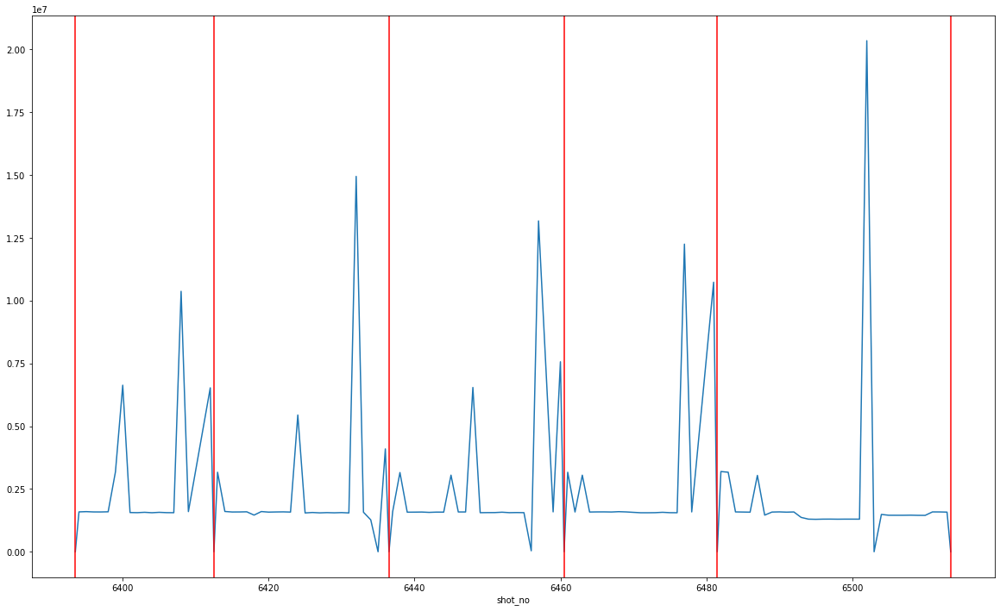

In [158]:
change_shot_mod1 = pd.Series([6393.5, 6412.5, 6436.5, 6460.5, 6481.5, 6513.5], name = 'shot_no')

plt.figure(figsize = (20, 12))
tool_1_mod2.groupby(['shot_no']).sum()['current_spindle'].plot()
for chsm_idx in change_shot_mod1:
    plt.axvline(chsm_idx, color = 'red', label = '{}'.format(chsm_idx), linestyle = 'solid')

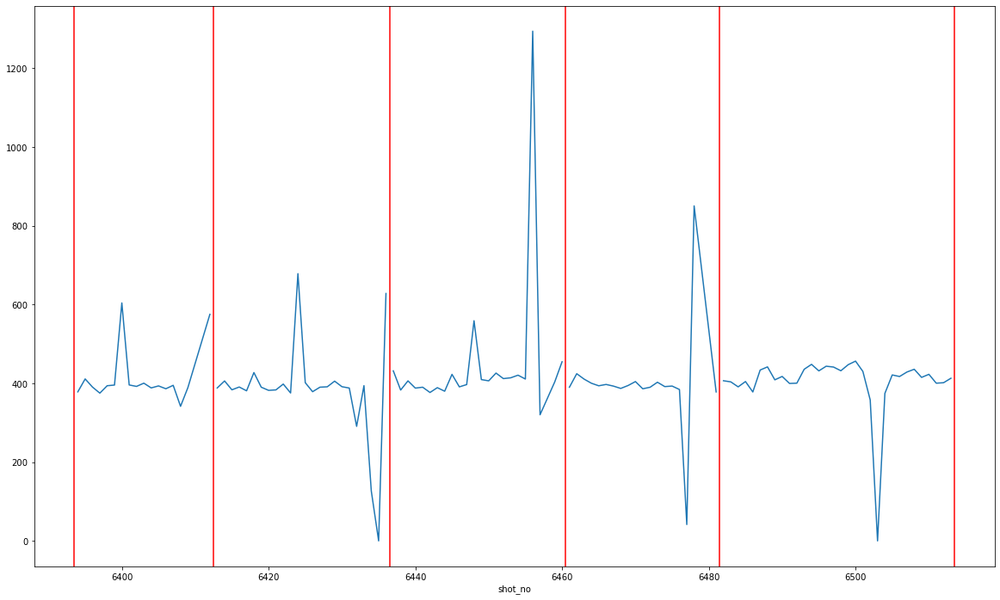

In [159]:
change_shot_mod1 = pd.Series([6393.5, 6412.5, 6436.5, 6460.5, 6481.5, 6513.5], name = 'shot_no')

plt.figure(figsize = (20, 12))
tool_1_mod2.groupby(['shot_no']).std()['current_spindle'].plot()
for chsm_idx in change_shot_mod1:
    plt.axvline(chsm_idx, color = 'red', label = '{}'.format(chsm_idx), linestyle = 'solid')

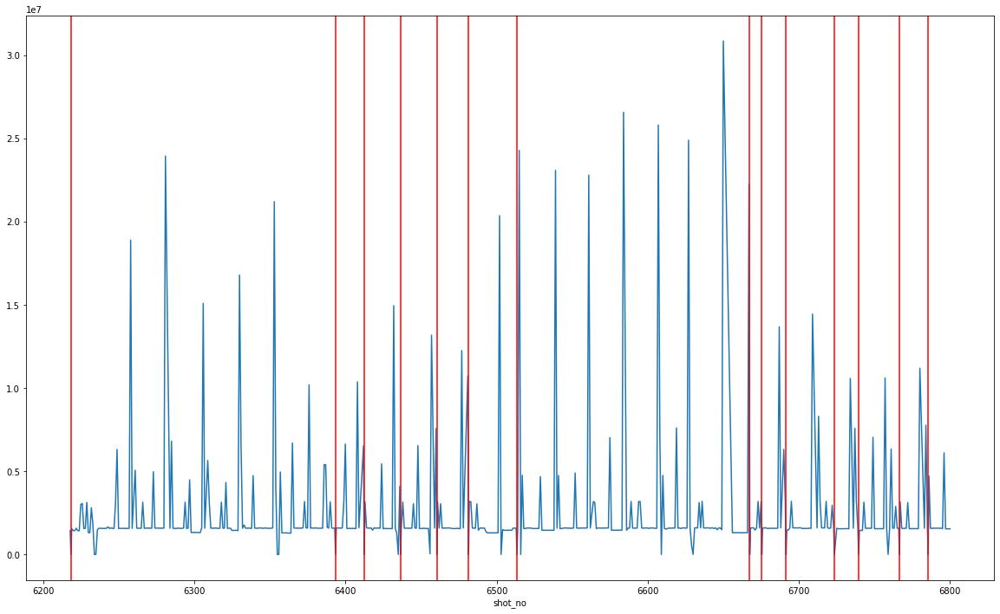

In [160]:
plt.figure(figsize = (20, 12))
tool_1_mod1.groupby('shot_no').sum()['current_spindle'].plot()
for ch_idx in change_shot:
    plt.axvline(ch_idx, color = 'red', label = '{}'.format(ch_idx), linestyle = 'solid')

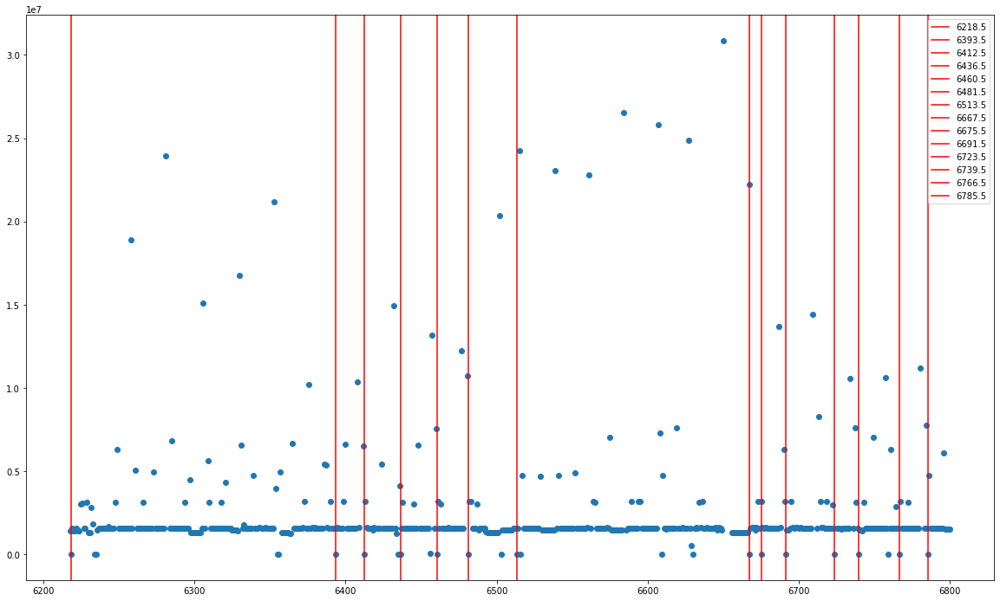

In [161]:
plt.figure(figsize = (20, 12))
plt.scatter(tool_1_mod1.groupby('shot_no').sum().index, tool_1_mod1.groupby('shot_no').sum()['current_spindle'])
for ch_idx in change_shot:
    plt.axvline(ch_idx, color = 'red', label = '{}'.format(ch_idx), linestyle = 'solid')
plt.legend()

In [162]:
tool_1_mod1 = pd.concat([tool_1, change_data], axis = 0)
tool_1_mod1

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218.0,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218.0,0.0,4.250000,0.000000,0.000000,12000.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218.0,0.0,3.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218.0,2.0,3.333333,456.666667,5.333333,0.0,116.0,1.0,operation
2022-08-03 08:57:22,2022-08-03,8,57,22,101.0,6218.0,100.0,30.400000,5262.800000,170.000000,2414.2,98.2,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-30 09:52:00,NaN,NaN,NaN,NaN,NaN,6691.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,change
2022-08-31 19:07:00,NaN,NaN,NaN,NaN,NaN,6723.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,change
2022-09-01 10:49:00,NaN,NaN,NaN,NaN,NaN,6739.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,change


In [163]:
tool_1_mod1.groupby('shot_no').sum()

,tool_number,current_x,current_z,current_spindle,rpm,feed,load_1
shot_no,,,,,,,
6218.0,68071.0,27584.500000,20803.783333,1.431031e+06,200450.116667,168943.016667,1441.200000
6218.5,0.0,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
6219.0,74635.0,26199.616667,20137.016667,1.556289e+06,219716.866667,170802.983333,1394.433333
6220.0,68071.0,27720.166667,19774.900000,1.432454e+06,200437.750000,171313.333333,1456.350000
6221.0,67970.0,27383.583333,18880.433333,1.430659e+06,200326.033333,171210.200000,1350.600000
...,...,...,...,...,...,...,...
6796.0,354203.0,36721.813420,92389.166667,6.104723e+06,375691.633333,242495.200000,1927.333333
6797.0,73222.0,26265.633333,11341.466667,1.540616e+06,215638.416667,164666.000000,1552.433333
6798.0,73221.0,27161.783333,11125.833333,1.542194e+06,215524.916667,180297.150000,1521.133333


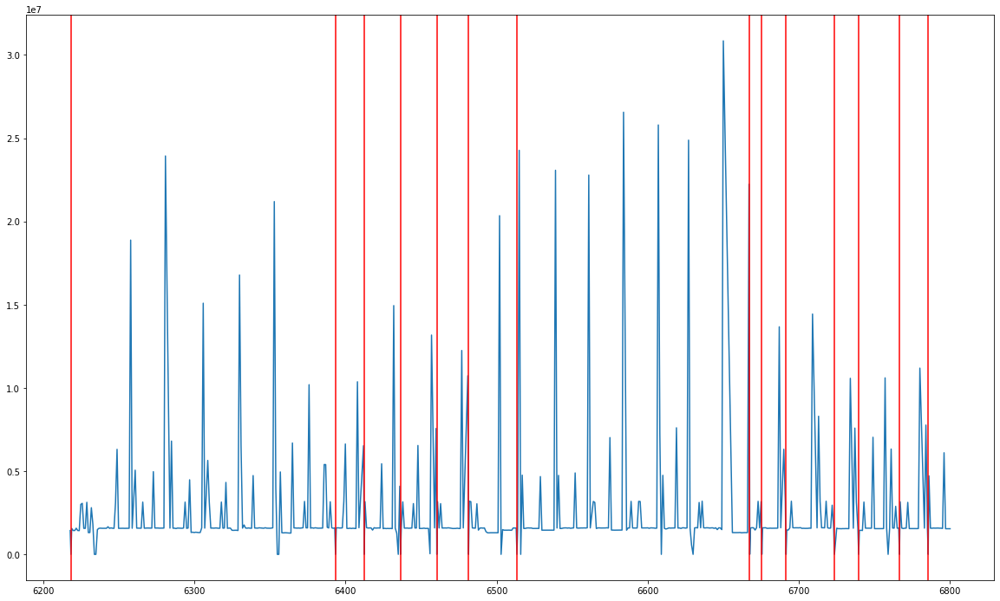

In [164]:
plt.figure(figsize = (20,12))
plt.plot(tool_1_mod1.groupby('shot_no').sum()['current_spindle'])
for axv_idx in change_shot:
     plt.axvline(axv_idx, color = 'red', label = 'tool_change1', linestyle = 'solid')

# 2022-08-03

In [165]:
tool_1[(tool_1['date'] == '2022-08-03') & ((tool_1['hour'] == '9') | (tool_1['hour'] == '10'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 09:00:00,2022-08-03,9,0,0,101.0,6218,27.8,4.0,2016.0,299.2,82.0,0.80,1.0,operation
2022-08-03 09:00:01,2022-08-03,9,0,1,101.0,6218,28.0,4.0,2015.4,299.4,82.0,0.40,1.0,operation
2022-08-03 09:00:02,2022-08-03,9,0,2,101.0,6218,27.2,4.4,2015.6,299.0,82.0,0.60,1.0,operation
2022-08-03 09:00:03,2022-08-03,9,0,3,101.0,6218,27.8,4.2,2015.6,299.4,82.0,0.60,1.0,operation
2022-08-03 09:00:04,2022-08-03,9,0,4,101.0,6218,28.6,4.2,2015.2,299.4,82.0,0.80,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-03 10:37:08,2022-08-03,10,37,8,101.0,6220,129.6,1540.4,2015.8,299.0,5382.6,0.80,1.0,operation
2022-08-03 10:37:09,2022-08-03,10,37,9,101.0,6220,484.2,1539.0,2016.6,299.2,7071.0,0.60,1.0,operation
2022-08-03 10:37:10,2022-08-03,10,37,10,101.0,6220,349.4,1474.4,2017.0,299.2,5828.4,0.40,1.0,operation


In [166]:
tool_1[tool_1['shot_no'] == 6218]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218,0.0,4.250000,0.000000,0.000000,12000.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218,0.0,3.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218,2.0,3.333333,456.666667,5.333333,0.0,116.0,1.0,operation
2022-08-03 08:57:22,2022-08-03,8,57,22,101.0,6218,100.0,30.400000,5262.800000,170.000000,2414.2,98.2,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-03 09:08:27,2022-08-03,9,8,27,101.0,6218,112.2,1462.600000,2016.200000,299.200000,6242.6,0.4,1.0,operation
2022-08-03 09:08:28,2022-08-03,9,8,28,101.0,6218,417.6,1527.800000,2016.000000,299.000000,7071.0,0.6,1.0,operation
2022-08-03 09:08:29,2022-08-03,9,8,29,101.0,6218,291.8,1498.200000,2017.000000,299.200000,5828.4,0.8,1.0,operation


In [167]:
tool_1[tool_1['shot_no'] == 6219]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 09:40:26,2022-08-03,9,40,26,100.0,6219,0.0,4.000000,0.0,0.000000,0.0,0.000000,1.0,cancel
2022-08-03 09:40:27,2022-08-03,9,40,27,100.0,6219,0.0,2.000000,0.0,0.000000,1028.6,0.000000,1.0,cancel
2022-08-03 09:40:28,2022-08-03,9,40,28,100.0,6219,0.0,5.000000,0.0,0.000000,10628.6,0.000000,1.0,cancel
2022-08-03 09:40:29,2022-08-03,9,40,29,100.0,6219,0.0,4.000000,0.0,0.000000,0.0,0.000000,1.0,cancel
2022-08-03 09:40:29,2022-08-03,9,40,29,101.0,6219,0.0,6.333333,1576.0,28.666667,0.0,153.333333,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-03 09:52:39,2022-08-03,9,52,39,101.0,6219,26.0,1466.000000,2016.2,299.800000,5414.2,0.600000,1.0,operation
2022-08-03 09:52:40,2022-08-03,9,52,40,101.0,6219,294.4,1447.800000,2017.0,299.000000,7071.0,0.600000,1.0,operation
2022-08-03 09:52:41,2022-08-03,9,52,41,101.0,6219,351.2,1483.800000,2017.0,299.400000,6736.8,0.400000,1.0,operation


In [168]:
tool_1[tool_1['shot_no'] == 6220]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 10:26:00,2022-08-03,10,26,0,100.0,6220,0.0,2.0,0.0,0.0,0.0,0.00,1.0,cancel
2022-08-03 10:26:01,2022-08-03,10,26,1,100.0,6220,0.0,2.8,0.0,0.0,12000.0,0.00,1.0,cancel
2022-08-03 10:26:02,2022-08-03,10,26,2,100.0,6220,0.0,4.0,0.0,0.0,0.0,0.00,1.0,cancel
2022-08-03 10:26:02,2022-08-03,10,26,2,101.0,6220,0.0,4.0,875.0,8.0,0.0,105.00,1.0,operation
2022-08-03 10:26:03,2022-08-03,10,26,3,101.0,6220,11.2,151.0,4059.6,166.0,1354.4,114.40,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-03 10:37:08,2022-08-03,10,37,8,101.0,6220,129.6,1540.4,2015.8,299.0,5382.6,0.80,1.0,operation
2022-08-03 10:37:09,2022-08-03,10,37,9,101.0,6220,484.2,1539.0,2016.6,299.2,7071.0,0.60,1.0,operation
2022-08-03 10:37:10,2022-08-03,10,37,10,101.0,6220,349.4,1474.4,2017.0,299.2,5828.4,0.40,1.0,operation


# 2022-08-03 교체시점 전후 시각화 

Text(0.5, 1.0, '2022-08-03, Between shot6218 and shot6225')

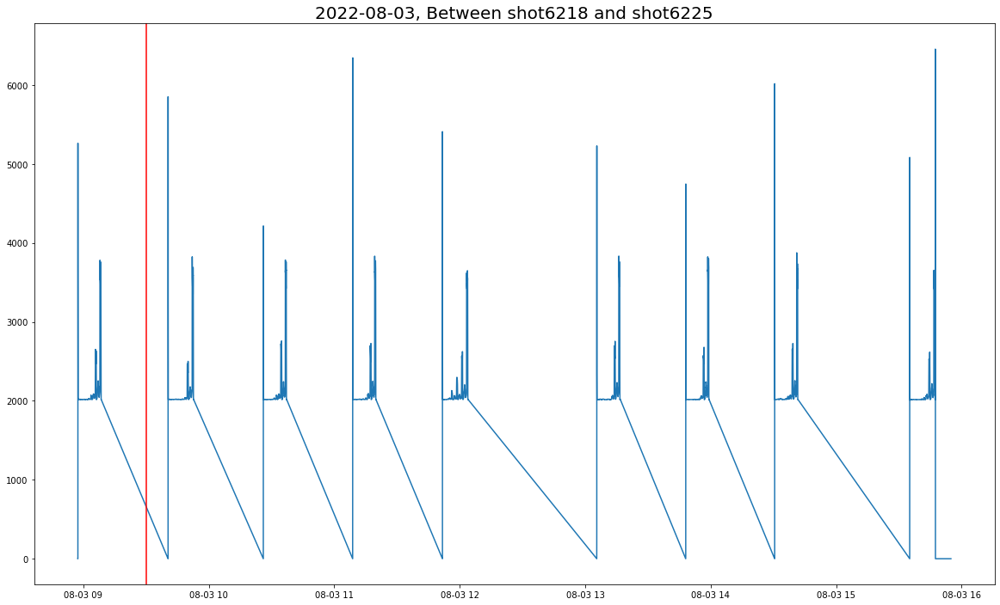

In [169]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6217) & (tool_1['shot_no'] < 6226)]['current_spindle'])
plt.axvline('2022-08-03 09:30:00', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-03, Between shot6218 and shot6225', fontsize = 20)

# 2022-08-16

In [170]:
tool_1[(tool_1['date'] == '2022-08-16') & ((tool_1['hour'] == '13') | (tool_1['hour'] == '14'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-16 13:01:47,2022-08-16,13,1,47,100.0,6393,0.0,2.000000,0.000000,0.000000,0.000000,0.00,1.0,cancel
2022-08-16 13:01:48,2022-08-16,13,1,48,100.0,6393,0.0,3.200000,0.000000,0.000000,9600.000000,0.00,1.0,cancel
2022-08-16 13:01:49,2022-08-16,13,1,49,100.0,6393,0.0,2.750000,62.500000,0.000000,3000.000000,0.00,1.0,cancel
2022-08-16 13:01:49,2022-08-16,13,1,49,101.0,6393,0.0,2.000000,250.000000,0.000000,0.000000,126.00,1.0,operation
2022-08-16 13:01:50,2022-08-16,13,1,50,101.0,6393,4.8,6.000000,3011.000000,135.600000,1414.200000,130.00,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-16 14:47:07,2022-08-16,14,47,7,101.0,6395,521.0,1514.000000,2019.000000,299.500000,7071.000000,0.25,1.0,operation
2022-08-16 14:47:08,2022-08-16,14,47,8,101.0,6395,373.0,1467.333333,2015.333333,299.333333,6380.666667,0.50,1.0,operation
2022-08-16 14:47:09,2022-08-16,14,47,9,101.0,6395,37.8,1458.600000,2014.000000,299.200000,5000.000000,0.80,1.0,operation


In [171]:
tool_1[tool_1['shot_no'] == 6393]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-16 13:01:47,2022-08-16,13,1,47,100.0,6393,0.000000,2.00,0.0,0.000000,0.0,0.000000,1.0,cancel
2022-08-16 13:01:48,2022-08-16,13,1,48,100.0,6393,0.000000,3.20,0.0,0.000000,9600.0,0.000000,1.0,cancel
2022-08-16 13:01:49,2022-08-16,13,1,49,100.0,6393,0.000000,2.75,62.5,0.000000,3000.0,0.000000,1.0,cancel
2022-08-16 13:01:49,2022-08-16,13,1,49,101.0,6393,0.000000,2.00,250.0,0.000000,0.0,126.000000,1.0,operation
2022-08-16 13:01:50,2022-08-16,13,1,50,101.0,6393,4.800000,6.00,3011.0,135.600000,1414.2,130.000000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-16 13:14:01,2022-08-16,13,14,1,101.0,6393,440.200000,1460.60,2015.6,299.400000,7071.0,0.600000,1.0,operation
2022-08-16 13:14:02,2022-08-16,13,14,2,101.0,6393,238.600000,1460.40,2015.0,299.600000,5414.2,0.400000,1.0,operation
2022-08-16 13:14:03,2022-08-16,13,14,3,101.0,6393,14.666667,1461.00,2015.0,299.333333,5000.0,0.333333,1.0,operation


In [172]:
tool_1[tool_1['shot_no'] == 6394]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-16 13:46:10,2022-08-16,13,46,10,100.0,6394,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-08-16 13:46:11,2022-08-16,13,46,11,100.0,6394,0.0,3.2,0.0,0.0,11314.2,0.0,1.0,cancel
2022-08-16 13:46:12,2022-08-16,13,46,12,100.0,6394,0.0,3.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-08-16 13:46:12,2022-08-16,13,46,12,101.0,6394,0.0,2.0,0.0,5.0,0.0,156.0,1.0,operation
2022-08-16 13:46:13,2022-08-16,13,46,13,101.0,6394,20.4,14.8,4296.4,192.4,1414.2,108.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-16 13:58:23,2022-08-16,13,58,23,101.0,6394,426.4,1546.6,2015.6,299.0,7071.0,0.6,1.0,operation
2022-08-16 13:58:24,2022-08-16,13,58,24,101.0,6394,387.8,1459.8,2019.0,299.2,7071.0,0.6,1.0,operation
2022-08-16 13:58:25,2022-08-16,13,58,25,101.0,6394,186.6,1459.4,2019.4,299.4,5303.8,0.6,1.0,operation


In [173]:
tool_1[tool_1['shot_no'] == 6395]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-16 14:34:53,2022-08-16,14,34,53,100.0,6395,0.0,2.000000,0.000000,0.000000,0.000000,0.00,1.0,cancel
2022-08-16 14:34:54,2022-08-16,14,34,54,100.0,6395,0.0,2.000000,0.000000,0.000000,2400.000000,0.00,1.0,cancel
2022-08-16 14:34:55,2022-08-16,14,34,55,100.0,6395,0.0,3.800000,0.000000,0.000000,5142.800000,0.00,1.0,cancel
2022-08-16 14:34:56,2022-08-16,14,34,56,100.0,6395,0.0,2.000000,0.000000,0.000000,0.000000,0.00,1.0,cancel
2022-08-16 14:34:56,2022-08-16,14,34,56,101.0,6395,0.0,3.000000,783.500000,31.000000,0.000000,147.00,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-16 14:47:07,2022-08-16,14,47,7,101.0,6395,521.0,1514.000000,2019.000000,299.500000,7071.000000,0.25,1.0,operation
2022-08-16 14:47:08,2022-08-16,14,47,8,101.0,6395,373.0,1467.333333,2015.333333,299.333333,6380.666667,0.50,1.0,operation
2022-08-16 14:47:09,2022-08-16,14,47,9,101.0,6395,37.8,1458.600000,2014.000000,299.200000,5000.000000,0.80,1.0,operation


# 2022-08-16 Tool1 황삭팁 교환 탐색

- 교환시점 : 2022-08-16  1:29:18 PM이기 때문에 shot_no 6393번 생산 후 Tool1 팁 교체
- 새 팁 시작 시점 : shot_no 6394번
- 교체 후 다음 교체까지의 패턴 파악

In [174]:
tool_1[tool_1['shot_no'] == 6393]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-16 13:01:47,2022-08-16,13,1,47,100.0,6393,0.000000,2.00,0.0,0.000000,0.0,0.000000,1.0,cancel
2022-08-16 13:01:48,2022-08-16,13,1,48,100.0,6393,0.000000,3.20,0.0,0.000000,9600.0,0.000000,1.0,cancel
2022-08-16 13:01:49,2022-08-16,13,1,49,100.0,6393,0.000000,2.75,62.5,0.000000,3000.0,0.000000,1.0,cancel
2022-08-16 13:01:49,2022-08-16,13,1,49,101.0,6393,0.000000,2.00,250.0,0.000000,0.0,126.000000,1.0,operation
2022-08-16 13:01:50,2022-08-16,13,1,50,101.0,6393,4.800000,6.00,3011.0,135.600000,1414.2,130.000000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-16 13:14:01,2022-08-16,13,14,1,101.0,6393,440.200000,1460.60,2015.6,299.400000,7071.0,0.600000,1.0,operation
2022-08-16 13:14:02,2022-08-16,13,14,2,101.0,6393,238.600000,1460.40,2015.0,299.600000,5414.2,0.400000,1.0,operation
2022-08-16 13:14:03,2022-08-16,13,14,3,101.0,6393,14.666667,1461.00,2015.0,299.333333,5000.0,0.333333,1.0,operation


In [175]:
tool_1_mod1 = tool_1[tool_1['shot_no'] > 6393]
tool_1_mod1

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-16 13:46:10,2022-08-16,13,46,10,100.0,6394,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-08-16 13:46:11,2022-08-16,13,46,11,100.0,6394,0.0,3.2,0.0,0.0,11314.2,0.0,1.0,cancel
2022-08-16 13:46:12,2022-08-16,13,46,12,100.0,6394,0.0,3.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-08-16 13:46:12,2022-08-16,13,46,12,101.0,6394,0.0,2.0,0.0,5.0,0.0,156.0,1.0,operation
2022-08-16 13:46:13,2022-08-16,13,46,13,101.0,6394,20.4,14.8,4296.4,192.4,1414.2,108.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800,29.2,2.0,2050.2,299.4,75.0,0.4,1.0,operation
2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800,28.8,2.0,2016.4,299.2,75.0,0.4,1.0,operation
2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800,27.4,1227.2,2014.0,299.4,12015.0,0.4,1.0,operation


# 08-16 황삭팁 전후 shot 각각 5개씩 시각화 수행
shot 6388 ~ 6399까지의 과정 시각화 작성
교체기간 표시 2022-08-16 13:29:18

In [176]:
tool_1[(tool_1['shot_no'] > 6387) & (tool_1['shot_no'] < 6400)]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-16 07:54:15,2022-08-16,7,54,15,101.0,6388,0.0,2.000000,0.000000,0.0,0.0,0.000000,1.0,operation
2022-08-16 07:54:16,2022-08-16,7,54,16,101.0,6388,0.0,2.000000,0.000000,0.0,0.0,0.000000,1.0,operation
2022-08-16 07:54:17,2022-08-16,7,54,17,101.0,6388,0.0,2.000000,0.000000,0.0,0.0,0.000000,1.0,operation
2022-08-16 07:54:18,2022-08-16,7,54,18,101.0,6388,0.0,2.000000,0.000000,0.0,0.0,0.000000,1.0,operation
2022-08-16 07:54:19,2022-08-16,7,54,19,101.0,6388,0.0,2.000000,0.000000,0.0,0.0,0.000000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-16 18:33:01,2022-08-16,18,33,1,101.0,6399,493.4,1489.000000,2016.600000,299.4,7071.0,0.800000,1.0,operation
2022-08-16 18:33:02,2022-08-16,18,33,2,101.0,6399,347.6,1455.400000,2014.000000,299.0,6656.8,0.600000,1.0,operation
2022-08-16 18:33:03,2022-08-16,18,33,3,101.0,6399,87.0,1456.333333,2014.166667,299.0,5000.0,0.166667,1.0,operation


Text(0.5, 1.0, '2022-08-16, Between shot6388 and shot6399')

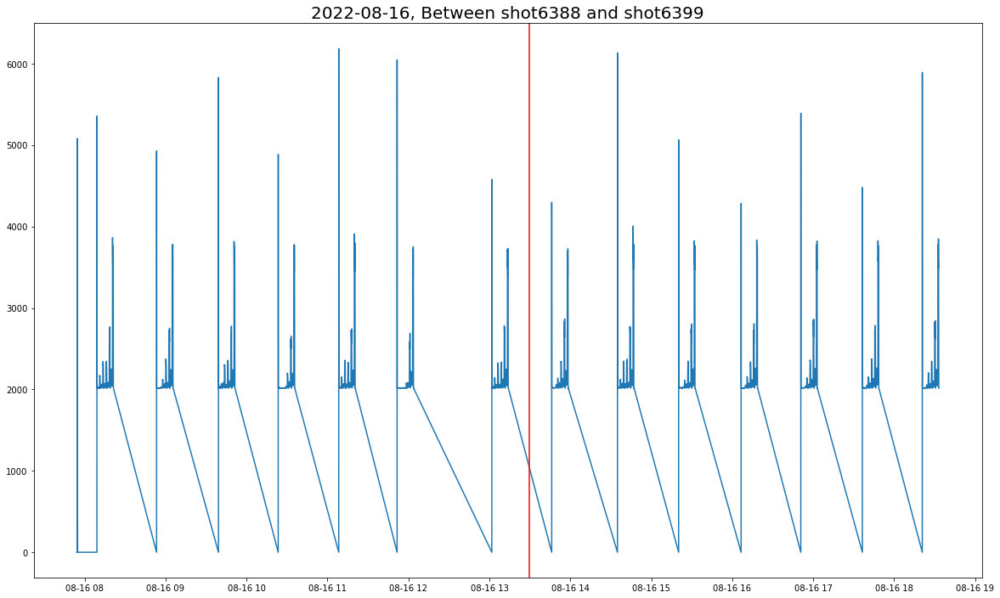

In [177]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6387) & (tool_1['shot_no'] < 6400)]['current_spindle'])
plt.axvline('2022-08-16 13:29:18', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-16, Between shot6388 and shot6399', fontsize = 20)

# 2022-08-17 Shot 6412까지 생산하고 팁 교체로 추정됨
- 교환시점 : 2022-08-17  8:18:57 AM
- 다음 교체 2022-08-17에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-17  8:18:57 AM
- 6397 < shot_no < 6418으로 한정됨 
- shot_no 6413부터 새 팁 사용
- 6394 ~ 6412까지 18개 생산 후 팁 1차 교체 수행

In [178]:
tool_1[(tool_1['date'] == '2022-08-17') & ((tool_1['hour'] == '8') | (tool_1['hour'] == '9'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-17 08:00:00,2022-08-17,8,0,0,101.0,6412,0.0,2.0,0.000000,0.000000,0.000000,0.000000,1.0,operation
2022-08-17 08:00:01,2022-08-17,8,0,1,101.0,6412,0.0,2.0,0.000000,0.000000,0.000000,0.000000,1.0,operation
2022-08-17 08:00:02,2022-08-17,8,0,2,101.0,6412,0.0,2.0,0.000000,0.000000,0.000000,0.000000,1.0,operation
2022-08-17 08:00:03,2022-08-17,8,0,3,101.0,6412,0.0,2.0,0.000000,0.000000,0.000000,0.000000,1.0,operation
2022-08-17 08:00:04,2022-08-17,8,0,4,101.0,6412,0.0,2.0,0.000000,0.000000,0.000000,0.000000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-17 09:49:18,2022-08-17,9,49,18,101.0,6413,431.0,1505.0,2014.666667,299.333333,6380.666667,0.666667,1.0,operation
2022-08-17 09:49:19,2022-08-17,9,49,19,101.0,6413,399.8,1459.0,2015.000000,299.800000,7071.000000,0.800000,1.0,operation
2022-08-17 09:49:20,2022-08-17,9,49,20,101.0,6413,175.4,1457.0,2015.400000,299.000000,5828.400000,0.600000,1.0,operation


In [179]:
tool_1[(tool_1['shot_no'] > 6397) & (tool_1['shot_no'] < 6418)]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-16 16:50:46,2022-08-16,16,50,46,100.0,6398,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-08-16 16:50:47,2022-08-16,16,50,47,100.0,6398,0.0,2.8,0.0,0.0,8228.6,0.0,1.0,cancel
2022-08-16 16:50:48,2022-08-16,16,50,48,100.0,6398,0.0,3.2,0.0,0.0,3085.6,0.0,1.0,cancel
2022-08-16 16:50:49,2022-08-16,16,50,49,101.0,6398,4.8,41.6,3038.2,106.2,606.0,134.4,1.0,operation
2022-08-16 16:50:50,2022-08-16,16,50,50,101.0,6398,252.0,675.0,5390.0,302.2,5000.0,4.6,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-17 14:02:25,2022-08-17,14,2,25,101.0,6417,0.2,1461.8,2014.4,299.2,3251.6,0.8,1.0,operation
2022-08-17 14:02:26,2022-08-17,14,2,26,101.0,6417,376.0,1494.6,2015.0,299.0,7071.0,0.8,1.0,operation
2022-08-17 14:02:27,2022-08-17,14,2,27,101.0,6417,356.4,1464.4,2015.0,299.0,6656.8,0.8,1.0,operation


# 08-17 황삭팁 전후 shot 각각 5개씩 시각화 수행
shot 6398 ~ 6417까지의 과정 시각화 작성
교체기간 표시 2022-08-17  8:18:57 AM

In [180]:
tool_1[tool_1['shot_no'] == 6413]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-17 08:52:08,2022-08-17,8,52,8,100.0,6413,0.0,2.000000,0.000000,0.000000,0.000000,0.000000,1.0,cancel
2022-08-17 08:52:09,2022-08-17,8,52,9,100.0,6413,0.0,3.200000,0.000000,0.000000,9600.000000,0.000000,1.0,cancel
2022-08-17 08:52:10,2022-08-17,8,52,10,100.0,6413,0.0,3.333333,0.000000,0.000000,4000.000000,0.000000,1.0,cancel
2022-08-17 08:52:10,2022-08-17,8,52,10,101.0,6413,0.0,2.000000,0.000000,0.000000,0.000000,101.000000,1.0,operation
2022-08-17 08:52:11,2022-08-17,8,52,11,101.0,6413,6.4,8.800000,4517.000000,153.400000,2020.400000,120.600000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-17 09:49:18,2022-08-17,9,49,18,101.0,6413,431.0,1505.000000,2014.666667,299.333333,6380.666667,0.666667,1.0,operation
2022-08-17 09:49:19,2022-08-17,9,49,19,101.0,6413,399.8,1459.000000,2015.000000,299.800000,7071.000000,0.800000,1.0,operation
2022-08-17 09:49:20,2022-08-17,9,49,20,101.0,6413,175.4,1457.000000,2015.400000,299.000000,5828.400000,0.600000,1.0,operation


In [181]:
tool_1[tool_1['shot_no'] == 6414]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-17 10:21:41,2022-08-17,10,21,41,100.0,6414,0.0,2.000000,0.0,0.0,0.0,0.000000,1.0,cancel
2022-08-17 10:21:42,2022-08-17,10,21,42,100.0,6414,0.0,2.000000,0.0,0.0,2400.0,0.000000,1.0,cancel
2022-08-17 10:21:43,2022-08-17,10,21,43,100.0,6414,0.0,4.000000,0.0,0.0,9257.2,0.000000,1.0,cancel
2022-08-17 10:21:44,2022-08-17,10,21,44,100.0,6414,0.0,2.000000,0.0,0.0,0.0,0.000000,1.0,cancel
2022-08-17 10:21:44,2022-08-17,10,21,44,101.0,6414,3.0,3.333333,1138.0,30.0,0.0,150.666667,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-17 10:33:55,2022-08-17,10,33,55,101.0,6414,534.0,1574.000000,2016.0,299.2,7071.0,0.400000,1.0,operation
2022-08-17 10:33:56,2022-08-17,10,33,56,101.0,6414,387.6,1457.000000,2015.2,299.6,6656.8,0.600000,1.0,operation
2022-08-17 10:33:57,2022-08-17,10,33,57,101.0,6414,101.8,1456.200000,2015.0,299.6,5000.0,0.200000,1.0,operation


In [182]:
tool_1[(tool_1['shot_no'] > 6408) & (tool_1['shot_no'] < 6417)]['current_spindle']

datetime
2022-08-17 05:46:57       0.0
2022-08-17 05:46:58       0.0
2022-08-17 05:46:59       0.0
2022-08-17 05:46:59       0.0
2022-08-17 05:47:00    3199.2
                        ...  
2022-08-17 12:01:51    2014.0
2022-08-17 12:01:52    2015.4
2022-08-17 12:01:53    2015.4
2022-08-17 12:01:54    2015.2
2022-08-17 12:01:55    2015.0
Name: current_spindle, Length: 11006, dtype: float64

Text(0.5, 1.0, '2022-08-17, Between shot6408 and shot6417')

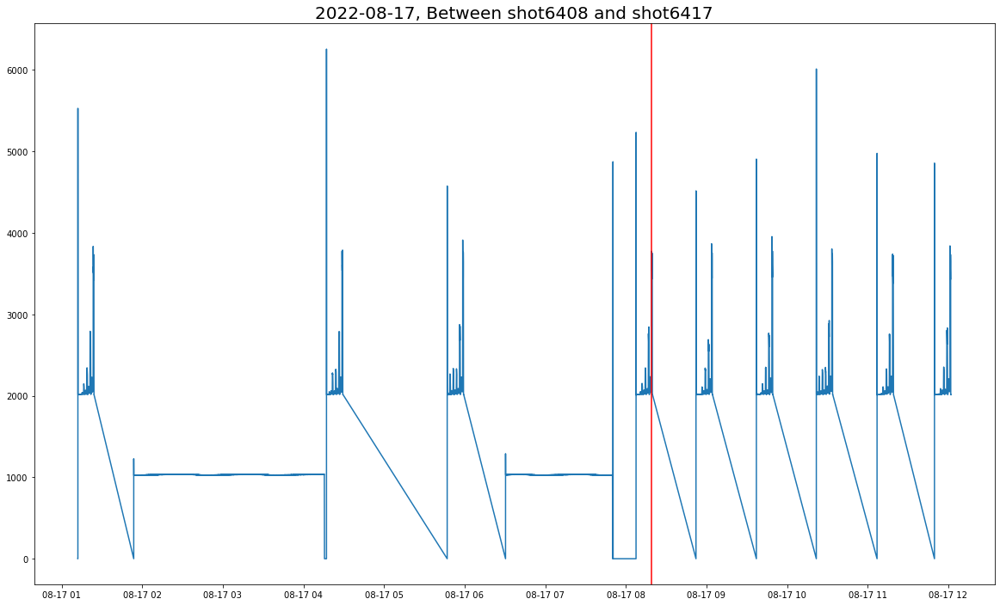

In [183]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6406) & (tool_1['shot_no'] < 6417)]['current_spindle'])
plt.axvline('2022-08-17 08:18:57', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-17, Between shot6408 and shot6417', fontsize = 20)

In [184]:
tool_1[(tool_1['shot_no'] > 6387) & (tool_1['shot_no'] < 6400)]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-16 07:54:15,2022-08-16,7,54,15,101.0,6388,0.0,2.000000,0.000000,0.0,0.0,0.000000,1.0,operation
2022-08-16 07:54:16,2022-08-16,7,54,16,101.0,6388,0.0,2.000000,0.000000,0.0,0.0,0.000000,1.0,operation
2022-08-16 07:54:17,2022-08-16,7,54,17,101.0,6388,0.0,2.000000,0.000000,0.0,0.0,0.000000,1.0,operation
2022-08-16 07:54:18,2022-08-16,7,54,18,101.0,6388,0.0,2.000000,0.000000,0.0,0.0,0.000000,1.0,operation
2022-08-16 07:54:19,2022-08-16,7,54,19,101.0,6388,0.0,2.000000,0.000000,0.0,0.0,0.000000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-16 18:33:01,2022-08-16,18,33,1,101.0,6399,493.4,1489.000000,2016.600000,299.4,7071.0,0.800000,1.0,operation
2022-08-16 18:33:02,2022-08-16,18,33,2,101.0,6399,347.6,1455.400000,2014.000000,299.0,6656.8,0.600000,1.0,operation
2022-08-16 18:33:03,2022-08-16,18,33,3,101.0,6399,87.0,1456.333333,2014.166667,299.0,5000.0,0.166667,1.0,operation


# 08-18 황삭팁 교체 탐색
1. shot_no 6436 후 교체
2. 08:20:27 ~ 08:53:34 시간까지 교체

In [185]:
tool_1[(tool_1['date'] == '2022-08-18') & (tool_1['hour'] == '8') & ((tool_1['minute'] == '20') | (tool_1['minute'] == '53'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-18 08:20:00,2022-08-18,8,20,0,101.0,6436,44.60,2.000000,3532.800000,299.400000,75.00,13.000000,1.0,operation
2022-08-18 08:20:01,2022-08-18,8,20,1,101.0,6436,44.60,2.000000,3518.800000,299.000000,75.00,12.800000,1.0,operation
2022-08-18 08:20:02,2022-08-18,8,20,2,101.0,6436,48.40,2.000000,3470.800000,299.000000,75.00,12.200000,1.0,operation
2022-08-18 08:20:03,2022-08-18,8,20,3,101.0,6436,47.80,2.000000,3457.800000,299.400000,75.00,12.400000,1.0,operation
2022-08-18 08:20:04,2022-08-18,8,20,4,101.0,6436,47.80,2.000000,3466.800000,299.400000,75.00,12.200000,1.0,operation
2022-08-18 08:20:05,2022-08-18,8,20,5,101.0,6436,47.80,2.000000,3441.200000,299.200000,75.00,12.200000,1.0,operation
2022-08-18 08:20:06,2022-08-18,8,20,6,101.0,6436,47.60,2.000000,3439.200000,299.400000,75.00,12.600000,1.0,operation
2022-08-18 08:20:07,2022-08-18,8,20,7,101.0,6436,47.00,2.000000,3438.800000,299.600000,75.00,12.600000,1.0,operation
2022-08-18 08:20:08,2022-08-18,8,20,8,101.0,6436,47.80,2.000000,3442.800000,299.200000,75.00,12.600000,1.0,operation


In [186]:
tool_1[(tool_1['shot_no'] == 6436)]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-18 07:21:33,2022-08-18,7,21,33,101.0,6436,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,operation
2022-08-18 07:21:34,2022-08-18,7,21,34,101.0,6436,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,operation
2022-08-18 07:21:35,2022-08-18,7,21,35,101.0,6436,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,operation
2022-08-18 07:21:36,2022-08-18,7,21,36,101.0,6436,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,operation
2022-08-18 07:21:37,2022-08-18,7,21,37,101.0,6436,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-18 08:20:22,2022-08-18,8,20,22,101.0,6436,229.6,1489.6,2015.0,299.000000,5239.8,0.800000,1.0,operation
2022-08-18 08:20:23,2022-08-18,8,20,23,101.0,6436,471.6,1460.0,2014.2,299.600000,7071.0,0.600000,1.0,operation
2022-08-18 08:20:24,2022-08-18,8,20,24,101.0,6436,325.4,1456.6,2015.4,299.600000,5828.4,1.000000,1.0,operation


In [187]:
tool_1[(tool_1['shot_no'] == 6437)]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-18 08:53:35,2022-08-18,8,53,35,100.0,6437,0.00,2.0,0.0,0.00,0.0,0.00,1.0,cancel
2022-08-18 08:53:36,2022-08-18,8,53,36,100.0,6437,0.00,2.0,0.0,0.00,0.0,0.00,1.0,cancel
2022-08-18 08:53:37,2022-08-18,8,53,37,100.0,6437,0.00,3.6,0.0,0.00,7200.0,0.00,1.0,cancel
2022-08-18 08:53:38,2022-08-18,8,53,38,100.0,6437,0.00,3.0,0.0,0.00,0.0,0.00,1.0,cancel
2022-08-18 08:53:38,2022-08-18,8,53,38,101.0,6437,2.25,3.0,942.5,35.25,0.0,135.75,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-18 09:05:49,2022-08-18,9,5,49,101.0,6437,311.80,1416.2,2016.4,299.40,7071.0,0.40,1.0,operation
2022-08-18 09:05:50,2022-08-18,9,5,50,101.0,6437,410.00,1454.8,2015.2,299.40,7071.0,0.60,1.0,operation
2022-08-18 09:05:51,2022-08-18,9,5,51,101.0,6437,171.80,1455.2,2015.2,299.60,5414.2,0.40,1.0,operation


In [188]:
tool_1[(tool_1['shot_no'] == 6438)]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-18 09:38:17,2022-08-18,9,38,17,100.0,6438,0.0,2.000000,0.0,0.0,0.0,0.0,1.0,cancel
2022-08-18 09:38:18,2022-08-18,9,38,18,100.0,6438,0.0,3.600000,0.0,0.0,9600.0,0.0,1.0,cancel
2022-08-18 09:38:19,2022-08-18,9,38,19,100.0,6438,0.0,2.666667,0.0,0.0,0.0,1.0,1.0,cancel
2022-08-18 09:38:19,2022-08-18,9,38,19,101.0,6438,0.0,3.000000,809.0,4.0,0.0,147.0,1.0,operation
2022-08-18 09:38:20,2022-08-18,9,38,20,101.0,6438,143.0,133.000000,4380.8,216.6,2424.4,107.6,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-18 10:34:51,2022-08-18,10,34,51,101.0,6438,220.0,1490.200000,2017.2,299.0,6639.6,0.2,1.0,operation
2022-08-18 10:34:52,2022-08-18,10,34,52,101.0,6438,412.8,1457.200000,2017.2,299.0,7071.0,0.8,1.0,operation
2022-08-18 10:34:53,2022-08-18,10,34,53,101.0,6438,228.0,1457.200000,2018.0,299.6,5000.0,0.4,1.0,operation


# 08-18 교체 전후 shot 5개씩으로 시각화 작성
교체 시점 : 2022-08-18 08:27:36

Text(0.5, 1.0, '2022-08-18, Between shot6432 and shot6442')

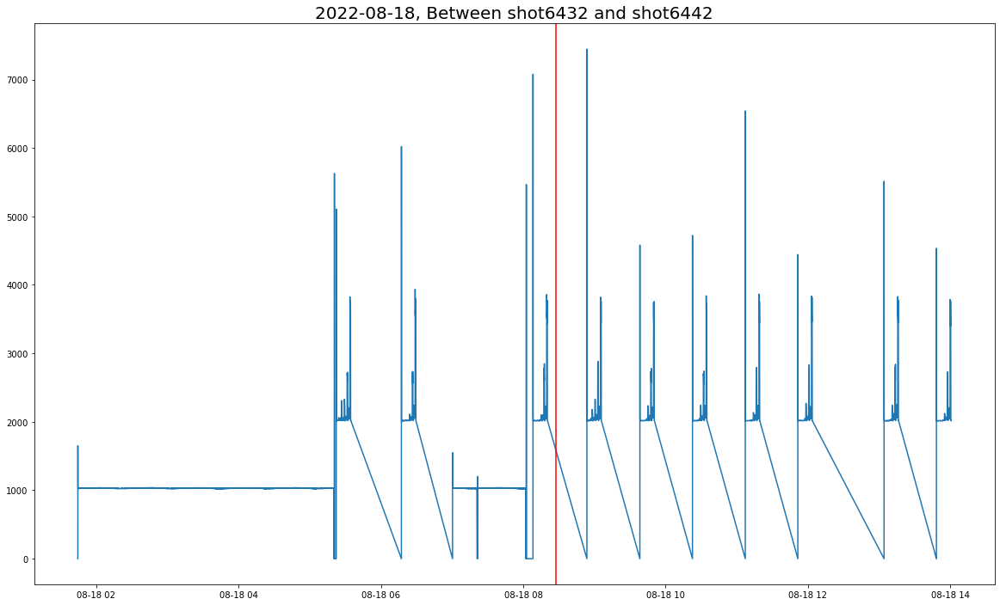

In [189]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6431) & (tool_1['shot_no'] < 6443)]['current_spindle'])
plt.axvline('2022-08-18 08:27:36', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-18, Between shot6432 and shot6442', fontsize = 20)

# 08-19 황삭팁 교체 탐색

In [190]:
tool_1[(tool_1['date'] == '2022-08-19') & ((tool_1['hour'] == '8') | (tool_1['hour'] == '9'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-19 08:00:00,2022-08-19,8,0,0,101.0,6460,3.2,2.0,1030.8,30.0,1.0,0.0,1.0,operation
2022-08-19 08:00:01,2022-08-19,8,0,1,101.0,6460,4.0,2.0,1029.8,30.0,1.0,0.0,1.0,operation
2022-08-19 08:00:02,2022-08-19,8,0,2,101.0,6460,3.0,2.0,1031.0,30.0,1.0,0.0,1.0,operation
2022-08-19 08:00:03,2022-08-19,8,0,3,101.0,6460,3.0,2.0,1031.6,30.0,1.0,0.0,1.0,operation
2022-08-19 08:00:04,2022-08-19,8,0,4,101.0,6460,2.2,2.0,1030.6,30.0,1.0,0.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-19 09:50:50,2022-08-19,9,50,50,101.0,6461,0.0,1450.0,2015.2,299.2,4414.2,0.2,1.0,operation
2022-08-19 09:50:51,2022-08-19,9,50,51,101.0,6461,498.8,1483.8,2015.4,299.4,7071.0,0.4,1.0,operation
2022-08-19 09:50:52,2022-08-19,9,50,52,101.0,6461,355.0,1457.6,2015.8,299.4,5897.6,0.4,1.0,operation


In [191]:
tool_1[(tool_1['shot_no'] == 6460)]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-19 06:23:53,2022-08-19,6,23,53,100.0,6460,0.000000,2.0,0.000000,0.000000,0.000000,0.000000,1.0,cancel
2022-08-19 06:23:54,2022-08-19,6,23,54,100.0,6460,0.000000,3.5,0.000000,0.000000,9000.000000,0.000000,1.0,cancel
2022-08-19 06:23:55,2022-08-19,6,23,55,100.0,6460,0.000000,3.5,0.000000,0.000000,3000.000000,0.000000,1.0,cancel
2022-08-19 06:23:55,2022-08-19,6,23,55,101.0,6460,0.000000,3.0,795.000000,0.000000,0.000000,115.000000,1.0,operation
2022-08-19 06:23:56,2022-08-19,6,23,56,101.0,6460,105.500000,315.5,1519.500000,33.250000,424.500000,16.500000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-19 08:18:09,2022-08-19,8,18,9,101.0,6460,638.200000,1534.8,2015.800000,299.400000,5656.800000,0.400000,1.0,operation
2022-08-19 08:18:10,2022-08-19,8,18,10,101.0,6460,404.800000,1456.6,2015.000000,299.400000,7071.000000,0.600000,1.0,operation
2022-08-19 08:18:11,2022-08-19,8,18,11,101.0,6460,171.400000,1457.0,2015.000000,299.200000,5000.000000,0.800000,1.0,operation


In [192]:
tool_1[(tool_1['shot_no'] == 6461)]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-19 08:54:01,2022-08-19,8,54,1,100.0,6461,0.0,2.000000,0.000000,0.0,0.0,0.0,1.0,cancel
2022-08-19 08:54:02,2022-08-19,8,54,2,100.0,6461,0.0,3.200000,0.000000,0.0,9600.0,0.0,1.0,cancel
2022-08-19 08:54:03,2022-08-19,8,54,3,100.0,6461,0.0,3.333333,59.333333,0.0,0.0,0.0,1.0,cancel
2022-08-19 08:54:03,2022-08-19,8,54,3,101.0,6461,2.0,2.000000,178.000000,13.5,0.0,125.5,1.0,operation
2022-08-19 08:54:04,2022-08-19,8,54,4,101.0,6461,271.6,202.600000,4493.000000,177.0,1616.4,102.4,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-19 09:50:50,2022-08-19,9,50,50,101.0,6461,0.0,1450.000000,2015.200000,299.2,4414.2,0.2,1.0,operation
2022-08-19 09:50:51,2022-08-19,9,50,51,101.0,6461,498.8,1483.800000,2015.400000,299.4,7071.0,0.4,1.0,operation
2022-08-19 09:50:52,2022-08-19,9,50,52,101.0,6461,355.0,1457.600000,2015.800000,299.4,5897.6,0.4,1.0,operation


In [193]:
tool_1[(tool_1['shot_no'] == 6462)]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-19 10:28:56,2022-08-19,10,28,56,100.0,6462,0.0,2.00,0.00,0.00,0.0,0.00,1.0,cancel
2022-08-19 10:28:57,2022-08-19,10,28,57,100.0,6462,0.0,2.00,0.00,0.00,4800.0,0.00,1.0,cancel
2022-08-19 10:28:58,2022-08-19,10,28,58,100.0,6462,0.0,4.00,0.00,0.00,6000.0,0.00,1.0,cancel
2022-08-19 10:28:59,2022-08-19,10,28,59,100.0,6462,0.0,2.00,0.00,0.00,0.0,0.00,1.0,cancel
2022-08-19 10:28:59,2022-08-19,10,28,59,101.0,6462,1.5,3.00,501.25,38.00,0.0,123.75,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-19 10:41:09,2022-08-19,10,41,9,101.0,6462,53.2,1405.00,2017.80,299.60,5414.2,0.40,1.0,operation
2022-08-19 10:41:10,2022-08-19,10,41,10,101.0,6462,434.4,1497.40,2015.80,299.00,7071.0,0.40,1.0,operation
2022-08-19 10:41:11,2022-08-19,10,41,11,101.0,6462,398.0,1458.60,2015.60,299.80,6242.6,0.20,1.0,operation


In [194]:
tool_1[(tool_1['date'] == '2022-08-19') & (tool_1['hour'] == '8')]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-19 08:00:00,2022-08-19,8,0,0,101.0,6460,3.2,2.0,1030.8,30.0,1.0,0.0,1.0,operation
2022-08-19 08:00:01,2022-08-19,8,0,1,101.0,6460,4.0,2.0,1029.8,30.0,1.0,0.0,1.0,operation
2022-08-19 08:00:02,2022-08-19,8,0,2,101.0,6460,3.0,2.0,1031.0,30.0,1.0,0.0,1.0,operation
2022-08-19 08:00:03,2022-08-19,8,0,3,101.0,6460,3.0,2.0,1031.6,30.0,1.0,0.0,1.0,operation
2022-08-19 08:00:04,2022-08-19,8,0,4,101.0,6460,2.2,2.0,1030.6,30.0,1.0,0.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-19 08:59:55,2022-08-19,8,59,55,101.0,6461,34.2,1.4,2059.4,299.2,75.0,1.4,1.0,operation
2022-08-19 08:59:56,2022-08-19,8,59,56,101.0,6461,33.4,1.4,2059.8,300.0,75.0,1.4,1.0,operation
2022-08-19 08:59:57,2022-08-19,8,59,57,101.0,6461,33.8,1.6,2057.4,299.6,75.0,1.4,1.0,operation


# 08-19 교체 전후 shot 5개씩으로 시각화 작성
교체 시점 : 2022-08-19 09:02:46

Text(0.5, 1.0, '2022-08-19, Between shot6455 and shot6465')

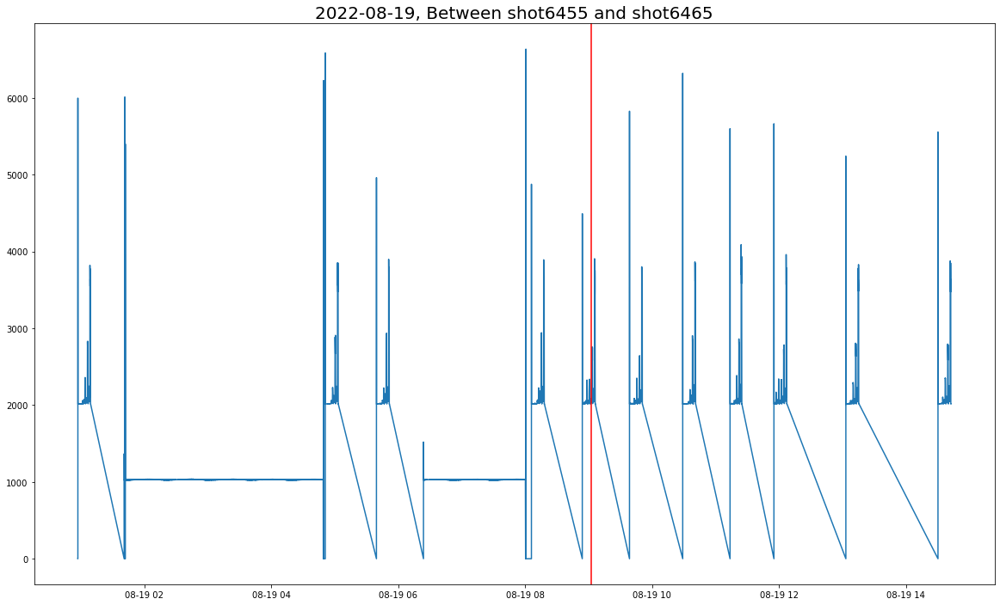

In [195]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6454) & (tool_1['shot_no'] < 6466)]['current_spindle'])
plt.axvline('2022-08-19 09:02:46', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-19, Between shot6455 and shot6465', fontsize = 20)

# 08-20 황삭팁 교체 탐색
교체 시점 : 2022-08-20 09:24:40

In [196]:
tool_1[(tool_1['date'] == '2022-08-20') & ((tool_1['hour'] == '8') | (tool_1['hour'] == '9'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-20 08:00:00,2022-08-20,8,0,0,101.0,6481,1.0,2.0,1032.0,30.0,1.0,0.0,1.0,operation
2022-08-20 08:00:01,2022-08-20,8,0,1,101.0,6481,2.2,2.0,1032.4,30.0,1.0,0.0,1.0,operation
2022-08-20 08:00:02,2022-08-20,8,0,2,101.0,6481,2.6,2.0,1031.8,30.0,1.0,0.0,1.0,operation
2022-08-20 08:00:03,2022-08-20,8,0,3,101.0,6481,3.0,2.0,1033.0,30.0,1.0,0.0,1.0,operation
2022-08-20 08:00:04,2022-08-20,8,0,4,101.0,6481,2.2,2.0,1032.6,30.0,1.0,0.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-20 09:49:44,2022-08-20,9,49,44,101.0,6482,0.0,1456.4,2018.0,299.2,5000.0,0.6,1.0,operation
2022-08-20 09:49:45,2022-08-20,9,49,45,101.0,6482,561.6,1585.4,2015.6,299.6,7071.0,0.4,1.0,operation
2022-08-20 09:49:46,2022-08-20,9,49,46,101.0,6482,381.4,1455.6,2015.0,299.4,6656.8,0.4,1.0,operation


In [197]:
tool_1[tool_1['shot_no'] == 6481]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-20 05:35:07,2022-08-20,5,35,7,100.0,6481,0.0,2.0,0.000000,0.0,0.0,0.000000,1.0,cancel
2022-08-20 05:35:08,2022-08-20,5,35,8,100.0,6481,0.0,2.6,0.000000,0.0,7200.0,0.000000,1.0,cancel
2022-08-20 05:35:09,2022-08-20,5,35,9,100.0,6481,0.0,4.0,17.000000,0.0,4800.0,0.000000,1.0,cancel
2022-08-20 05:35:10,2022-08-20,5,35,10,101.0,6481,49.8,36.8,1005.400000,22.8,226.4,41.800000,1.0,operation
2022-08-20 05:35:11,2022-08-20,5,35,11,101.0,6481,202.8,901.2,1137.200000,30.0,566.0,1.200000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-20 08:20:18,2022-08-20,8,20,18,101.0,6481,183.6,1469.6,2020.000000,299.4,5382.6,0.200000,1.0,operation
2022-08-20 08:20:19,2022-08-20,8,20,19,101.0,6481,431.0,1462.2,2016.800000,299.6,7071.0,0.200000,1.0,operation
2022-08-20 08:20:20,2022-08-20,8,20,20,101.0,6481,326.4,1454.0,2017.400000,299.2,6525.8,0.000000,1.0,operation


In [198]:
tool_1[tool_1['shot_no'] == 6482]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-20 08:53:00,2022-08-20,8,53,0,100.0,6482,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-08-20 08:53:01,2022-08-20,8,53,1,100.0,6482,0.0,2.4,0.0,0.0,5485.6,0.0,1.0,cancel
2022-08-20 08:53:02,2022-08-20,8,53,2,100.0,6482,0.0,2.8,54.8,0.0,4800.0,0.0,1.0,cancel
2022-08-20 08:53:03,2022-08-20,8,53,3,101.0,6482,7.8,5.0,2021.8,116.0,1414.2,133.8,1.0,operation
2022-08-20 08:53:04,2022-08-20,8,53,4,101.0,6482,287.6,687.6,5820.8,300.6,5414.2,12.2,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-20 09:49:44,2022-08-20,9,49,44,101.0,6482,0.0,1456.4,2018.0,299.2,5000.0,0.6,1.0,operation
2022-08-20 09:49:45,2022-08-20,9,49,45,101.0,6482,561.6,1585.4,2015.6,299.6,7071.0,0.4,1.0,operation
2022-08-20 09:49:46,2022-08-20,9,49,46,101.0,6482,381.4,1455.6,2015.0,299.4,6656.8,0.4,1.0,operation


In [199]:
tool_1[tool_1['shot_no'] == 6483]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-20 10:21:58,2022-08-20,10,21,58,100.0,6483,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.0,cancel
2022-08-20 10:21:59,2022-08-20,10,21,59,100.0,6483,0.000000,2.000000,0.000000,0.000000,4800.000000,0.000000,1.0,cancel
2022-08-20 10:22:00,2022-08-20,10,22,0,100.0,6483,0.000000,3.200000,0.000000,0.000000,3942.800000,0.000000,1.0,cancel
2022-08-20 10:22:01,2022-08-20,10,22,1,101.0,6483,8.400000,4.000000,1714.600000,76.600000,0.000000,148.400000,1.0,operation
2022-08-20 10:22:02,2022-08-20,10,22,2,101.0,6483,300.400000,575.800000,5404.400000,300.200000,5414.200000,14.800000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-20 11:18:49,2022-08-20,11,18,49,101.0,6483,487.750000,1511.000000,2021.000000,299.250000,7071.000000,0.750000,1.0,operation
2022-08-20 11:18:50,2022-08-20,11,18,50,101.0,6483,363.833333,1455.833333,2014.500000,299.333333,6035.500000,0.666667,1.0,operation
2022-08-20 11:18:51,2022-08-20,11,18,51,101.0,6483,16.500000,1456.000000,2015.000000,299.250000,5000.000000,0.500000,1.0,operation


# 08-20 교체 전후 shot 5개씩으로 시각화 작성
교체 시점 : 2022-08-20 09:24:40

Text(0.5, 1.0, '2022-08-20, Between shot6476 and shot6485')

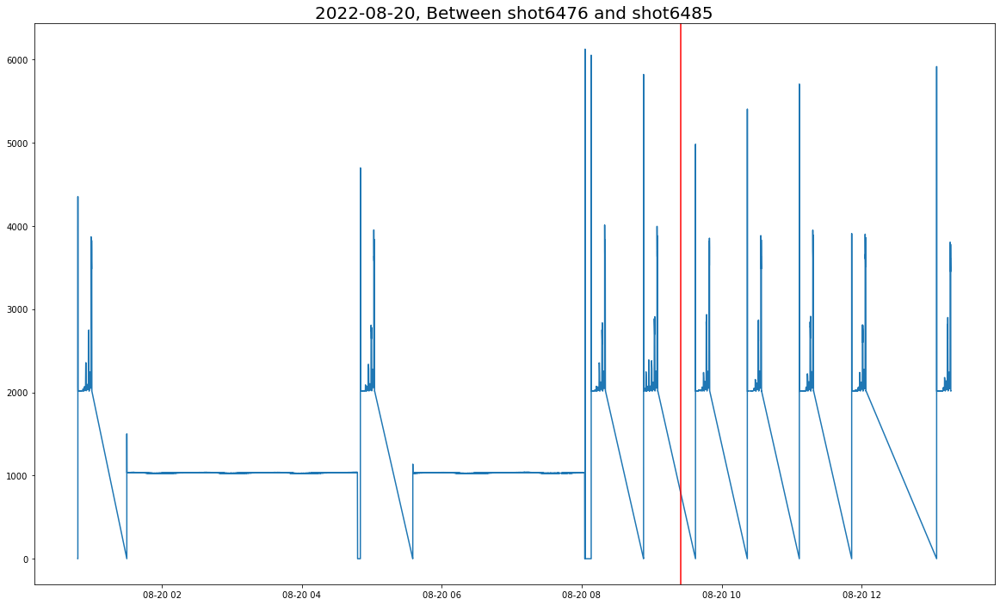

In [200]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6475) & (tool_1['shot_no'] < 6486)]['current_spindle'])
plt.axvline('2022-08-20 09:24:40', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-20, Between shot6476 and shot6485', fontsize = 20)

# 08-21 황삭팁 교체 탐색

In [201]:
tool_1[(tool_1['date'] == '2022-08-21') & ((tool_1['hour'] == '14') | (tool_1['hour'] == '15'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-21 14:00:00,2022-08-21,14,0,0,101.0,6513,23.5,4.0,2020.25,299.75,75.0,0.25,1.0,operation
2022-08-21 14:00:01,2022-08-21,14,0,1,101.0,6513,23.8,4.8,2020.60,299.40,75.0,0.60,1.0,operation
2022-08-21 14:00:02,2022-08-21,14,0,2,101.0,6513,23.8,4.0,2020.00,299.40,75.0,0.20,1.0,operation
2022-08-21 14:00:03,2022-08-21,14,0,3,101.0,6513,25.2,4.0,2019.00,299.20,75.0,0.40,1.0,operation
2022-08-21 14:00:04,2022-08-21,14,0,4,101.0,6513,24.6,4.0,2019.00,299.40,75.0,0.60,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-21 15:59:55,2022-08-21,15,59,55,101.0,6515,6.0,2.0,1717.20,60.00,3.0,0.00,1.0,operation
2022-08-21 15:59:56,2022-08-21,15,59,56,101.0,6515,2.6,2.0,1718.20,60.00,3.0,0.00,1.0,operation
2022-08-21 15:59:57,2022-08-21,15,59,57,101.0,6515,0.4,2.0,1717.00,60.00,3.0,0.00,1.0,operation


In [202]:
tool_1[tool_1['shot_no'] == 6513]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-21 13:57:03,2022-08-21,13,57,3,100.0,6513,0.000000,2.00,0.000000,0.00,0.000000,0.000000,1.0,cancel
2022-08-21 13:57:04,2022-08-21,13,57,4,100.0,6513,0.000000,2.00,0.000000,0.00,2400.000000,0.000000,1.0,cancel
2022-08-21 13:57:05,2022-08-21,13,57,5,100.0,6513,0.000000,4.20,0.000000,0.00,9600.000000,0.000000,1.0,cancel
2022-08-21 13:57:06,2022-08-21,13,57,6,100.0,6513,0.000000,4.00,0.000000,0.00,0.000000,0.000000,1.0,cancel
2022-08-21 13:57:06,2022-08-21,13,57,6,101.0,6513,0.000000,3.50,626.000000,2.00,0.000000,73.000000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-21 14:09:16,2022-08-21,14,9,16,101.0,6513,0.000000,1454.75,2014.000000,299.50,5000.000000,0.250000,1.0,operation
2022-08-21 14:09:17,2022-08-21,14,9,17,101.0,6513,347.400000,1414.80,2016.000000,299.00,6068.200000,0.600000,1.0,operation
2022-08-21 14:09:18,2022-08-21,14,9,18,101.0,6513,423.000000,1474.00,2017.166667,299.00,7071.000000,0.666667,1.0,operation


<AxesSubplot:xlabel='datetime'>

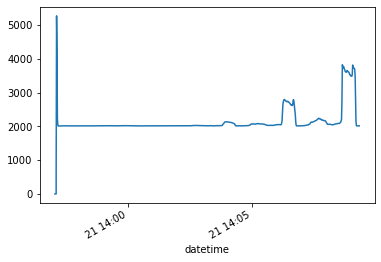

In [203]:
tool_1[tool_1['shot_no'] == 6513]['current_spindle'].plot()

In [204]:
tool_1[tool_1['shot_no'] == 6514]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-21 14:41:28,2022-08-21,14,41,28,100.0,6514,0.00,2.0,0.0,0.0,0.0,0.00,1.0,cancel
2022-08-21 14:41:29,2022-08-21,14,41,29,100.0,6514,0.00,2.0,0.0,0.0,4800.0,0.00,1.0,cancel
2022-08-21 14:41:30,2022-08-21,14,41,30,100.0,6514,0.00,4.4,0.0,0.0,7200.0,0.00,1.0,cancel
2022-08-21 14:41:31,2022-08-21,14,41,31,100.0,6514,0.00,2.0,0.0,0.0,0.0,0.00,1.0,cancel
2022-08-21 14:41:31,2022-08-21,14,41,31,101.0,6514,6.00,3.5,1163.0,66.5,0.0,152.25,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-21 14:53:41,2022-08-21,14,53,41,101.0,6514,143.40,1502.2,2018.2,299.0,5828.4,0.40,1.0,operation
2022-08-21 14:53:42,2022-08-21,14,53,42,101.0,6514,549.60,1504.6,2019.0,299.0,7071.0,0.40,1.0,operation
2022-08-21 14:53:43,2022-08-21,14,53,43,101.0,6514,374.80,1459.6,2015.4,299.8,6656.8,0.60,1.0,operation


<AxesSubplot:xlabel='datetime'>

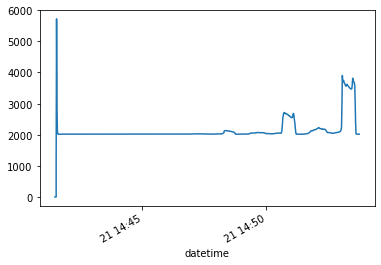

In [205]:
tool_1[tool_1['shot_no'] == 6514]['current_spindle'].plot()

In [206]:
tool_1[tool_1['shot_no'] == 6515]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-21 15:48:01,2022-08-21,15,48,1,100.0,6515,0.00,2.0,0.00,0.0,0.0,0.0,1.0,cancel
2022-08-21 15:48:02,2022-08-21,15,48,2,100.0,6515,0.00,2.6,0.00,0.0,4800.0,0.0,1.0,cancel
2022-08-21 15:48:03,2022-08-21,15,48,3,100.0,6515,0.00,3.8,0.00,0.0,4800.0,0.0,1.0,cancel
2022-08-21 15:48:04,2022-08-21,15,48,4,100.0,6515,0.00,2.0,0.00,0.0,0.0,0.0,1.0,cancel
2022-08-21 15:48:04,2022-08-21,15,48,4,101.0,6515,21.75,9.5,1509.75,40.5,141.5,64.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-21 19:46:20,2022-08-21,19,46,20,101.0,6515,0.00,2.0,0.00,0.0,0.0,0.0,1.0,operation
2022-08-21 19:46:21,2022-08-21,19,46,21,101.0,6515,0.00,2.0,0.00,0.0,0.0,0.0,1.0,operation
2022-08-21 19:46:22,2022-08-21,19,46,22,101.0,6515,0.00,2.0,0.00,0.0,0.0,0.0,1.0,operation


<AxesSubplot:xlabel='datetime'>

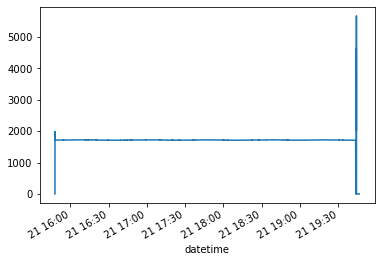

In [207]:
tool_1[tool_1['shot_no'] == 6515]['current_spindle'].plot()

# 08-21 교체 전후 shot 5개씩으로 시각화 작성
교체 시점 : 2022-08-21 14:24:03

Text(0.5, 1.0, '2022-08-21, Between shot6510 and shot6517')

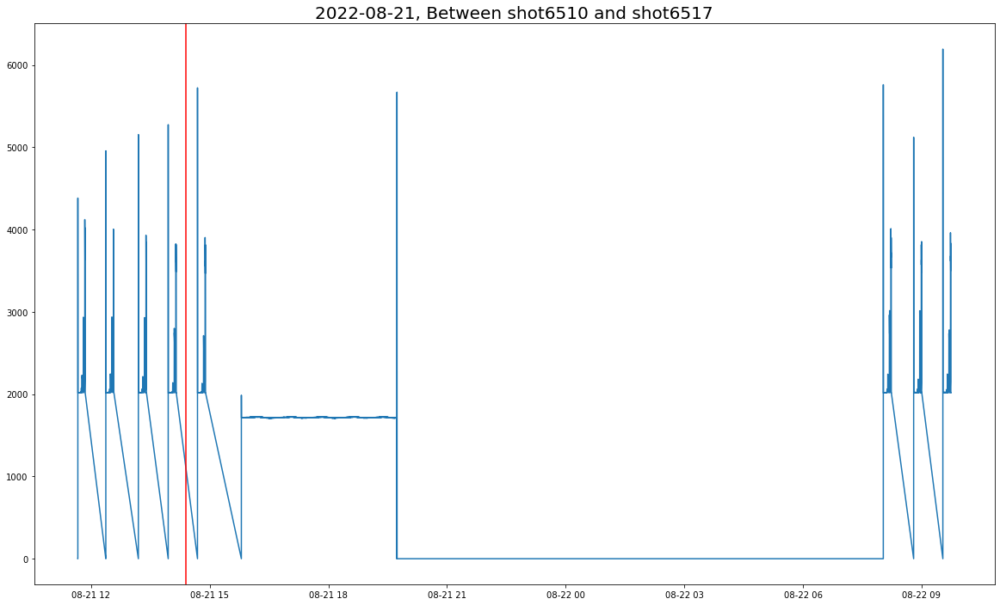

In [208]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6509) & (tool_1['shot_no'] < 6518)]['current_spindle'])
plt.axvline('2022-08-21 14:24:03', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-21, Between shot6510 and shot6517', fontsize = 20)

# 08-28 황삭팁 교체 탐색
C-LIVE 교체이력의 값과 황삭팁 교체 시점이 일치하지 않는 것으로 추정됨
재탐색 및 데이터의 정합성 판단이 필요할 것으로 보여짐

In [209]:
tool_1[(tool_1['date'] == '2022-08-28') & ((tool_1['hour'] == '18') | (tool_1['hour'] == '19'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-28 18:00:00,2022-08-28,18,0,0,101.0,6667,3.4,2.0,1029.2,30.0,1.0,0.0,1.0,operation
2022-08-28 18:00:01,2022-08-28,18,0,1,101.0,6667,3.8,2.0,1029.0,30.0,1.0,0.0,1.0,operation
2022-08-28 18:00:02,2022-08-28,18,0,2,101.0,6667,5.8,2.0,1028.2,30.0,1.0,0.0,1.0,operation
2022-08-28 18:00:03,2022-08-28,18,0,3,101.0,6667,5.2,2.0,1029.4,30.0,1.0,0.0,1.0,operation
2022-08-28 18:00:04,2022-08-28,18,0,4,101.0,6667,5.0,2.0,1031.2,30.0,1.0,0.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-28 19:59:55,2022-08-28,19,59,55,101.0,6667,0.0,2.0,0.0,0.0,0.0,0.0,1.0,operation
2022-08-28 19:59:56,2022-08-28,19,59,56,101.0,6667,0.0,2.0,0.0,0.0,0.0,0.0,1.0,operation
2022-08-28 19:59:57,2022-08-28,19,59,57,101.0,6667,0.0,2.0,0.0,0.0,0.0,0.0,1.0,operation


<AxesSubplot:xlabel='datetime'>

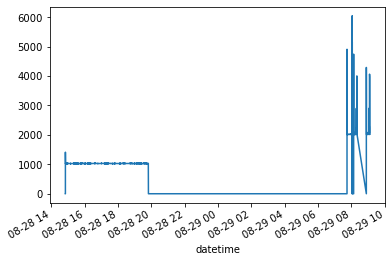

In [210]:
tool_1[(tool_1['shot_no'] == 6667) | (tool_1['shot_no'] == 6668)]['current_spindle'].plot()

<AxesSubplot:xlabel='datetime'>

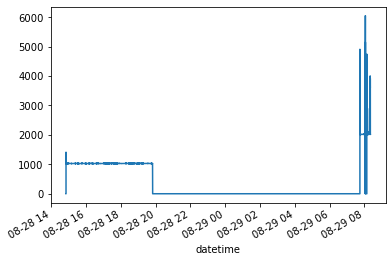

In [211]:
tool_1[(tool_1['shot_no'] == 6667)]['current_spindle'].plot()

In [212]:
tool_1[(tool_1['date'] == '2022-08-28') & ((tool_1['hour'] == '18') & (tool_1['minute'] == '48'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-28 18:48:00,2022-08-28,18,48,0,101.0,6667,4.000000,2.000000,1030.200000,30.0,1.0,0.0,1.0,operation
2022-08-28 18:48:01,2022-08-28,18,48,1,101.0,6667,4.000000,2.000000,1031.600000,30.0,1.0,0.0,1.0,operation
2022-08-28 18:48:02,2022-08-28,18,48,2,101.0,6667,4.000000,2.000000,1030.000000,30.0,1.0,0.0,1.0,operation
2022-08-28 18:48:03,2022-08-28,18,48,3,101.0,6667,4.000000,2.000000,1029.600000,30.0,1.0,0.0,1.0,operation
2022-08-28 18:48:04,2022-08-28,18,48,4,101.0,6667,5.000000,2.000000,1031.800000,30.0,1.0,0.0,1.0,operation
2022-08-28 18:48:05,2022-08-28,18,48,5,101.0,6667,4.000000,2.000000,1029.400000,30.0,1.0,0.0,1.0,operation
2022-08-28 18:48:06,2022-08-28,18,48,6,101.0,6667,4.000000,2.000000,1030.800000,30.0,1.0,0.0,1.0,operation
2022-08-28 18:48:07,2022-08-28,18,48,7,101.0,6667,4.000000,2.000000,1031.200000,30.0,1.0,0.0,1.0,operation
2022-08-28 18:48:08,2022-08-28,18,48,8,101.0,6667,4.000000,2.000000,1029.800000,30.0,1.0,0.0,1.0,operation


In [213]:
tool_1[(tool_1['date'] == '2022-08-28') & (tool_1['hour'] == '18')]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-28 18:00:00,2022-08-28,18,0,0,101.0,6667,3.4,2.0,1029.2,30.0,1.0,0.0,1.0,operation
2022-08-28 18:00:01,2022-08-28,18,0,1,101.0,6667,3.8,2.0,1029.0,30.0,1.0,0.0,1.0,operation
2022-08-28 18:00:02,2022-08-28,18,0,2,101.0,6667,5.8,2.0,1028.2,30.0,1.0,0.0,1.0,operation
2022-08-28 18:00:03,2022-08-28,18,0,3,101.0,6667,5.2,2.0,1029.4,30.0,1.0,0.0,1.0,operation
2022-08-28 18:00:04,2022-08-28,18,0,4,101.0,6667,5.0,2.0,1031.2,30.0,1.0,0.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-28 18:59:55,2022-08-28,18,59,55,101.0,6667,3.0,4.0,1027.0,30.0,1.0,0.0,1.0,operation
2022-08-28 18:59:56,2022-08-28,18,59,56,101.0,6667,4.0,4.0,1025.6,30.0,1.0,0.0,1.0,operation
2022-08-28 18:59:57,2022-08-28,18,59,57,101.0,6667,3.0,4.6,1025.4,30.0,1.0,0.0,1.0,operation


In [214]:
tool_1[tool_1['shot_no'] == 6668]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-29 08:54:04,2022-08-29,8,54,4,100.0,6668,0.000000,2.0,0.000000,0.000000,0.000000,0.00,1.0,cancel
2022-08-29 08:54:05,2022-08-29,8,54,5,100.0,6668,0.000000,2.0,0.000000,0.000000,2571.333333,0.00,1.0,cancel
2022-08-29 08:54:06,2022-08-29,8,54,6,100.0,6668,0.000000,4.0,0.000000,0.000000,6000.000000,0.00,1.0,cancel
2022-08-29 08:54:07,2022-08-29,8,54,7,100.0,6668,0.000000,4.0,0.000000,0.000000,0.000000,0.00,1.0,cancel
2022-08-29 08:54:07,2022-08-29,8,54,7,101.0,6668,1.333333,3.0,930.666667,15.333333,0.000000,135.00,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-29 09:06:18,2022-08-29,9,6,18,101.0,6668,349.000000,1453.8,2017.200000,299.200000,7071.000000,0.60,1.0,operation
2022-08-29 09:06:19,2022-08-29,9,6,19,101.0,6668,425.000000,1472.0,2018.000000,299.250000,7052.750000,0.75,1.0,operation
2022-08-29 09:06:20,2022-08-29,9,6,20,101.0,6668,172.666667,1472.5,2018.000000,299.333333,5000.000000,0.50,1.0,operation


In [215]:
tool_1[tool_1['shot_no'] == 6669]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-29 09:45:05,2022-08-29,9,45,5,100.0,6669,0.0,2.000000,0.0,0.000000,0.000000,0.000000,1.0,cancel
2022-08-29 09:45:06,2022-08-29,9,45,6,100.0,6669,0.0,2.800000,0.0,0.000000,9600.000000,0.000000,1.0,cancel
2022-08-29 09:45:07,2022-08-29,9,45,7,100.0,6669,0.0,4.000000,0.0,0.000000,0.000000,0.000000,1.0,cancel
2022-08-29 09:45:07,2022-08-29,9,45,7,101.0,6669,0.0,2.000000,1064.5,8.000000,0.000000,122.000000,1.0,operation
2022-08-29 09:45:08,2022-08-29,9,45,8,101.0,6669,2.6,9.400000,5526.8,188.400000,1414.200000,111.400000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-29 09:57:18,2022-08-29,9,57,18,101.0,6669,247.2,1426.000000,2015.2,299.200000,5654.000000,0.800000,1.0,operation
2022-08-29 09:57:19,2022-08-29,9,57,19,101.0,6669,518.5,1512.000000,2017.0,299.000000,7071.000000,1.000000,1.0,operation
2022-08-29 09:57:20,2022-08-29,9,57,20,101.0,6669,345.5,1469.333333,2017.0,299.166667,5690.333333,0.833333,1.0,operation


# 08-28 교체 전후 shot 5개씩으로 시각화 작성
교체 시점 : 2022-08-28 06:48:35

Text(0.5, 1.0, '2022-08-28, Between shot6664 and shot6671')

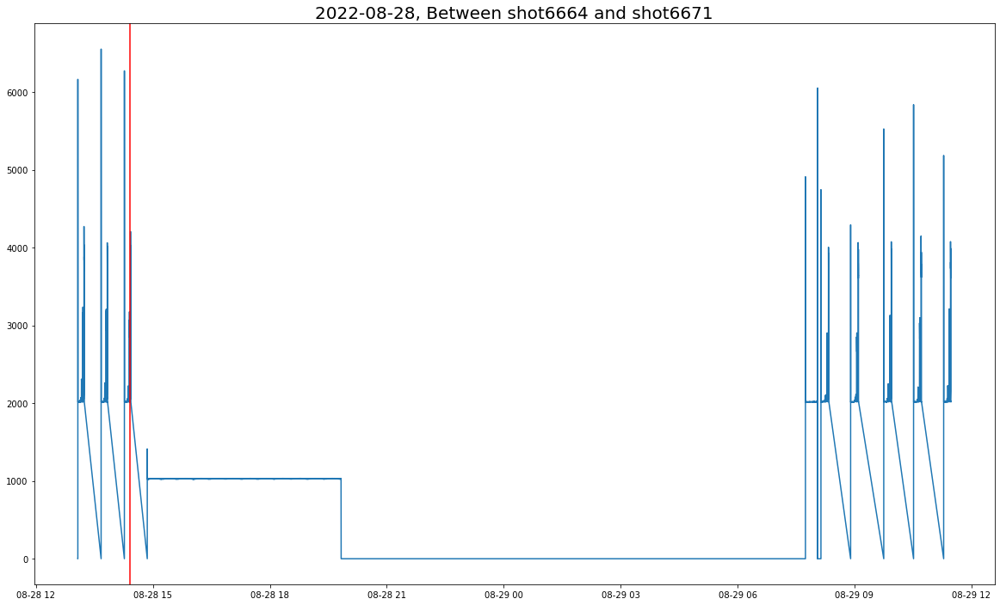

In [216]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6663) & (tool_1['shot_no'] < 6672)]['current_spindle'])
plt.axvline('2022-08-28 14:24:03', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-28, Between shot6664 and shot6671', fontsize = 20)

# 08-29 황삭팁 교체 탐색

In [217]:
tool_1[(tool_1['date'] == '2022-08-29') & ((tool_1['hour'] == '16') | (tool_1['hour'] == '18'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-29 16:00:00,2022-08-29,16,0,0,101.0,6675,35.8,2.0,2020.2,299.2,75.0,0.8,1.0,operation
2022-08-29 16:00:01,2022-08-29,16,0,1,101.0,6675,36.2,2.0,2020.0,299.8,75.0,0.6,1.0,operation
2022-08-29 16:00:02,2022-08-29,16,0,2,101.0,6675,35.8,2.0,2020.0,299.6,75.0,0.6,1.0,operation
2022-08-29 16:00:03,2022-08-29,16,0,3,101.0,6675,35.2,2.0,2018.8,299.4,75.0,0.8,1.0,operation
2022-08-29 16:00:04,2022-08-29,16,0,4,101.0,6675,34.6,2.0,2018.6,299.4,75.0,0.6,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-29 18:40:25,2022-08-29,18,40,25,101.0,6677,0.0,1462.4,2018.6,299.4,4000.0,0.4,1.0,operation
2022-08-29 18:40:26,2022-08-29,18,40,26,101.0,6677,528.8,1537.6,2016.0,299.2,5656.8,0.8,1.0,operation
2022-08-29 18:40:27,2022-08-29,18,40,27,101.0,6677,432.0,1463.0,2016.0,299.0,6656.8,0.8,1.0,operation


In [218]:
tool_1[tool_1['shot_no'] == 6675]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-29 15:58:51,2022-08-29,15,58,51,100.0,6675,0.0,2.00,0.0,0.0,0.00,0.0,1.0,cancel
2022-08-29 15:58:52,2022-08-29,15,58,52,100.0,6675,0.0,2.60,0.0,0.0,7885.80,0.0,1.0,cancel
2022-08-29 15:58:53,2022-08-29,15,58,53,100.0,6675,0.0,2.75,0.0,0.0,5357.25,0.0,1.0,cancel
2022-08-29 15:58:53,2022-08-29,15,58,53,101.0,6675,0.0,2.00,309.0,0.0,0.00,101.0,1.0,operation
2022-08-29 15:58:54,2022-08-29,15,58,54,101.0,6675,148.8,5.00,2002.2,134.0,0.00,127.4,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-29 16:55:18,2022-08-29,16,55,18,101.0,6675,0.0,1484.00,2015.2,299.2,5414.20,0.8,1.0,operation
2022-08-29 16:55:19,2022-08-29,16,55,19,101.0,6675,539.0,1509.00,2016.6,299.0,7071.00,0.6,1.0,operation
2022-08-29 16:55:20,2022-08-29,16,55,20,101.0,6675,434.2,1464.00,2016.6,299.2,6656.80,0.4,1.0,operation


In [219]:
tool_1[tool_1['shot_no'] == 6676]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-29 17:42:09,2022-08-29,17,42,9,100.0,6676,0.0,2.00,0.000000,0.000000,2400.0,0.0,1.0,cancel
2022-08-29 17:42:10,2022-08-29,17,42,10,100.0,6676,0.0,3.75,0.000000,0.000000,12000.0,0.0,1.0,cancel
2022-08-29 17:42:11,2022-08-29,17,42,11,100.0,6676,0.0,4.00,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-29 17:42:11,2022-08-29,17,42,11,101.0,6676,0.0,2.00,1144.666667,4.333333,0.0,81.0,1.0,operation
2022-08-29 17:42:12,2022-08-29,17,42,12,101.0,6676,4.8,195.40,5221.600000,237.600000,2828.4,89.2,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-29 17:54:22,2022-08-29,17,54,22,101.0,6676,385.6,1447.40,2017.000000,299.600000,6050.8,0.4,1.0,operation
2022-08-29 17:54:23,2022-08-29,17,54,23,101.0,6676,449.4,1473.80,2018.800000,299.200000,7071.0,0.6,1.0,operation
2022-08-29 17:54:24,2022-08-29,17,54,24,101.0,6676,219.8,1466.20,2020.000000,299.400000,5414.2,0.6,1.0,operation


In [220]:
tool_1[tool_1['shot_no'] == 6677]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-29 18:28:12,2022-08-29,18,28,12,100.0,6677,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-29 18:28:13,2022-08-29,18,28,13,100.0,6677,0.0,2.000000,0.000000,0.000000,2400.0,0.0,1.0,cancel
2022-08-29 18:28:14,2022-08-29,18,28,14,100.0,6677,0.0,3.200000,0.000000,0.000000,12000.0,0.0,1.0,cancel
2022-08-29 18:28:15,2022-08-29,18,28,15,100.0,6677,0.0,2.000000,0.000000,0.000000,0.0,0.0,1.0,cancel
2022-08-29 18:28:15,2022-08-29,18,28,15,101.0,6677,0.0,4.333333,1798.333333,22.666667,0.0,142.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-29 18:40:25,2022-08-29,18,40,25,101.0,6677,0.0,1462.400000,2018.600000,299.400000,4000.0,0.4,1.0,operation
2022-08-29 18:40:26,2022-08-29,18,40,26,101.0,6677,528.8,1537.600000,2016.000000,299.200000,5656.8,0.8,1.0,operation
2022-08-29 18:40:27,2022-08-29,18,40,27,101.0,6677,432.0,1463.000000,2016.000000,299.000000,6656.8,0.8,1.0,operation


# 08-29 교체 전후 shot 5개씩으로 시각화 작성
교체 시점 : 2022-08-29 17:50:00

Text(0.5, 1.0, '2022-08-29, Between shot6673 and shot6679')

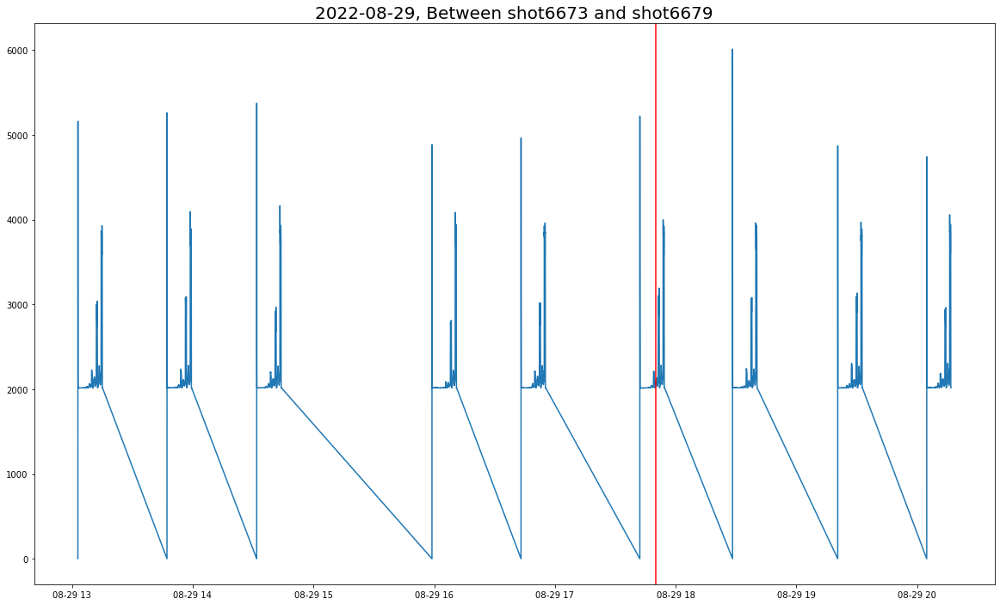

In [221]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6672) & (tool_1['shot_no'] < 6680)]['current_spindle'])
plt.axvline('2022-08-29 17:50:00', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-29, Between shot6673 and shot6679', fontsize = 20)

# 08-30 황삭팁 교체 탐색

In [222]:
tool_1[(tool_1['date'] == '2022-08-30') & ((tool_1['hour'] == '9') | (tool_1['hour'] == '10'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-30 09:00:00,2022-08-30,9,0,0,101.0,6691,29.2,4.000000,2020.4,299.400000,75.0,0.600000,1.0,operation
2022-08-30 09:00:01,2022-08-30,9,0,1,101.0,6691,28.2,4.000000,2020.6,299.600000,75.0,0.200000,1.0,operation
2022-08-30 09:00:02,2022-08-30,9,0,2,101.0,6691,29.2,4.000000,2020.0,299.400000,75.0,0.200000,1.0,operation
2022-08-30 09:00:03,2022-08-30,9,0,3,101.0,6691,28.8,4.000000,2020.4,299.400000,75.0,0.600000,1.0,operation
2022-08-30 09:00:04,2022-08-30,9,0,4,101.0,6691,29.2,4.000000,2021.0,299.200000,75.0,0.600000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-30 10:35:22,2022-08-30,10,35,22,101.0,6692,248.4,1495.400000,2014.0,299.800000,6242.6,0.600000,1.0,operation
2022-08-30 10:35:23,2022-08-30,10,35,23,101.0,6692,513.6,1495.800000,2015.8,299.000000,7071.0,0.400000,1.0,operation
2022-08-30 10:35:24,2022-08-30,10,35,24,101.0,6692,325.8,1458.800000,2017.0,299.800000,5828.4,0.200000,1.0,operation


In [223]:
tool_1[tool_1['shot_no'] == 6691]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-30 08:55:30,2022-08-30,8,55,30,100.0,6691,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-08-30 08:55:31,2022-08-30,8,55,31,100.0,6691,0.0,2.4,0.0,0.0,4800.0,0.0,1.0,cancel
2022-08-30 08:55:32,2022-08-30,8,55,32,100.0,6691,0.0,3.6,0.0,0.0,4800.0,0.0,1.0,cancel
2022-08-30 08:55:33,2022-08-30,8,55,33,101.0,6691,1.8,11.2,2363.0,39.4,0.0,114.8,1.0,operation
2022-08-30 08:55:34,2022-08-30,8,55,34,101.0,6691,117.8,412.0,6235.4,302.6,5828.4,12.8,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-30 09:52:20,2022-08-30,9,52,20,101.0,6691,128.0,1387.8,2016.8,299.0,5414.2,0.8,1.0,operation
2022-08-30 09:52:21,2022-08-30,9,52,21,101.0,6691,561.8,1495.8,2017.2,299.0,7071.0,0.4,1.0,operation
2022-08-30 09:52:22,2022-08-30,9,52,22,101.0,6691,341.8,1458.8,2019.0,299.2,6242.6,0.2,1.0,operation


In [224]:
tool_1[tool_1['shot_no'] == 6692]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-30 10:24:13,2022-08-30,10,24,13,100.0,6692,0.000000,2.000000,0.000000,0.000000,0.0,0.000000,1.0,cancel
2022-08-30 10:24:14,2022-08-30,10,24,14,100.0,6692,0.000000,2.000000,0.000000,0.000000,0.0,0.000000,1.0,cancel
2022-08-30 10:24:15,2022-08-30,10,24,15,100.0,6692,0.000000,2.800000,0.000000,0.000000,9600.0,0.000000,1.0,cancel
2022-08-30 10:24:16,2022-08-30,10,24,16,100.0,6692,0.000000,2.000000,0.000000,0.000000,0.0,0.000000,1.0,cancel
2022-08-30 10:24:16,2022-08-30,10,24,16,101.0,6692,2.333333,3.666667,1248.666667,18.000000,0.0,142.000000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-30 10:35:22,2022-08-30,10,35,22,101.0,6692,248.400000,1495.400000,2014.000000,299.800000,6242.6,0.600000,1.0,operation
2022-08-30 10:35:23,2022-08-30,10,35,23,101.0,6692,513.600000,1495.800000,2015.800000,299.000000,7071.0,0.400000,1.0,operation
2022-08-30 10:35:24,2022-08-30,10,35,24,101.0,6692,325.800000,1458.800000,2017.000000,299.800000,5828.4,0.200000,1.0,operation


In [225]:
tool_1[tool_1['shot_no'] == 6693]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-30 11:05:52,2022-08-30,11,5,52,100.0,6693,0.0,2.0,0.0,0.00,0.0,0.00,1.0,cancel
2022-08-30 11:05:53,2022-08-30,11,5,53,100.0,6693,0.0,2.0,0.0,0.00,7200.0,0.00,1.0,cancel
2022-08-30 11:05:54,2022-08-30,11,5,54,100.0,6693,0.0,2.8,0.0,0.00,2400.0,0.00,1.0,cancel
2022-08-30 11:05:55,2022-08-30,11,5,55,100.0,6693,0.0,2.0,0.0,0.00,0.0,0.00,1.0,cancel
2022-08-30 11:05:55,2022-08-30,11,5,55,101.0,6693,4.0,6.0,3147.5,83.25,0.0,157.25,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-30 11:17:00,2022-08-30,11,17,0,101.0,6693,0.0,1455.4,2015.0,299.60,5000.0,0.40,1.0,operation
2022-08-30 11:17:01,2022-08-30,11,17,1,101.0,6693,464.4,1583.4,2015.8,299.60,7071.0,0.40,1.0,operation
2022-08-30 11:17:02,2022-08-30,11,17,2,101.0,6693,436.4,1459.4,2016.0,299.40,6656.8,0.40,1.0,operation


Text(0.5, 1.0, '2022-08-30, Between shot6686 and shot6696')

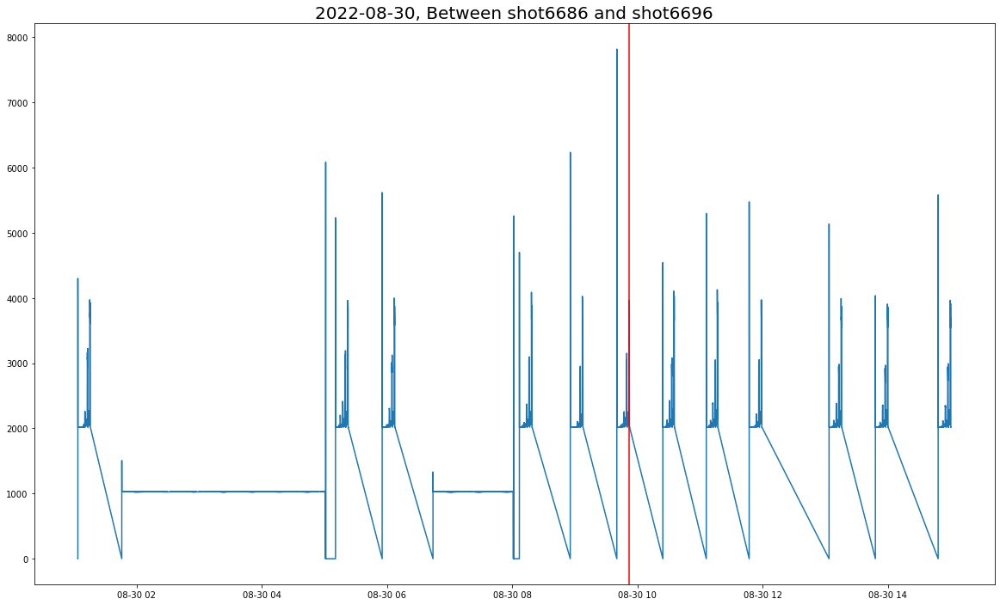

In [226]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6685) & (tool_1['shot_no'] < 6697)]['current_spindle'])
plt.axvline('2022-08-30 09:52:00', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-30, Between shot6686 and shot6696', fontsize = 20)

# 08-31 황삭팁 교체 탐색

In [227]:
tool_1[(tool_1['date'] == '2022-08-31') & ((tool_1['hour'] == '19') | (tool_1['hour'] == '20'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-31 19:00:00,2022-08-31,19,0,0,101.0,6723,31.8,2.0,2018.4,299.2,75.0,0.4,1.0,operation
2022-08-31 19:00:01,2022-08-31,19,0,1,101.0,6723,31.6,2.0,2019.0,299.2,75.0,0.4,1.0,operation
2022-08-31 19:00:02,2022-08-31,19,0,2,101.0,6723,32.2,2.0,2018.0,299.2,75.0,0.8,1.0,operation
2022-08-31 19:00:03,2022-08-31,19,0,3,101.0,6723,31.8,2.0,2018.0,299.4,75.0,0.8,1.0,operation
2022-08-31 19:00:04,2022-08-31,19,0,4,101.0,6723,32.2,2.0,2018.0,299.6,75.0,0.4,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-31 20:37:09,2022-08-31,20,37,9,101.0,6726,30.2,2.0,2040.0,299.2,75.0,0.4,1.0,operation
2022-08-31 20:37:10,2022-08-31,20,37,10,101.0,6726,30.2,2.0,2016.2,300.0,75.0,0.6,1.0,operation
2022-08-31 20:37:11,2022-08-31,20,37,11,101.0,6726,27.4,1524.2,2015.0,299.2,12015.0,0.4,1.0,operation


In [228]:
tool_1[tool_1['shot_no'] == 6723]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-31 18:58:40,2022-08-31,18,58,40,100.0,6723,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-08-31 18:58:41,2022-08-31,18,58,41,100.0,6723,0.0,2.5,0.0,0.0,6571.5,0.0,1.0,cancel
2022-08-31 18:58:42,2022-08-31,18,58,42,100.0,6723,0.0,3.5,0.0,0.0,3000.0,0.0,1.0,cancel
2022-08-31 18:58:43,2022-08-31,18,58,43,101.0,6723,4.2,4.4,1496.0,54.4,0.0,137.0,1.0,operation
2022-08-31 18:58:44,2022-08-31,18,58,44,101.0,6723,338.8,368.0,6069.4,295.8,4039.2,22.2,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-31 19:10:48,2022-08-31,19,10,48,101.0,6723,264.4,1523.6,2016.0,299.0,4828.4,0.6,1.0,operation
2022-08-31 19:10:49,2022-08-31,19,10,49,101.0,6723,453.0,1495.6,2016.6,299.6,7071.0,0.4,1.0,operation
2022-08-31 19:10:50,2022-08-31,19,10,50,101.0,6723,332.0,1464.6,2015.4,299.6,6242.6,0.8,1.0,operation


shot_no 6724값은 없으며, 6723에서 6725로 넘어감

In [229]:
tool_1[tool_1['shot_no'] == 6725]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-31 19:42:18,2022-08-31,19,42,18,100.0,6725,0.0,2.0,0.0,0.00,0.0,0.0,1.0,cancel
2022-08-31 19:42:19,2022-08-31,19,42,19,100.0,6725,0.0,2.0,0.0,0.00,8228.6,0.0,1.0,cancel
2022-08-31 19:42:20,2022-08-31,19,42,20,100.0,6725,0.0,3.0,0.0,0.00,3000.0,0.0,1.0,cancel
2022-08-31 19:42:20,2022-08-31,19,42,20,101.0,6725,0.0,2.0,0.0,0.00,0.0,22.0,1.0,operation
2022-08-31 19:42:21,2022-08-31,19,42,21,101.0,6725,5.4,4.8,3102.8,107.40,0.0,153.6,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-31 19:54:32,2022-08-31,19,54,32,101.0,6725,476.4,1483.4,2017.2,299.00,7071.0,0.4,1.0,operation
2022-08-31 19:54:33,2022-08-31,19,54,33,101.0,6725,304.8,1463.6,2018.0,299.00,5414.2,0.4,1.0,operation
2022-08-31 19:54:34,2022-08-31,19,54,34,101.0,6725,6.5,1462.5,2018.0,299.75,5000.0,0.5,1.0,operation


In [230]:
tool_1[tool_1['shot_no'] == 6726]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-31 20:25:10,2022-08-31,20,25,10,100.0,6726,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-08-31 20:25:11,2022-08-31,20,25,11,100.0,6726,0.0,2.0,0.0,0.0,7200.0,0.0,1.0,cancel
2022-08-31 20:25:12,2022-08-31,20,25,12,100.0,6726,0.0,3.2,0.0,0.0,4800.0,0.0,1.0,cancel
2022-08-31 20:25:13,2022-08-31,20,25,13,101.0,6726,5.2,4.4,1937.4,46.4,0.0,120.2,1.0,operation
2022-08-31 20:25:14,2022-08-31,20,25,14,101.0,6726,438.4,577.8,6641.0,293.6,16000.0,24.8,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-31 20:37:09,2022-08-31,20,37,9,101.0,6726,30.2,2.0,2040.0,299.2,75.0,0.4,1.0,operation
2022-08-31 20:37:10,2022-08-31,20,37,10,101.0,6726,30.2,2.0,2016.2,300.0,75.0,0.6,1.0,operation
2022-08-31 20:37:11,2022-08-31,20,37,11,101.0,6726,27.4,1524.2,2015.0,299.2,12015.0,0.4,1.0,operation


In [231]:
tool_1.tail()

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800,29.2,2.0,2050.2,299.4,75.0,0.4,1.0,operation
2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800,28.8,2.0,2016.4,299.2,75.0,0.4,1.0,operation
2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800,27.4,1227.2,2014.0,299.4,12015.0,0.4,1.0,operation
2022-09-03 22:55:27,2022-09-03,22,55,27,101.0,6800,534.2,2051.2,2014.0,299.0,14994.4,0.4,1.0,operation
2022-09-03 22:55:28,2022-09-03,22,55,28,101.0,6800,277.0,1607.0,2014.0,299.0,5000.0,0.5,1.0,operation


Text(0.5, 1.0, '2022-08-31, Between shot6719 and shot6730')

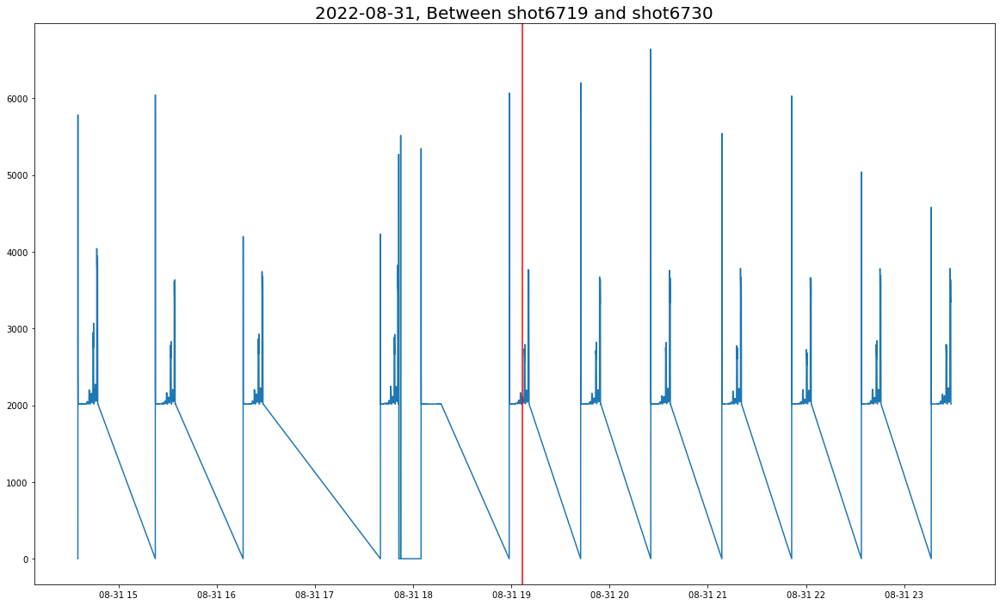

In [232]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6718) & (tool_1['shot_no'] < 6731)]['current_spindle'])
plt.axvline('2022-08-31 19:07:00', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-08-31, Between shot6719 and shot6730', fontsize = 20)

# 09-01 황삭팁 교체 탐색

In [233]:
tool_1[(tool_1['date'] == '2022-09-01') & ((tool_1['hour'] == '10') | (tool_1['hour'] == '11'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-01 10:26:02,2022-09-01,10,26,2,100.0,6739,0.0,2.000000,0.0,0.0,0.0,0.0,1.0,cancel
2022-09-01 10:26:03,2022-09-01,10,26,3,100.0,6739,0.0,2.000000,0.0,0.0,342.8,0.0,1.0,cancel
2022-09-01 10:26:04,2022-09-01,10,26,4,100.0,6739,0.0,4.000000,0.0,0.0,7200.0,0.0,1.0,cancel
2022-09-01 10:26:05,2022-09-01,10,26,5,100.0,6739,0.0,2.666667,0.0,0.0,0.0,0.0,1.0,cancel
2022-09-01 10:26:05,2022-09-01,10,26,5,101.0,6739,1.5,3.000000,1096.0,34.5,0.0,150.5,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01 11:59:55,2022-09-01,11,59,55,101.0,6741,35.6,2.000000,2016.4,299.0,82.0,0.6,1.0,operation
2022-09-01 11:59:56,2022-09-01,11,59,56,101.0,6741,35.6,2.000000,2016.2,299.0,82.0,0.8,1.0,operation
2022-09-01 11:59:57,2022-09-01,11,59,57,101.0,6741,34.8,2.000000,2016.6,299.4,82.0,0.6,1.0,operation


In [234]:
tool_1[tool_1['shot_no'] == 6739]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-01 10:26:02,2022-09-01,10,26,2,100.0,6739,0.0,2.000000,0.0,0.0,0.0,0.0,1.0,cancel
2022-09-01 10:26:03,2022-09-01,10,26,3,100.0,6739,0.0,2.000000,0.0,0.0,342.8,0.0,1.0,cancel
2022-09-01 10:26:04,2022-09-01,10,26,4,100.0,6739,0.0,4.000000,0.0,0.0,7200.0,0.0,1.0,cancel
2022-09-01 10:26:05,2022-09-01,10,26,5,100.0,6739,0.0,2.666667,0.0,0.0,0.0,0.0,1.0,cancel
2022-09-01 10:26:05,2022-09-01,10,26,5,101.0,6739,1.5,3.000000,1096.0,34.5,0.0,150.5,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01 10:38:16,2022-09-01,10,38,16,101.0,6739,242.8,1523.800000,2017.2,299.2,6656.8,0.8,1.0,operation
2022-09-01 10:38:17,2022-09-01,10,38,17,101.0,6739,472.0,1482.200000,2019.6,299.0,7071.0,1.0,1.0,operation
2022-09-01 10:38:18,2022-09-01,10,38,18,101.0,6739,199.4,1461.600000,2020.0,299.0,5303.8,0.6,1.0,operation


In [235]:
tool_1[tool_1['shot_no'] == 6740]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-01 11:16:04,2022-09-01,11,16,4,100.0,6740,0.0,2.000000,0.000000,0.0,0.0,0.0,1.0,cancel
2022-09-01 11:16:05,2022-09-01,11,16,5,100.0,6740,0.0,2.000000,0.000000,0.0,0.0,0.0,1.0,cancel
2022-09-01 11:16:06,2022-09-01,11,16,6,100.0,6740,0.0,3.200000,0.000000,0.0,9600.0,0.0,1.0,cancel
2022-09-01 11:16:07,2022-09-01,11,16,7,100.0,6740,0.0,3.333333,0.000000,0.0,0.0,0.0,1.0,cancel
2022-09-01 11:16:07,2022-09-01,11,16,7,101.0,6740,2.0,2.000000,0.000000,16.0,0.0,138.5,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01 11:27:13,2022-09-01,11,27,13,101.0,6740,423.0,1537.600000,2015.000000,299.4,6242.6,0.2,1.0,operation
2022-09-01 11:27:14,2022-09-01,11,27,14,101.0,6740,492.2,1500.200000,2016.800000,299.2,7071.0,0.4,1.0,operation
2022-09-01 11:27:15,2022-09-01,11,27,15,101.0,6740,334.6,1461.800000,2017.200000,299.2,6242.6,0.2,1.0,operation


In [236]:
tool_1[tool_1['shot_no'] == 6741]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-01 11:57:42,2022-09-01,11,57,42,100.0,6741,0.0,2.0,0.0,0.0,0.0,0.00,1.0,cancel
2022-09-01 11:57:43,2022-09-01,11,57,43,100.0,6741,0.0,3.6,0.0,0.0,9600.0,0.00,1.0,cancel
2022-09-01 11:57:44,2022-09-01,11,57,44,100.0,6741,0.0,3.0,0.0,0.0,0.0,0.75,1.0,cancel
2022-09-01 11:57:44,2022-09-01,11,57,44,101.0,6741,0.0,4.0,1753.0,7.0,0.0,147.00,1.0,operation
2022-09-01 11:57:45,2022-09-01,11,57,45,101.0,6741,3.6,8.8,4486.6,174.2,1414.2,117.60,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-01 12:08:50,2022-09-01,12,8,50,101.0,6741,64.8,1371.2,2016.6,299.6,5222.8,0.20,1.0,operation
2022-09-01 12:08:51,2022-09-01,12,8,51,101.0,6741,459.8,1466.8,2017.0,299.2,7071.0,0.40,1.0,operation
2022-09-01 12:08:52,2022-09-01,12,8,52,101.0,6741,340.4,1461.8,2016.6,299.0,6242.6,0.60,1.0,operation


Text(0.5, 1.0, '2022-09-01, Between shot6736 and shot6745')

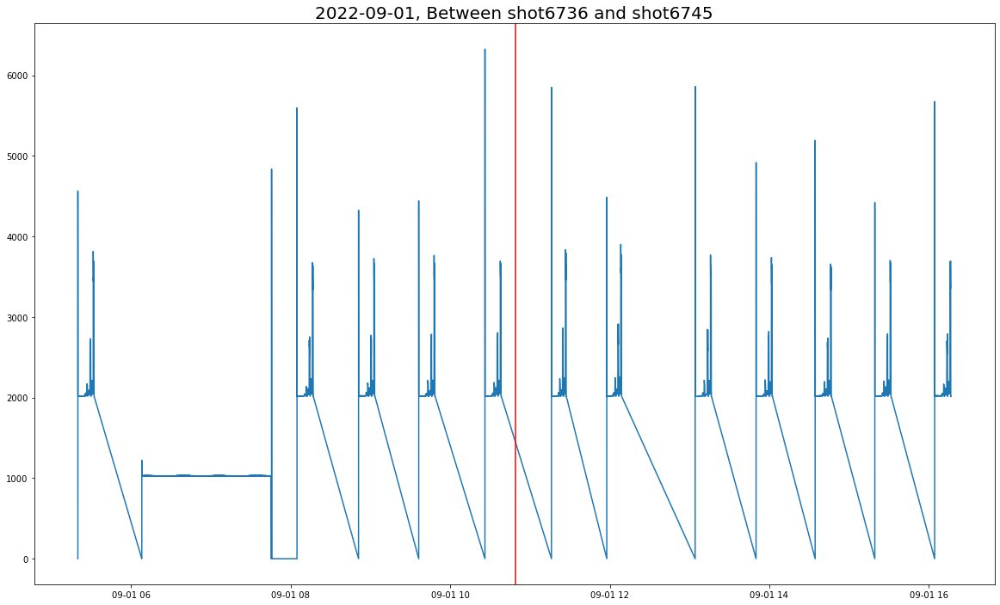

In [237]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6735) & (tool_1['shot_no'] < 6746)]['current_spindle'])
plt.axvline('2022-09-01 10:49:00', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-09-01, Between shot6736 and shot6745', fontsize = 20)

#  09-02

In [238]:
tool_1[(tool_1['date'] == '2022-09-02') & ((tool_1['hour'] == '13') | (tool_1['hour'] == '14'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-02 13:01:48,2022-09-02,13,1,48,100.0,6766,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,cancel
2022-09-02 13:01:49,2022-09-02,13,1,49,100.0,6766,0.0,2.6,0.0,0.000000,9600.0,0.000000,1.0,cancel
2022-09-02 13:01:50,2022-09-02,13,1,50,100.0,6766,0.0,2.6,0.0,0.000000,2400.0,0.000000,1.0,cancel
2022-09-02 13:01:51,2022-09-02,13,1,51,101.0,6766,4.0,5.5,2720.0,83.500000,0.0,149.750000,1.0,operation
2022-09-02 13:01:52,2022-09-02,13,1,52,101.0,6766,265.6,650.8,4868.6,288.000000,4414.2,33.200000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-02 14:44:18,2022-09-02,14,44,18,101.0,6767,209.8,1432.6,2018.2,299.400000,3828.4,0.400000,1.0,operation
2022-09-02 14:44:19,2022-09-02,14,44,19,101.0,6767,487.4,1478.6,2017.2,299.200000,7071.0,0.200000,1.0,operation
2022-09-02 14:44:20,2022-09-02,14,44,20,101.0,6767,301.8,1463.4,2015.6,299.600000,5828.4,0.400000,1.0,operation


In [239]:
tool_1[tool_1['shot_no'] == 6766]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-02 13:01:48,2022-09-02,13,1,48,100.0,6766,0.0,2.0,0.0,0.0,0.0,0.00,1.0,cancel
2022-09-02 13:01:49,2022-09-02,13,1,49,100.0,6766,0.0,2.6,0.0,0.0,9600.0,0.00,1.0,cancel
2022-09-02 13:01:50,2022-09-02,13,1,50,100.0,6766,0.0,2.6,0.0,0.0,2400.0,0.00,1.0,cancel
2022-09-02 13:01:51,2022-09-02,13,1,51,101.0,6766,4.0,5.5,2720.0,83.5,0.0,149.75,1.0,operation
2022-09-02 13:01:52,2022-09-02,13,1,52,101.0,6766,265.6,650.8,4868.6,288.0,4414.2,33.20,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-02 13:14:01,2022-09-02,13,14,1,101.0,6766,231.6,1481.4,2016.8,299.4,4818.2,0.60,1.0,operation
2022-09-02 13:14:02,2022-09-02,13,14,2,101.0,6766,502.2,1483.0,2018.0,299.4,7071.0,0.80,1.0,operation
2022-09-02 13:14:03,2022-09-02,13,14,3,101.0,6766,350.2,1465.6,2018.0,299.2,6242.6,0.80,1.0,operation


In [240]:
tool_1[tool_1['shot_no'] == 6767]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-02 13:47:40,2022-09-02,13,47,40,100.0,6767,0.00,2.000000,0.0,0.000000,0.0,0.000000,1.0,cancel
2022-09-02 13:47:41,2022-09-02,13,47,41,100.0,6767,0.00,3.600000,0.0,0.000000,9600.0,0.000000,1.0,cancel
2022-09-02 13:47:42,2022-09-02,13,47,42,100.0,6767,0.00,3.333333,0.0,0.000000,0.0,0.000000,1.0,cancel
2022-09-02 13:47:42,2022-09-02,13,47,42,101.0,6767,0.00,2.000000,619.5,0.000000,0.0,39.000000,1.0,operation
2022-09-02 13:47:43,2022-09-02,13,47,43,101.0,6767,6.75,6.500000,3515.0,118.750000,0.0,146.750000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-02 14:44:18,2022-09-02,14,44,18,101.0,6767,209.80,1432.600000,2018.2,299.400000,3828.4,0.400000,1.0,operation
2022-09-02 14:44:19,2022-09-02,14,44,19,101.0,6767,487.40,1478.600000,2017.2,299.200000,7071.0,0.200000,1.0,operation
2022-09-02 14:44:20,2022-09-02,14,44,20,101.0,6767,301.80,1463.400000,2015.6,299.600000,5828.4,0.400000,1.0,operation


In [241]:
tool_1[tool_1['shot_no'] == 6768]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-02 15:18:46,2022-09-02,15,18,46,100.0,6768,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-09-02 15:18:47,2022-09-02,15,18,47,100.0,6768,0.0,3.2,0.0,0.0,12000.0,0.0,1.0,cancel
2022-09-02 15:18:48,2022-09-02,15,18,48,100.0,6768,0.0,2.0,221.0,0.0,0.0,0.0,1.0,cancel
2022-09-02 15:18:48,2022-09-02,15,18,48,101.0,6768,0.0,2.0,663.0,31.5,0.0,151.5,1.0,operation
2022-09-02 15:18:49,2022-09-02,15,18,49,101.0,6768,223.0,156.8,6026.6,213.4,2414.2,104.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-02 15:30:59,2022-09-02,15,30,59,101.0,6768,365.8,1555.0,2021.4,299.6,6242.6,0.4,1.0,operation
2022-09-02 15:31:00,2022-09-02,15,31,0,101.0,6768,451.4,1462.6,2023.6,299.4,7071.0,0.4,1.0,operation
2022-09-02 15:31:01,2022-09-02,15,31,1,101.0,6768,251.4,1462.0,2023.0,299.0,5414.2,0.6,1.0,operation


Text(0.5, 1.0, '2022-09-02, Between shot6736 and shot6745')

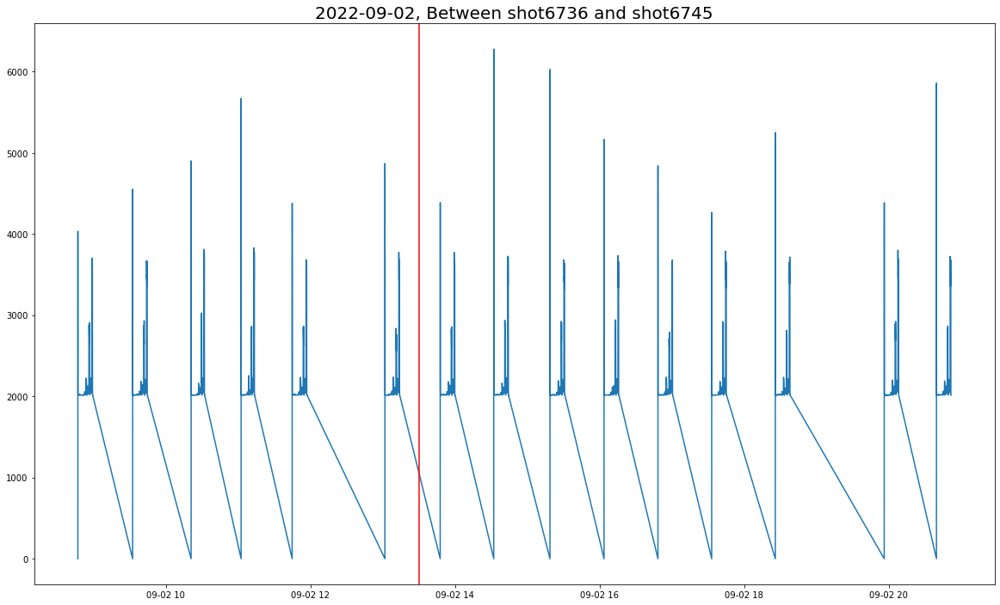

In [242]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6761) & (tool_1['shot_no'] < 6774)]['current_spindle'])
plt.axvline('2022-09-02 13:30:00', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-09-02, Between shot6736 and shot6745', fontsize = 20)

#  09-03

In [243]:
tool_1[(tool_1['date'] == '2022-09-03') & ((tool_1['hour'] == '9') | (tool_1['hour'] == '10'))]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 09:30:57,2022-09-03,9,30,57,100.0,6786,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-09-03 09:30:58,2022-09-03,9,30,58,100.0,6786,0.0,2.8,0.0,0.0,7200.0,0.0,1.0,cancel
2022-09-03 09:30:59,2022-09-03,9,30,59,100.0,6786,0.0,4.0,0.0,0.0,6000.0,0.0,1.0,cancel
2022-09-03 09:30:59,2022-09-03,9,30,59,101.0,6786,0.0,2.0,0.0,0.0,0.0,46.0,1.0,operation
2022-09-03 09:31:00,2022-09-03,9,31,0,101.0,6786,1.2,5.4,2548.0,90.4,0.0,130.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 10:59:55,2022-09-03,10,59,55,101.0,6786,29.4,2.0,2017.6,299.0,75.0,1.0,1.0,operation
2022-09-03 10:59:56,2022-09-03,10,59,56,101.0,6786,30.2,2.0,2017.0,299.4,75.0,0.2,1.0,operation
2022-09-03 10:59:57,2022-09-03,10,59,57,101.0,6786,30.2,2.0,2017.4,299.2,75.0,0.6,1.0,operation


In [244]:
tool_1[tool_1['shot_no'] == 6785]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 08:46:00,2022-09-03,8,46,0,100.0,6785,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-09-03 08:46:01,2022-09-03,8,46,1,100.0,6785,0.0,2.4,0.0,0.0,4800.0,0.0,1.0,cancel
2022-09-03 08:46:02,2022-09-03,8,46,2,100.0,6785,0.0,4.0,0.0,0.0,7200.0,0.0,1.0,cancel
2022-09-03 08:46:03,2022-09-03,8,46,3,100.0,6785,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-09-03 08:46:03,2022-09-03,8,46,3,101.0,6785,2.0,2.0,1012.5,51.0,0.0,129.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 08:58:13,2022-09-03,8,58,13,101.0,6785,0.0,1457.2,2019.4,299.0,5000.0,0.6,1.0,operation
2022-09-03 08:58:14,2022-09-03,8,58,14,101.0,6785,692.4,1591.2,2019.2,299.4,7071.0,0.8,1.0,operation
2022-09-03 08:58:15,2022-09-03,8,58,15,101.0,6785,427.0,1459.4,2016.2,299.0,7071.0,0.6,1.0,operation


In [245]:
tool_1[tool_1['shot_no'] == 6786]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 09:30:57,2022-09-03,9,30,57,100.0,6786,0.0,2.0,0.0,0.0,0.0,0.0,1.0,cancel
2022-09-03 09:30:58,2022-09-03,9,30,58,100.0,6786,0.0,2.8,0.0,0.0,7200.0,0.0,1.0,cancel
2022-09-03 09:30:59,2022-09-03,9,30,59,100.0,6786,0.0,4.0,0.0,0.0,6000.0,0.0,1.0,cancel
2022-09-03 09:30:59,2022-09-03,9,30,59,101.0,6786,0.0,2.0,0.0,0.0,0.0,46.0,1.0,operation
2022-09-03 09:31:00,2022-09-03,9,31,0,101.0,6786,1.2,5.4,2548.0,90.4,0.0,130.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 11:11:43,2022-09-03,11,11,43,101.0,6786,304.8,1494.4,2022.0,299.2,4242.6,0.8,1.0,operation
2022-09-03 11:11:44,2022-09-03,11,11,44,101.0,6786,452.0,1460.4,2021.0,299.4,7071.0,0.8,1.0,operation
2022-09-03 11:11:45,2022-09-03,11,11,45,101.0,6786,276.2,1460.0,2020.6,299.6,5414.2,0.6,1.0,operation


In [246]:
tool_1[tool_1['shot_no'] == 6787]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 11:44:38,2022-09-03,11,44,38,100.0,6787,0.0,2.00,0.0,0.0,0.000000,0.0,1.0,cancel
2022-09-03 11:44:39,2022-09-03,11,44,39,100.0,6787,0.0,2.60,0.0,0.0,7200.000000,0.0,1.0,cancel
2022-09-03 11:44:40,2022-09-03,11,44,40,100.0,6787,0.0,2.75,0.0,0.0,3000.000000,0.0,1.0,cancel
2022-09-03 11:44:40,2022-09-03,11,44,40,101.0,6787,0.0,2.00,357.0,0.0,0.000000,101.0,1.0,operation
2022-09-03 11:44:41,2022-09-03,11,44,41,101.0,6787,4.8,5.60,2180.4,131.0,0.000000,141.0,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 11:56:51,2022-09-03,11,56,51,101.0,6787,208.5,1434.00,2014.0,299.5,4023.666667,0.5,1.0,operation
2022-09-03 11:56:52,2022-09-03,11,56,52,101.0,6787,453.6,1461.60,2017.0,299.2,7071.000000,0.8,1.0,operation
2022-09-03 11:56:53,2022-09-03,11,56,53,101.0,6787,262.6,1460.40,2017.0,299.8,5828.400000,0.2,1.0,operation


Text(0.5, 1.0, '2022-09-03, Between shot6782 and shot6792')

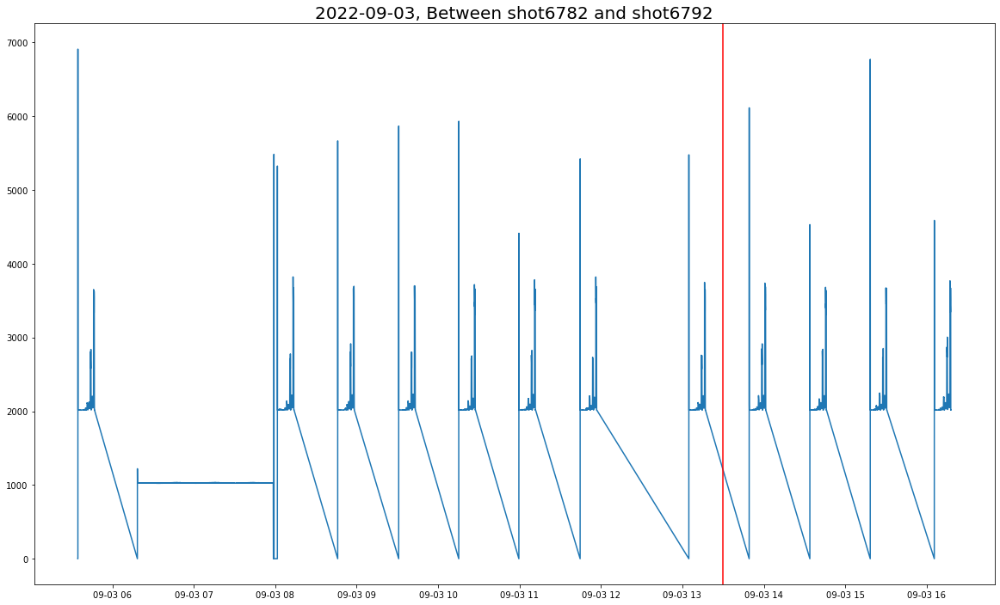

In [247]:
plt.figure(figsize = (20, 12))
plt.plot(tool_1[(tool_1['shot_no'] > 6781) & (tool_1['shot_no'] < 6793)]['current_spindle'])
plt.axvline('2022-09-03 13:30:00', color = 'red', label = 'tool_change1', linestyle = 'solid')
plt.title('2022-09-03, Between shot6782 and shot6792', fontsize = 20)

1. 교체이력에 따른 shot 정보 도출 결과
- 2022-08-16에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-16  1:29:18 PM, shot6393 후 -> 교체시간 13:14:05 ~ 13:46:09으로 추정
- 2022-08-17에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-17  8:18:57 AM, shot6412 후 -> 교체시간 08:19:49 ~ 08:52:07으로 추정
- 2022-08-18에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-18  8:27:36 AM, shot6436 후 -> 교체시간 08:20:27 ~ 08:53:34으로 추정
- 2022-08-19에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-19  9:02:46 AM, shot6460 후 -> 교체시간 08:18:13 ~ 08:54:00으로 추정
- 2022-08-20에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-20  9:24:40 AM, shot6481 후 -> 교체시간 08:20:23 ~ 08:52:59으로 추정
- 2022-08-21에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-21  2:24:03 PM, shot6513 후 -> 교체시간 14:09:20 ~ 14:41:27으로 추정
- 2022-08-28에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-28  6:48:35 PM, shot6667이 2022-08-28 14:51:09 ~ 2022-08-29 08:20:39까지 설정되어 있음, shot6667 교체 해당시점에 값이 존재하고 있음
- 2022-08-29에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-29  5:50:00 PM, shot6676 후 -> 교체시간 17:54:27 ~ 18:28:11으로 추정, 생산시간이 단12분
- 2022-08-30에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-30  9:52:18 AM
- 2022-08-31에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-08-31  7:07:39 PM
- 2022-09-01에 Tool1, Tool5, Tool9 황삭팁 교환, 교환시점 : 2022-09-01  10:49:24 AM

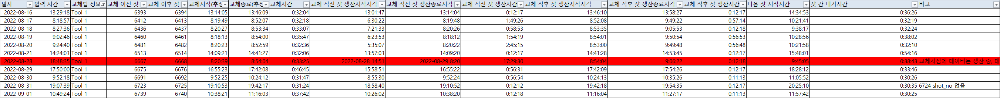

In [248]:
tool_1_all = tool_1[tool_1['shot_no'] > 6393]
tool_1_all = tool_1_all[tool_1_all['state'] == 'operation']
tool_1_all.reset_index(inplace = True)

In [249]:
tool_1_all.head()

,datetime,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
0,2022-08-16 13:46:12,2022-08-16,13,46,12,101.0,6394,0.0,2.0,0.0,5.0,0.0,156.0,1.0,operation
1,2022-08-16 13:46:13,2022-08-16,13,46,13,101.0,6394,20.4,14.8,4296.4,192.4,1414.2,108.0,1.0,operation
2,2022-08-16 13:46:14,2022-08-16,13,46,14,101.0,6394,77.8,809.8,4107.0,299.6,5000.0,1.6,1.0,operation
3,2022-08-16 13:46:15,2022-08-16,13,46,15,101.0,6394,4.2,1013.4,2268.4,299.4,5000.0,0.4,1.0,operation
4,2022-08-16 13:46:16,2022-08-16,13,46,16,101.0,6394,0.4,1016.0,2055.8,299.0,5000.0,0.2,1.0,operation


In [250]:
# 데이터 스케일링
tool_1_all_info = tool_1_all.loc[:, ['datetime', 'date','hour', 'minute', 'second', 'tool_number', 'shot_no', 'tool', 'state']]
tool_1_value = tool_1_all.iloc[:, 7:-2]

from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

tool_1_t_stds = pd.DataFrame(StandardScaler().fit_transform(tool_1_value), columns = tool_1_value.columns)
tool_1_stds = pd.concat([tool_1_all_info, tool_1_t_stds], axis = 1)
tool_1_t_robust = pd.DataFrame(RobustScaler().fit_transform(tool_1_value), columns = tool_1_value.columns)
tool_1_robust = pd.concat([tool_1_all_info, tool_1_t_robust], axis = 1)
tool_1_t_minmax = pd.DataFrame(MinMaxScaler().fit_transform(tool_1_value), columns = tool_1_value.columns)
tool_1_minmax = pd.concat([tool_1_all_info, tool_1_t_minmax], axis = 1)
tool_1_stds

,datetime,date,hour,minute,second,tool_number,shot_no,tool,state,current_x,current_z,current_spindle,rpm,feed,load_1
0,2022-08-16 13:46:12,2022-08-16,13,46,12,101.0,6394,1.0,operation,-0.434818,-0.113025,-1.825071,-1.025775,-0.146199,34.803699
1,2022-08-16 13:46:13,2022-08-16,13,46,13,101.0,6394,1.0,operation,0.053280,-0.003769,3.556796,0.375038,2.016867,24.027736
2,2022-08-16 13:46:14,2022-08-16,13,46,14,101.0,6394,1.0,operation,1.426655,6.782084,3.319545,1.176357,7.501468,0.141016
3,2022-08-16 13:46:15,2022-08-16,13,46,15,101.0,6394,1.0,operation,-0.334327,8.519945,1.016431,1.174862,7.501468,-0.128383
4,2022-08-16 13:46:16,2022-08-16,13,46,16,101.0,6394,1.0,operation,-0.425248,8.542138,0.750118,1.171872,7.501468,-0.173282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
719128,2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800,1.0,operation,0.263832,-0.113025,0.743104,1.174862,-0.031484,-0.128383
719129,2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800,1.0,operation,0.254262,-0.113025,0.700764,1.173367,-0.031484,-0.128383
719130,2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800,1.0,operation,0.220765,10.344870,0.697758,1.174862,18.231144,-0.128383
719131,2022-09-03 22:55:27,2022-09-03,22,55,27,101.0,6800,1.0,operation,12.346657,17.378257,0.697758,1.171872,22.788235,-0.128383


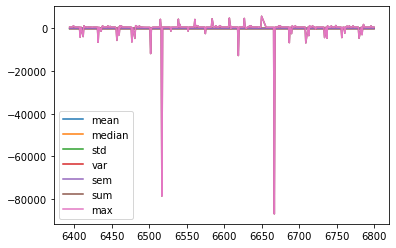

In [251]:
plt.plot(tool_1_stds.groupby('shot_no').mean()['current_spindle'], label = 'mean')
plt.plot(tool_1_stds.groupby('shot_no').median()['current_spindle'], label = 'median')
plt.plot(tool_1_stds.groupby('shot_no').std()['current_spindle'], label = 'std')
plt.plot(tool_1_stds.groupby('shot_no').var()['current_spindle'], label = 'var')
plt.plot(tool_1_stds.groupby('shot_no').sem()['current_spindle'], label = 'sem')
plt.plot(tool_1_stds.groupby('shot_no').sum()['current_spindle'], label = 'sum')
plt.plot(tool_1_stds.groupby('shot_no').sum()['current_spindle'], label = 'max')
plt.legend()

<AxesSubplot:xlabel='shot_no'>

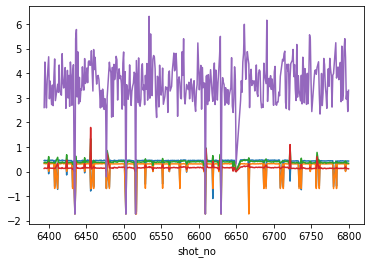

In [252]:
tool_1_robust.groupby('shot_no').mean()['current_spindle'].plot()
tool_1_robust.groupby('shot_no').median()['current_spindle'].plot()
tool_1_robust.groupby('shot_no').std()['current_spindle'].plot()
tool_1_robust.groupby('shot_no').var()['current_spindle'].plot()
tool_1_robust.groupby('shot_no').max()['current_spindle'].plot()

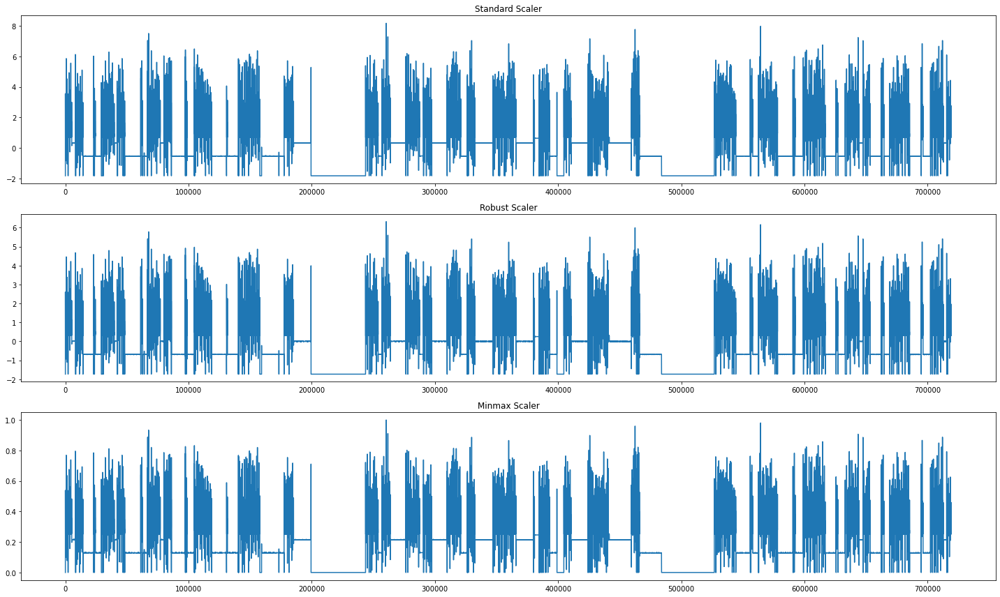

In [253]:
fig = plt.figure(figsize = (20,12))
ax1 = fig.add_subplot(3,1,1)
ax1.plot(tool_1_stds['current_spindle'])
ax1.set_title('Standard Scaler')

ax2 = fig.add_subplot(3,1,2)
ax2.plot(tool_1_robust['current_spindle'])
ax2.set_title('Robust Scaler')

ax3 = fig.add_subplot(3,1,3)
ax3.plot(tool_1_minmax['current_spindle'])
ax3.set_title('Minmax Scaler')

fig.tight_layout()

In [254]:
# shot_no 기준 spindle 대표값 조정
tool1_shot_mean = tool_1_all.groupby('shot_no').mean()['current_spindle'].to_frame('mean')
tool1_shot_std = tool_1_all.groupby('shot_no').std()['current_spindle'].to_frame('std_deviation')
temp_shot = pd.concat([tool1_shot_mean, tool1_shot_std], axis = 1)
tool1_shot_median = tool_1_all.groupby('shot_no').median()['current_spindle'].to_frame('median')
temp_shot2 = pd.concat([temp_shot, tool1_shot_median], axis = 1)
tool1_shot_var = tool_1_all.groupby('shot_no').var()['current_spindle'].to_frame('variation')
tool1_stat_shot = pd.concat([temp_shot2, tool1_shot_var], axis = 1)
tool1_stat_shot

,mean,std_deviation,median,variation
shot_no,,,,
6394,2156.443546,353.257617,2037.0,124790.943949
6395,2170.110054,380.044392,2037.0,144433.739692
6396,2153.624275,366.318521,2026.4,134189.258847
6397,2152.305503,349.877106,2034.0,122413.989032
6398,2164.046531,369.680976,2032.2,136664.024241
...,...,...,...,...
6796,1742.712855,430.001266,1716.0,184901.088801
6797,2133.817798,339.974363,2023.7,115582.567641
6798,2138.965210,346.296170,2020.8,119921.037183


In [255]:
tool1_stat_shot.columns

Index(['mean', 'std_deviation', 'median', 'variation'], dtype='object')

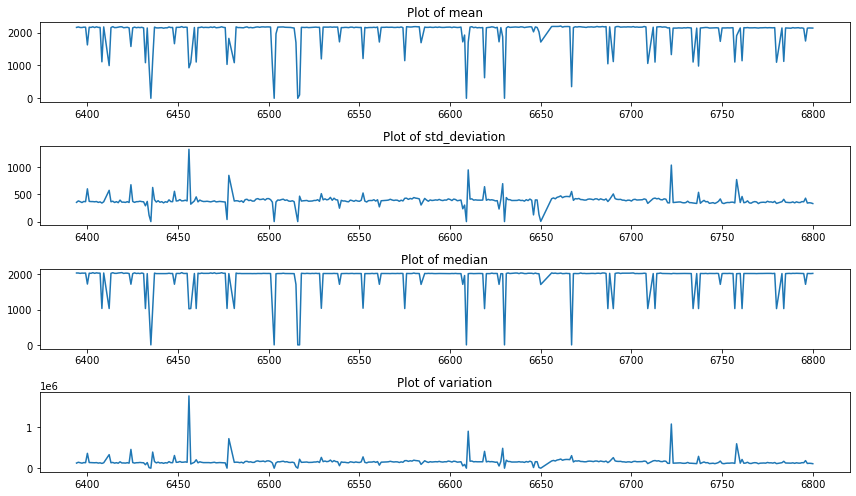

In [256]:
stat_list = list(tool1_stat_shot.columns)

fig = plt.figure(figsize = (12, 7))

for idx in range(len(stat_list)):
    globals()['ax_{}'.format(idx)] = fig.add_subplot(len(stat_list),1,idx+1)
    globals()['ax_{}'.format(idx)].plot(tool1_stat_shot[stat_list[idx]])
    globals()['ax_{}'.format(idx)].set_title('Plot of {}'.format(stat_list[idx]))
fig.tight_layout()

In [257]:
tool_1_std_raw = pd.concat([tool_1_all_info, tool_1_stds], axis = 1)
tool_1_robust_raw = pd.concat([tool_1_all_info, tool_1_robust], axis = 1)
tool_1_minmax_raw = pd.concat([tool_1_all_info, tool_1_minmax], axis = 1)

In [258]:
tool_1_std_raw

,datetime,date,hour,minute,second,tool_number,shot_no,tool,state,datetime,date,hour,minute,second,tool_number,shot_no,tool,state,current_x,current_z,current_spindle,rpm,feed,load_1
0,2022-08-16 13:46:12,2022-08-16,13,46,12,101.0,6394,1.0,operation,2022-08-16 13:46:12,2022-08-16,13,46,12,101.0,6394,1.0,operation,-0.434818,-0.113025,-1.825071,-1.025775,-0.146199,34.803699
1,2022-08-16 13:46:13,2022-08-16,13,46,13,101.0,6394,1.0,operation,2022-08-16 13:46:13,2022-08-16,13,46,13,101.0,6394,1.0,operation,0.053280,-0.003769,3.556796,0.375038,2.016867,24.027736
2,2022-08-16 13:46:14,2022-08-16,13,46,14,101.0,6394,1.0,operation,2022-08-16 13:46:14,2022-08-16,13,46,14,101.0,6394,1.0,operation,1.426655,6.782084,3.319545,1.176357,7.501468,0.141016
3,2022-08-16 13:46:15,2022-08-16,13,46,15,101.0,6394,1.0,operation,2022-08-16 13:46:15,2022-08-16,13,46,15,101.0,6394,1.0,operation,-0.334327,8.519945,1.016431,1.174862,7.501468,-0.128383
4,2022-08-16 13:46:16,2022-08-16,13,46,16,101.0,6394,1.0,operation,2022-08-16 13:46:16,2022-08-16,13,46,16,101.0,6394,1.0,operation,-0.425248,8.542138,0.750118,1.171872,7.501468,-0.173282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
719128,2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800,1.0,operation,2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800,1.0,operation,0.263832,-0.113025,0.743104,1.174862,-0.031484,-0.128383
719129,2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800,1.0,operation,2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800,1.0,operation,0.254262,-0.113025,0.700764,1.173367,-0.031484,-0.128383
719130,2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800,1.0,operation,2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800,1.0,operation,0.220765,10.344870,0.697758,1.174862,18.231144,-0.128383
719131,2022-09-03 22:55:27,2022-09-03,22,55,27,101.0,6800,1.0,operation,2022-09-03 22:55:27,2022-09-03,22,55,27,101.0,6800,1.0,operation,12.346657,17.378257,0.697758,1.171872,22.788235,-0.128383


# 2. Tool5 EDA

In [259]:
tool_5.head()

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 09:08:31,2022-08-03,9,8,31,500.0,6218,0.00,185.666667,2016.333333,299.0,0.0,1.0,5.0,cancel
2022-08-03 09:08:32,2022-08-03,9,8,32,500.0,6218,0.00,7.600000,2016.400000,299.0,7200.0,0.8,5.0,cancel
2022-08-03 09:08:33,2022-08-03,9,8,33,500.0,6218,3.75,5.000000,2016.000000,300.0,0.0,0.0,5.0,cancel
2022-08-03 09:08:33,2022-08-03,9,8,33,505.0,6218,5.00,4.000000,2016.000000,300.0,0.0,1.0,5.0,operation
2022-08-03 09:08:34,2022-08-03,9,8,34,505.0,6218,345.80,534.000000,2018.000000,299.4,5656.8,1.0,5.0,operation


In [260]:
tool_5_mod1 = tool_5.reset_index()

In [261]:
# 분 단위로 변환
tool_5_mod1 = tool_5.reset_index()

tool_5_mod1 = tool_5.groupby(['date', 'hour', 'minute']).mean()['current_spindle']
tool_5_mod1 = tool_5_mod1.reset_index()
tool_5_mod1['date'] = tool_5_mod1['date'].astype('str')
tool_5_mod1['hour'] = tool_5_mod1['hour'].astype('str')
tool_5_mod1['minute'] = tool_5_mod1['minute'].astype('str')
tool_5_mod1['datetime'] = tool_5_mod1['date'] + ' ' + tool_5_mod1['hour']+ ':' + tool_5_mod1['minute']
tool_5_mod1['datetime'] = pd.to_datetime(tool_5_mod1['datetime'])
tool_5_mod1 = tool_5_mod1.set_index('datetime')
tool_5_mod1

,date,hour,minute,current_spindle
datetime,,,,
2022-08-03 10:00:00,2022-08-03,10,0,2371.490909
2022-08-03 10:37:00,2022-08-03,10,37,2017.745833
2022-08-03 10:38:00,2022-08-03,10,38,2668.557222
2022-08-03 10:39:00,2022-08-03,10,39,3507.560000
2022-08-03 10:40:00,2022-08-03,10,40,2203.775833
...,...,...,...,...
2022-09-03 09:49:00,2022-09-03,9,49,2353.047222
2022-09-03 09:05:00,2022-09-03,9,5,2426.383333
2022-09-03 09:50:00,2022-09-03,9,50,2424.403333


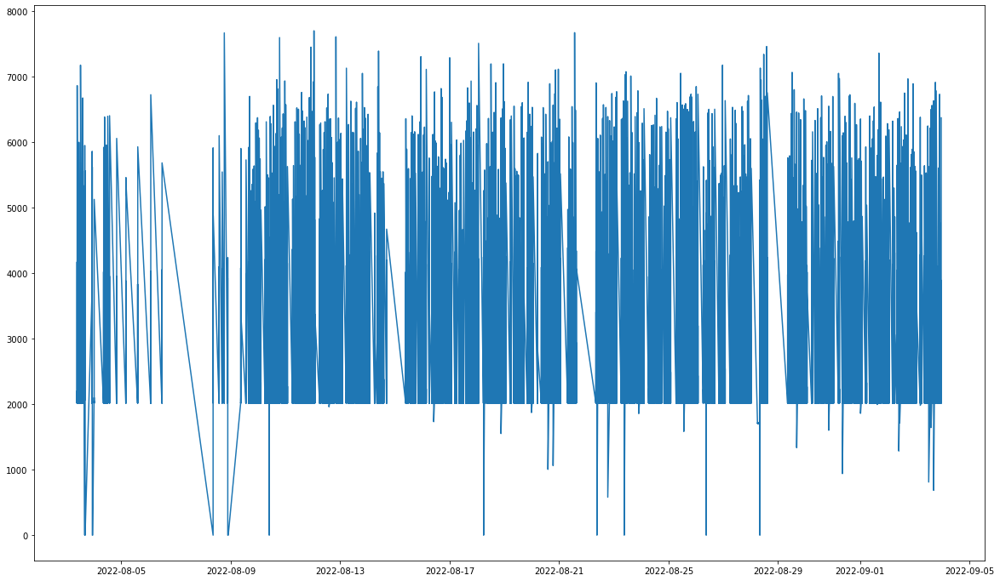

In [262]:
# 초 단위의 스핀들 전류값 시각화
plt.figure(figsize = (20,12))
plt.plot(tool_5['current_spindle'])

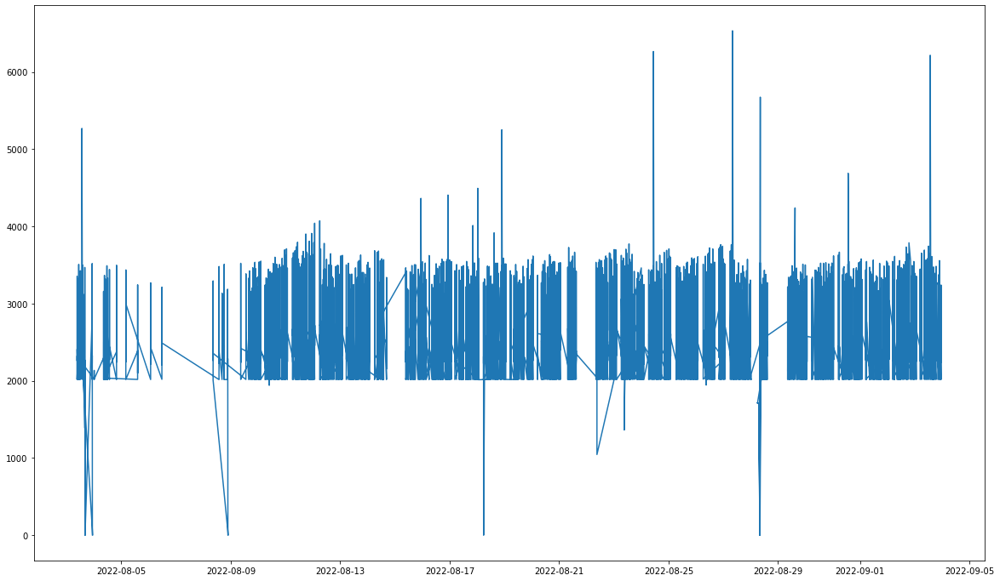

In [263]:
# 분 단위 스핀들 전류값 시각화
plt.figure(figsize=(20,12))
plt.plot(tool_5_mod1['current_spindle'])

In [264]:
tool5_mean = pd.Series(tool_5.groupby('shot_no').mean()['current_spindle'], name = 'mean')
tool5_sum = pd.Series(tool_5.groupby('shot_no').sum()['current_spindle'], name = 'sum')
tool5_std = pd.Series(tool_5.groupby('shot_no').std()['current_spindle'], name = 'std')
tool5_sem = pd.Series(tool_5.groupby('shot_no').sem()['current_spindle'], name = 'sem')
tool5_median = pd.Series(tool_5.groupby('shot_no').median()['current_spindle'], name = 'median')
tool5_var = pd.Series(tool_5.groupby('shot_no').var()['current_spindle'], name = 'var')
tool5_max = pd.Series(tool_5.groupby('shot_no').max()['current_spindle'], name = 'max')
tool5_temp = [tool5_mean, tool5_sum, tool5_std, tool5_sem, tool5_median, tool5_var, tool5_max]
tool5_stat = pd.Series()
for tool5_add in tool5_temp:
    tool5_stat = pd.concat([tool5_stat, tool5_add], axis = 1)
tool5_stat.drop(0, axis = 1, inplace = True)
tool5_stat

,mean,sum,std,sem,median,var,max
6218,2469.347424,1.086513e+06,584.020865,27.842102,2264.2,341080.370391,6865.50
6219,2420.054132,1.161626e+06,523.416834,23.890601,2237.7,273965.182075,5092.00
6220,2470.267806,1.084448e+06,570.575327,27.232075,2279.6,325556.203884,5999.60
6221,2467.666250,1.085773e+06,563.000599,26.840000,2265.8,316969.674263,4897.80
6222,2445.381328,1.178674e+06,565.311560,25.749236,2237.4,319577.159975,7178.00
...,...,...,...,...,...,...,...
6796,2459.200814,1.158284e+06,543.710434,25.052854,2257.8,295621.035563,4110.50
6797,2454.474699,1.156058e+06,545.565355,25.138325,2247.8,297641.556263,5607.75
6798,2468.622057,1.160252e+06,574.172757,26.484614,2252.6,329674.355246,6732.80
6799,2456.082874,1.159271e+06,540.853996,24.894823,2261.2,292523.045400,4762.20


In [265]:
tool5_stat 

,mean,sum,std,sem,median,var,max
6218,2469.347424,1.086513e+06,584.020865,27.842102,2264.2,341080.370391,6865.50
6219,2420.054132,1.161626e+06,523.416834,23.890601,2237.7,273965.182075,5092.00
6220,2470.267806,1.084448e+06,570.575327,27.232075,2279.6,325556.203884,5999.60
6221,2467.666250,1.085773e+06,563.000599,26.840000,2265.8,316969.674263,4897.80
6222,2445.381328,1.178674e+06,565.311560,25.749236,2237.4,319577.159975,7178.00
...,...,...,...,...,...,...,...
6796,2459.200814,1.158284e+06,543.710434,25.052854,2257.8,295621.035563,4110.50
6797,2454.474699,1.156058e+06,545.565355,25.138325,2247.8,297641.556263,5607.75
6798,2468.622057,1.160252e+06,574.172757,26.484614,2252.6,329674.355246,6732.80
6799,2456.082874,1.159271e+06,540.853996,24.894823,2261.2,292523.045400,4762.20


No handles with labels found to put in legend.


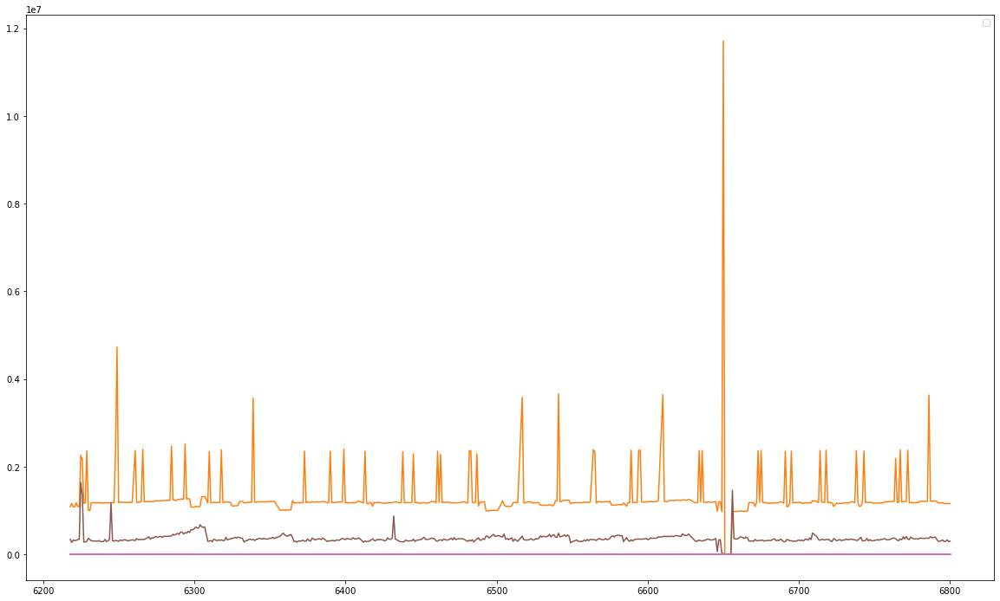

In [266]:
plt.figure(figsize=(20,12))
plt.plot(tool5_stat)
plt.legend()

# Tool5 scaling

In [267]:
# 기술통계 도출하기 전 scaling
tool5_stdS = pd.DataFrame(stdS.fit_transform(tool_1_mod_value), columns = tool_1_mod_value.columns)
tool5_stdS = pd.concat([tool_1_mod_info, tool5_stdS], axis = 1)
tool5_mmS = pd.DataFrame(mmS.fit_transform(tool_1_mod_value), columns = tool_1_mod_value.columns)
tool5_mmS = pd.concat([tool_1_mod_info, tool5_mmS], axis = 1)
tool5_rS = pd.DataFrame(rS.fit_transform(tool_1_mod_value), columns = tool_1_mod_value.columns)
tool5_rS = pd.concat([tool_1_mod_info, tool5_rS], axis = 1)
tool5_stdS

,datetime,date,hour,minute,second,tool_number,shot_no,tool,state,current_x,current_z,current_spindle,rpm,feed,load_1
0,2022-08-03 08:57:19,2022-08-03,8,57,19,100.0,6218,1.0,cancel,-0.458411,-0.118691,-1.878331,-1.110910,-0.158074,-0.222795
1,2022-08-03 08:57:20,2022-08-03,8,57,20,100.0,6218,1.0,cancel,-0.458411,-0.100341,-1.878331,-1.110910,17.418370,-0.222795
2,2022-08-03 08:57:21,2022-08-03,8,57,21,100.0,6218,1.0,cancel,-0.458411,-0.110535,-1.878331,-1.110910,-0.158074,-0.222795
3,2022-08-03 08:57:21,2022-08-03,8,57,21,101.0,6218,1.0,operation,-0.410085,-0.107816,-1.305201,-1.071223,-0.158074,25.183160
4,2022-08-03 08:57:22,2022-08-03,8,57,22,101.0,6218,1.0,operation,1.957898,0.112927,4.726631,0.154099,3.378014,21.284660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
983716,2022-09-03 22:55:24,2022-09-03,22,55,24,101.0,6800,1.0,operation,0.247151,-0.118691,0.694728,1.116994,-0.048221,-0.135189
983717,2022-09-03 22:55:25,2022-09-03,22,55,25,101.0,6800,1.0,operation,0.237486,-0.118691,0.652308,1.115505,-0.048221,-0.135189
983718,2022-09-03 22:55:26,2022-09-03,22,55,26,101.0,6800,1.0,operation,0.203658,9.873494,0.649296,1.116994,17.440340,-0.135189
983719,2022-09-03 22:55:27,2022-09-03,22,55,27,101.0,6800,1.0,operation,12.449513,16.593670,0.649296,1.114017,21.804278,-0.135189


# Tool5 교체시간 Shot 정보 탐색

In [268]:
tool_5.head()

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 09:08:31,2022-08-03,9,8,31,500.0,6218,0.00,185.666667,2016.333333,299.0,0.0,1.0,5.0,cancel
2022-08-03 09:08:32,2022-08-03,9,8,32,500.0,6218,0.00,7.600000,2016.400000,299.0,7200.0,0.8,5.0,cancel
2022-08-03 09:08:33,2022-08-03,9,8,33,500.0,6218,3.75,5.000000,2016.000000,300.0,0.0,0.0,5.0,cancel
2022-08-03 09:08:33,2022-08-03,9,8,33,505.0,6218,5.00,4.000000,2016.000000,300.0,0.0,1.0,5.0,operation
2022-08-03 09:08:34,2022-08-03,9,8,34,505.0,6218,345.80,534.000000,2018.000000,299.4,5656.8,1.0,5.0,operation


In [269]:
tool_5[tool_5.index < '2022-08-12 10:46:12']

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 09:08:31,2022-08-03,9,8,31,500.0,6218,0.00,185.666667,2016.333333,299.000000,0.0,1.000000,5.0,cancel
2022-08-03 09:08:32,2022-08-03,9,8,32,500.0,6218,0.00,7.600000,2016.400000,299.000000,7200.0,0.800000,5.0,cancel
2022-08-03 09:08:33,2022-08-03,9,8,33,500.0,6218,3.75,5.000000,2016.000000,300.000000,0.0,0.000000,5.0,cancel
2022-08-03 09:08:33,2022-08-03,9,8,33,505.0,6218,5.00,4.000000,2016.000000,300.000000,0.0,1.000000,5.0,operation
2022-08-03 09:08:34,2022-08-03,9,8,34,505.0,6218,345.80,534.000000,2018.000000,299.400000,5656.8,1.000000,5.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-12 10:37:02,2022-08-12,10,37,2,505.0,6311,452.80,1592.200000,2015.800000,299.400000,7071.0,0.600000,5.0,operation
2022-08-12 10:37:03,2022-08-12,10,37,3,505.0,6311,374.80,1457.800000,2015.200000,299.600000,7071.0,0.600000,5.0,operation
2022-08-12 10:37:04,2022-08-12,10,37,4,505.0,6311,342.60,1179.200000,2015.200000,299.000000,6229.4,0.800000,5.0,operation


In [270]:
tool_5[tool_5.index > '2022-08-23 06:34:07']

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-23 06:34:08,2022-08-23,6,34,8,505.0,6539,31.0,2.0,2343.6,299.00,60.0,5.20,5.0,operation
2022-08-23 06:34:09,2022-08-23,6,34,9,505.0,6539,31.8,2.0,2390.8,299.20,60.0,5.60,5.0,operation
2022-08-23 06:34:10,2022-08-23,6,34,10,505.0,6539,31.4,2.0,2397.2,299.80,60.0,5.40,5.0,operation
2022-08-23 06:34:11,2022-08-23,6,34,11,505.0,6539,31.2,2.0,2399.6,299.40,60.0,5.40,5.0,operation
2022-08-23 06:34:12,2022-08-23,6,34,12,505.0,6539,32.6,2.0,2401.2,299.00,60.0,5.00,5.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 23:03:13,2022-09-03,23,3,13,505.0,6800,15.2,92.8,2263.6,300.00,60.0,3.00,5.0,operation
2022-09-03 23:03:14,2022-09-03,23,3,14,505.0,6800,61.8,1222.8,2046.6,299.40,13739.6,1.20,5.0,operation
2022-09-03 23:03:15,2022-09-03,23,3,15,505.0,6800,810.6,2304.6,2018.2,299.40,16970.4,0.20,5.0,operation


In [271]:
tool_5[tool_5['shot_no'] == 6785]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 08:58:18,2022-09-03,8,58,18,500.0,6785,0.00,201.6,2015.8,299.00,0.0,0.40,5.0,cancel
2022-09-03 08:58:19,2022-09-03,8,58,19,500.0,6785,2.40,3.6,2015.2,299.40,7200.0,0.80,5.0,cancel
2022-09-03 08:58:20,2022-09-03,8,58,20,500.0,6785,6.00,4.0,2015.0,299.00,0.0,0.00,5.0,cancel
2022-09-03 08:58:20,2022-09-03,8,58,20,505.0,6785,116.25,2.0,2016.0,299.50,3535.5,0.75,5.0,operation
2022-09-03 08:58:21,2022-09-03,8,58,21,505.0,6785,426.80,973.4,2019.0,300.00,7071.0,0.60,5.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 09:06:13,2022-09-03,9,6,13,505.0,6785,536.60,1484.6,2018.0,299.40,7071.0,0.60,5.0,operation
2022-09-03 09:06:14,2022-09-03,9,6,14,505.0,6785,415.20,1457.6,2018.0,299.00,6665.6,0.80,5.0,operation
2022-09-03 09:06:15,2022-09-03,9,6,15,505.0,6785,399.80,351.6,2019.6,299.20,4008.8,0.80,5.0,operation


In [272]:
tool_5[tool_5['shot_no'] == 6786]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 09:43:14,2022-09-03,9,43,14,500.0,6786,0.0,1079.0,2019.0,299.0,0.00,1.0,5.0,cancel
2022-09-03 09:43:15,2022-09-03,9,43,15,500.0,6786,0.0,14.8,2018.0,299.2,4800.00,0.4,5.0,cancel
2022-09-03 09:43:16,2022-09-03,9,43,16,500.0,6786,3.6,4.8,2017.6,299.6,4800.00,0.6,5.0,cancel
2022-09-03 09:43:17,2022-09-03,9,43,17,500.0,6786,4.0,2.0,2017.0,299.0,0.00,1.0,5.0,cancel
2022-09-03 09:43:17,2022-09-03,9,43,17,505.0,6786,249.0,457.0,2019.5,299.5,5303.25,0.5,5.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 11:19:42,2022-09-03,11,19,42,505.0,6786,353.8,1442.6,2017.4,299.2,7071.00,0.8,5.0,operation
2022-09-03 11:19:43,2022-09-03,11,19,43,505.0,6786,425.8,1461.2,2017.0,299.2,7071.00,0.6,5.0,operation
2022-09-03 11:19:44,2022-09-03,11,19,44,505.0,6786,396.2,960.4,2017.0,299.0,5828.40,0.4,5.0,operation


In [273]:
tool_5[tool_5['shot_no'] == 6787]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 11:56:55,2022-09-03,11,56,55,500.0,6787,0.0,263.0,2017.0,299.0,0.0,0.666667,5.0,cancel
2022-09-03 11:56:56,2022-09-03,11,56,56,500.0,6787,0.0,5.2,2017.2,299.6,7200.0,0.800000,5.0,cancel
2022-09-03 11:56:57,2022-09-03,11,56,57,500.0,6787,4.5,3.5,2016.5,299.5,0.0,0.500000,5.0,cancel
2022-09-03 11:56:57,2022-09-03,11,56,57,505.0,6787,314.0,2.0,2016.0,299.0,3030.0,0.000000,5.0,operation
2022-09-03 11:56:58,2022-09-03,11,56,58,505.0,6787,382.4,660.2,2017.0,299.0,5454.6,0.600000,5.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 12:04:51,2022-09-03,12,4,51,505.0,6787,439.4,1462.6,2021.0,299.0,7071.0,0.400000,5.0,operation
2022-09-03 12:04:52,2022-09-03,12,4,52,505.0,6787,398.2,1249.8,2021.0,299.4,5828.4,0.400000,5.0,operation
2022-09-03 12:04:53,2022-09-03,12,4,53,505.0,6787,309.4,82.8,2020.4,299.6,3000.0,0.400000,5.0,operation


In [274]:
# tool5 교체시간 리스트화
tool5_change_list = pd.Series(['2022-08-03 09:30:12', '2022-08-12 10:46:12', '2022-08-16 13:29:18', '2022-08-17 08:18:57', '2022-08-18 08:27:36', '2022-08-19 09:02:46', '2022-08-20 09:24:40', '2022-08-21 14:24:03', '2022-08-23 18:34:07', '2022-08-28 18:48:35', '2022-08-29 5:50:00', '2022-08-30 09:52:18', '2022-08-31 19:07:39', '2022-09-01 10:49:24', '2022-09-02 13:30:39', '2022-09-03 09:49:45'], name = 'datetime')
tool5_change_shot = pd.Series([6218.5, 6312.5, 6393.5, 6412.5, 6436.5, 6460.5, 6481.5, 6513.5, 6538.5, 6667.5, 6675.5, 6691.5, 6723.5, 6739.5, 6766.5, 6785.5], name = 'shot_no')
tool5_state_list = []
for tool5_state_idx in range(0, len(change_list)):
    tool5_state_list.append('change')
tool5_state_list = pd.Series(state_list, name = 'state')
tool5_change_data = pd.concat([tool5_change_shot, tool5_state_list], axis = 1) # change_list
tool5_change_data = pd.concat([tool5_change_list, tool5_change_data], axis = 1)
tool5_change_data = tool5_change_data.set_index('datetime')
tool5_change_data

,shot_no,state
datetime,,
2022-08-03 09:30:12,6218.5,change
2022-08-12 10:46:12,6312.5,change
2022-08-16 13:29:18,6393.5,change
2022-08-17 08:18:57,6412.5,change
2022-08-18 08:27:36,6436.5,change
2022-08-19 09:02:46,6460.5,change
2022-08-20 09:24:40,6481.5,change
2022-08-21 14:24:03,6513.5,change
2022-08-23 18:34:07,6538.5,change


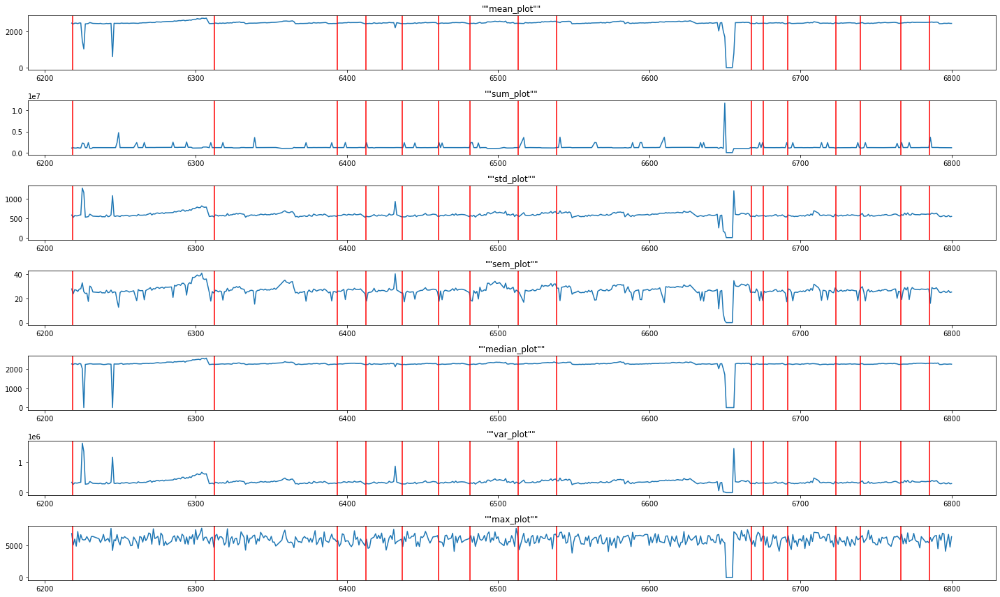

In [275]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool5_stat.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool5_stat.iloc[:,idx].name))
plt.tight_layout()

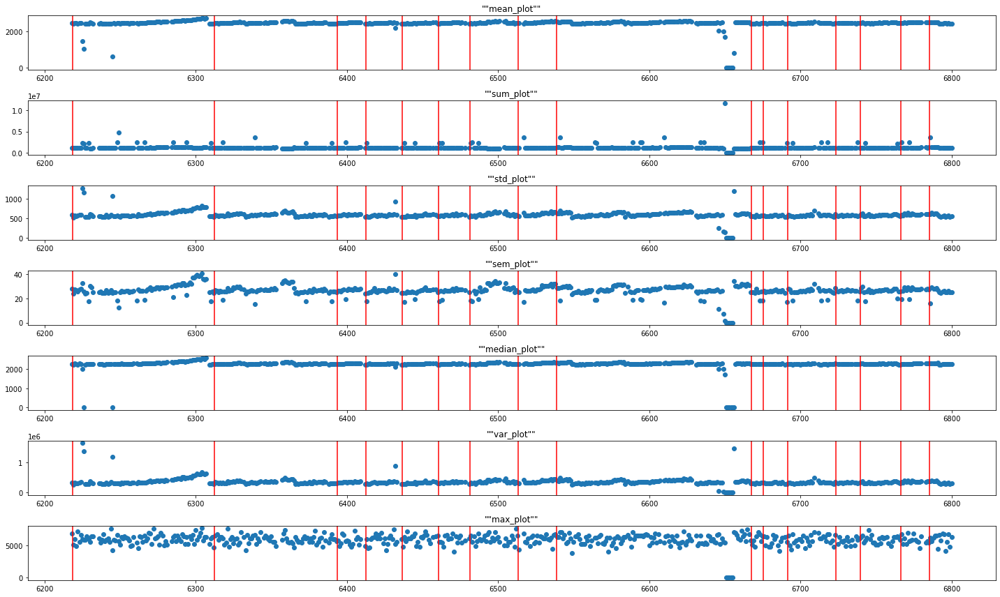

In [276]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool5_stat.index, tool5_stat.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool5_stat.iloc[:,idx].name))
plt.tight_layout()

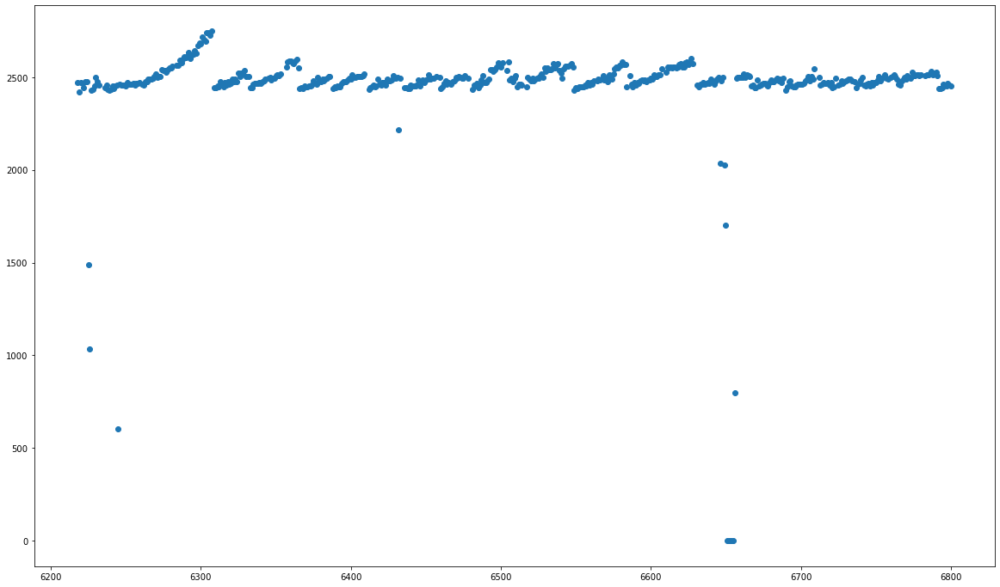

In [277]:
plt.figure(figsize=(20,12))
plt.scatter(tool5_stat.index, tool5_stat['mean'])

# Tool5 Scaler 후 통계값 도출

# (1) Standard scaler

In [278]:
# Standard Scaler 기술통계값 도출
tool5_stdS_mean = pd.Series(tool5_stdS.groupby('shot_no').mean()['current_spindle'], name = 'mean')
tool5_stdS_sum = pd.Series(tool5_stdS.groupby('shot_no').sum()['current_spindle'], name = 'sum')
tool5_stdS_std = pd.Series(tool5_stdS.groupby('shot_no').std()['current_spindle'], name = 'std')
tool5_stdS_sem = pd.Series(tool5_stdS.groupby('shot_no').sem()['current_spindle'], name = 'sem')
tool5_stdS_median = pd.Series(tool5_stdS.groupby('shot_no').median()['current_spindle'], name = 'median')
tool5_stdS_var = pd.Series(tool5_stdS.groupby('shot_no').var()['current_spindle'], name = 'var')
tool5_stdS_max = pd.Series(tool5_stdS.groupby('shot_no').max()['current_spindle'], name = 'max')
tool5_temp_stdS = [tool5_stdS_mean, tool5_stdS_sum, tool5_stdS_std, tool5_stdS_sem, tool5_stdS_median, tool5_stdS_var, tool5_stdS_max]
tool5_stdS_stat = pd.Series()
for add_stdS in tool5_temp_stdS:
    tool5_stdS_stat = pd.concat([tool5_stdS_stat, add_stdS], axis = 1)
tool5_stdS_stat.drop([0], axis = 1, inplace = True)
tool5_stdS_stat

,mean,sum,std,sem,median,var,max
6218,0.786334,529.988786,0.484681,0.018669,0.657077,0.234916,4.726631
6219,0.764682,565.099637,0.468181,0.017222,0.655257,0.219193,5.465842
6220,0.788983,531.774461,0.475670,0.018322,0.656261,0.226262,3.411864
6221,0.789600,531.400895,0.498304,0.019208,0.656826,0.248307,6.083567
6222,0.791300,584.771051,0.454792,0.016730,0.668874,0.206836,4.911120
...,...,...,...,...,...,...,...
6796,0.306328,1074.293039,0.544386,0.009193,0.275297,0.296356,6.054200
6797,0.788589,571.727111,0.459231,0.017055,0.661344,0.210893,3.939226
6798,0.791320,573.706876,0.476904,0.017712,0.657579,0.227438,4.322763
6799,0.787621,571.812544,0.472567,0.017539,0.657453,0.223320,3.312465


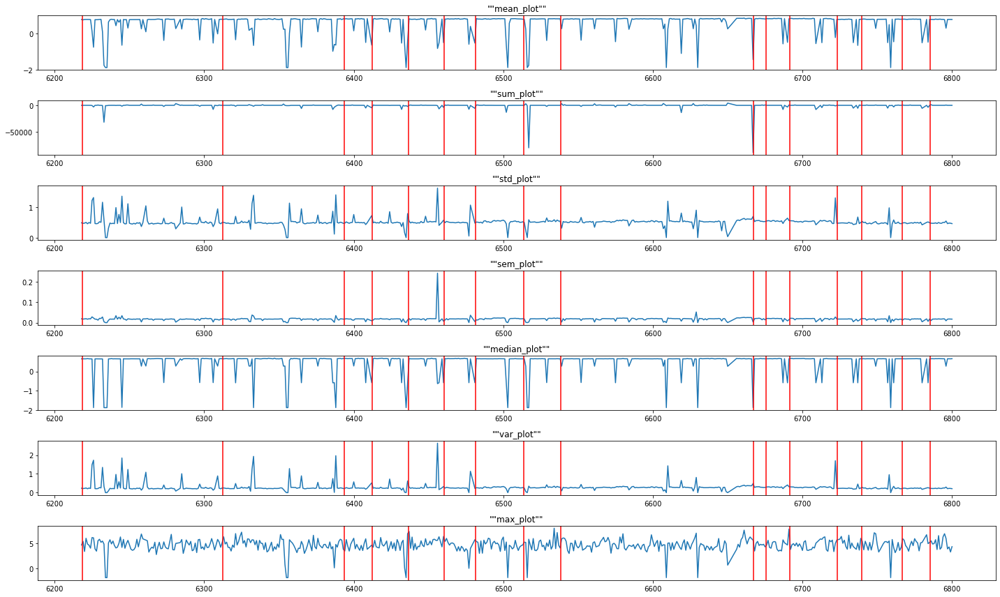

In [279]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp_stdS)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp_stdS),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool1_stdS_stat.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_stdS_stat.iloc[:,idx].name))
plt.tight_layout()

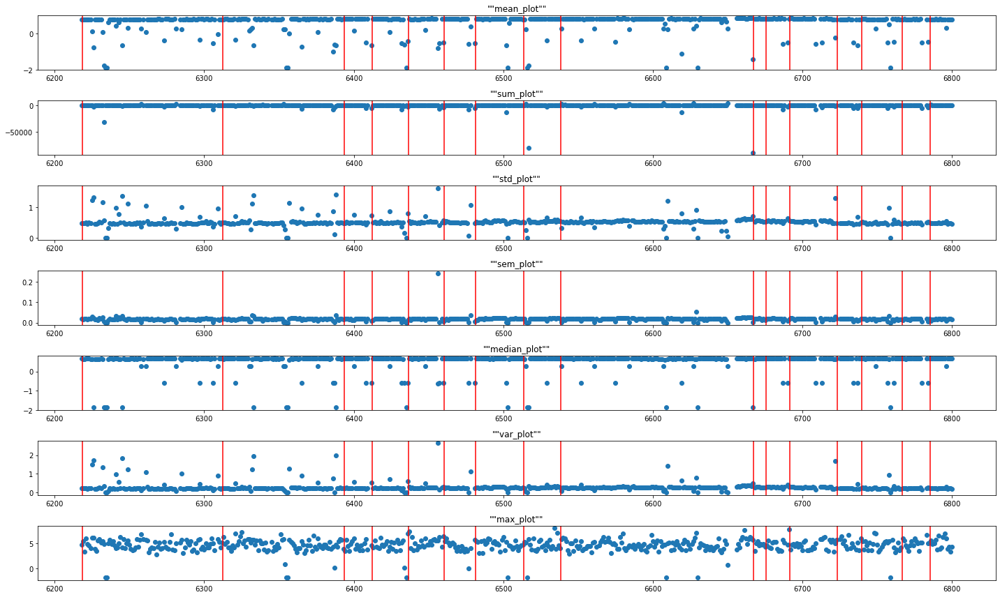

In [280]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp_stdS)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp_stdS),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool5_stdS_stat.index, tool5_stdS_stat.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool5_stdS_stat.iloc[:,idx].name))
plt.tight_layout()

# (2) Minmax scaler

In [281]:
# Minmax Scaler 기술통계값 도출
tool5_mmS_mean = pd.Series(tool5_mmS.groupby('shot_no').mean()['current_spindle'], name = 'mean')
tool5_mmS_sum = pd.Series(tool5_mmS.groupby('shot_no').sum()['current_spindle'], name = 'sum')
tool5_mmS_std = pd.Series(tool5_mmS.groupby('shot_no').std()['current_spindle'], name = 'std')
tool5_mmS_sem = pd.Series(tool5_mmS.groupby('shot_no').sem()['current_spindle'], name = 'sem')
tool5_mmS_median = pd.Series(tool5_mmS.groupby('shot_no').median()['current_spindle'], name = 'median')
tool5_mmS_var = pd.Series(tool5_mmS.groupby('shot_no').var()['current_spindle'], name = 'var')
tool5_mmS_max = pd.Series(tool5_mmS.groupby('shot_no').max()['current_spindle'], name = 'max')
tool5_temp_mmS = [tool5_mmS_mean, tool5_mmS_sum, tool5_mmS_std, tool5_mmS_sem, tool5_mmS_median, tool5_mmS_var, tool5_mmS_max]
tool5_mmS_stat = pd.Series()
for add_mmS in tool5_temp_mmS:
    tool5_mmS_stat = pd.concat([tool5_mmS_stat, add_mmS], axis = 1)
tool5_mmS_stat.drop([0], axis = 1, inplace = True)
tool5_mmS_stat

,mean,sum,std,sem,median,var,max
6218,0.266197,179.417089,0.048419,0.001865,0.253285,0.002344,0.659829
6219,0.264034,195.121456,0.046771,0.001720,0.253103,0.002188,0.733676
6220,0.266462,179.595476,0.047519,0.001830,0.253203,0.002258,0.528485
6221,0.266524,179.370514,0.049780,0.001919,0.253260,0.002478,0.795386
6222,0.266694,197.086612,0.045433,0.001671,0.254463,0.002064,0.678260
...,...,...,...,...,...,...,...
6796,0.218245,765.386551,0.054384,0.000918,0.215145,0.002958,0.792452
6797,0.266423,193.156526,0.045877,0.001704,0.253711,0.002105,0.581169
6798,0.266696,193.354302,0.047642,0.001769,0.253335,0.002270,0.619483
6799,0.266326,193.352704,0.047209,0.001752,0.253322,0.002229,0.518556


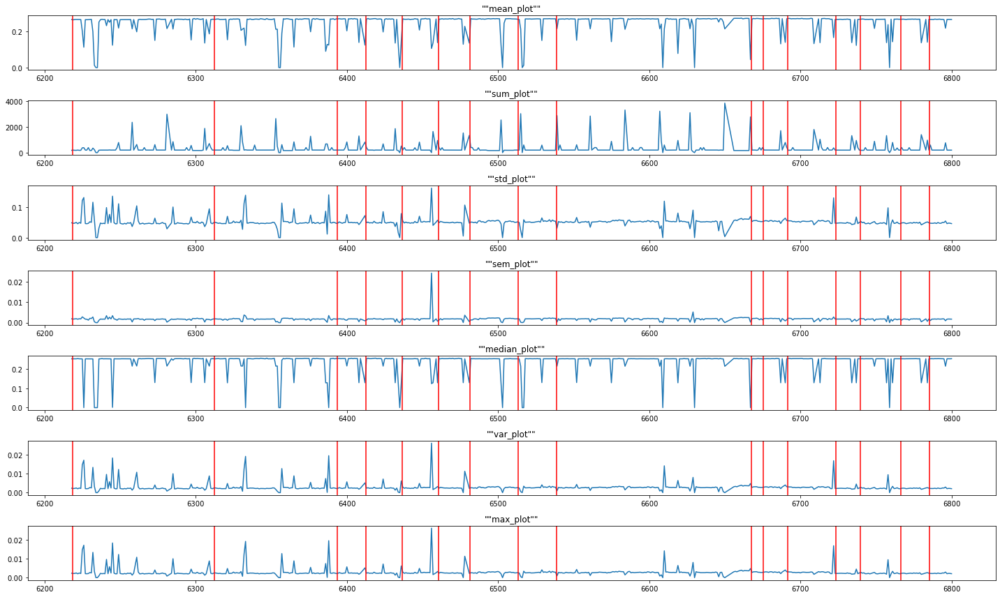

In [282]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp_mmS)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp_mmS),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool1_mmS_stat.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

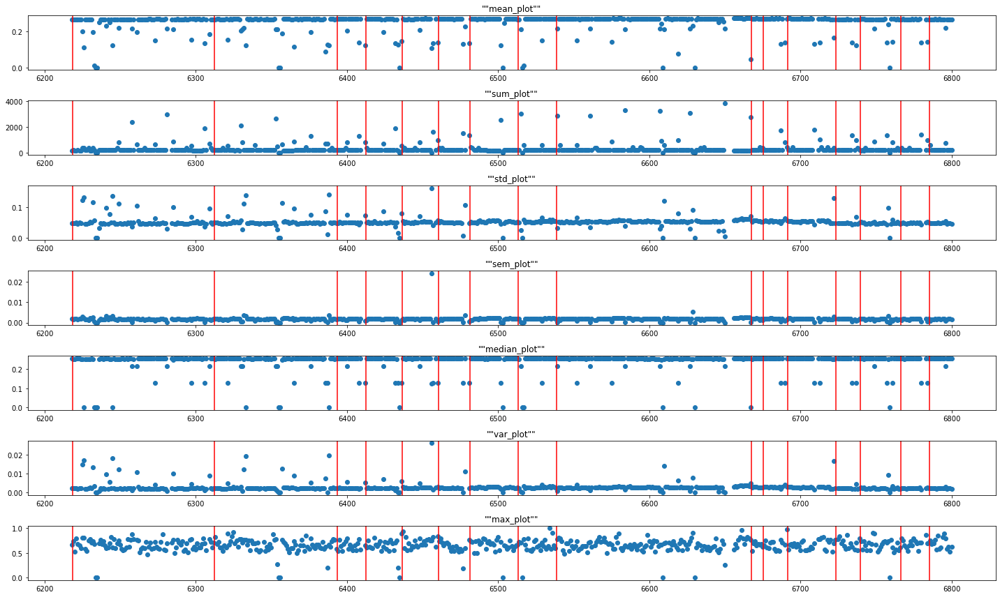

In [283]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp_mmS)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp_mmS),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool5_mmS_stat.index, tool5_mmS_stat.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool5_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

# 관련 경향성이 scaler 후 통계치를 도출하는 것이 적합하지 않음
오히려, Raw 데이터에서 관련 경향성이 더 적합하게 도출되는 결과가 나타남

# Tool5의 Statistics의 값을 스케일링하여 비교

In [284]:
tool5_stat_stdS = pd.DataFrame(stdS.fit_transform(tool5_stat), columns = tool5_stat.columns, index = tool5_stat.index)
tool5_stat_mmS = pd.DataFrame(mmS.fit_transform(tool5_stat), columns = tool5_stat.columns, index = tool5_stat.index)
tool5_stat_rS = pd.DataFrame(rS.fit_transform(tool5_stat), columns = tool5_stat.columns, index = tool5_stat.index)

# (1) Statistics Standard Scaler

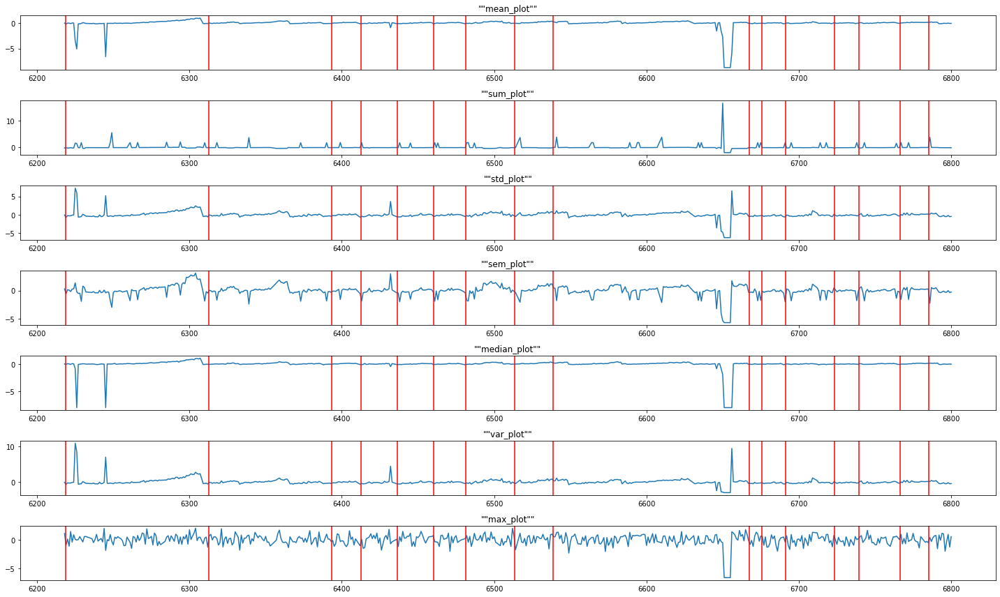

In [285]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool5_stat_stdS.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

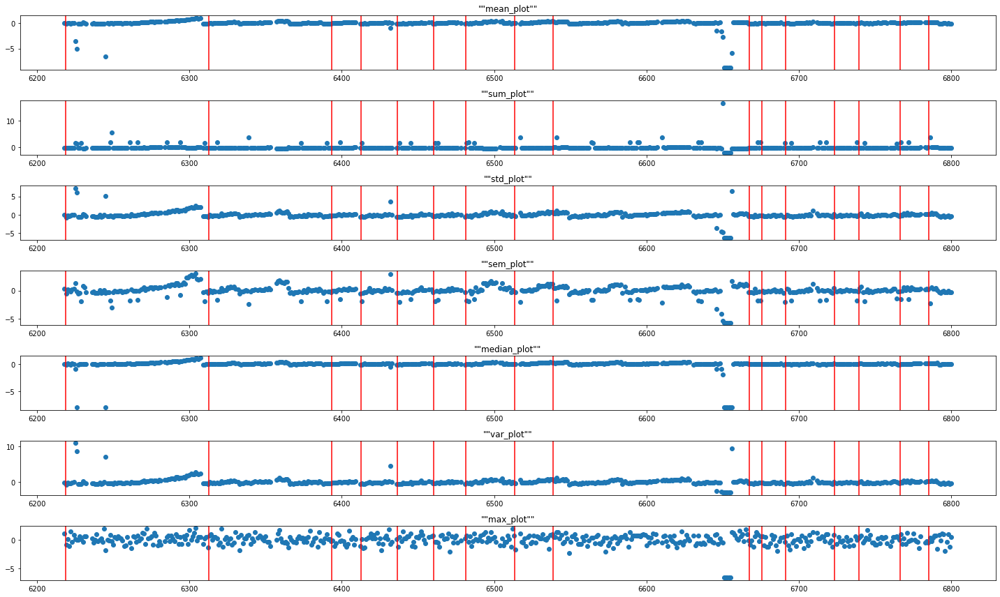

In [286]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool5_stat_stdS.index, tool5_stat_stdS.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

# (2) Statistics Minmax Scaler

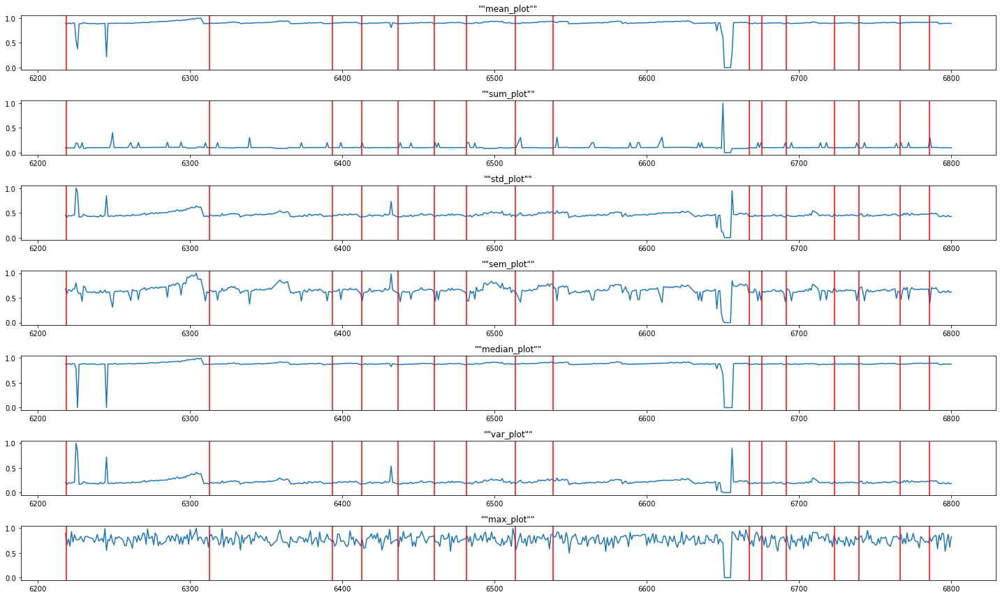

In [287]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool5_stat_mmS.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

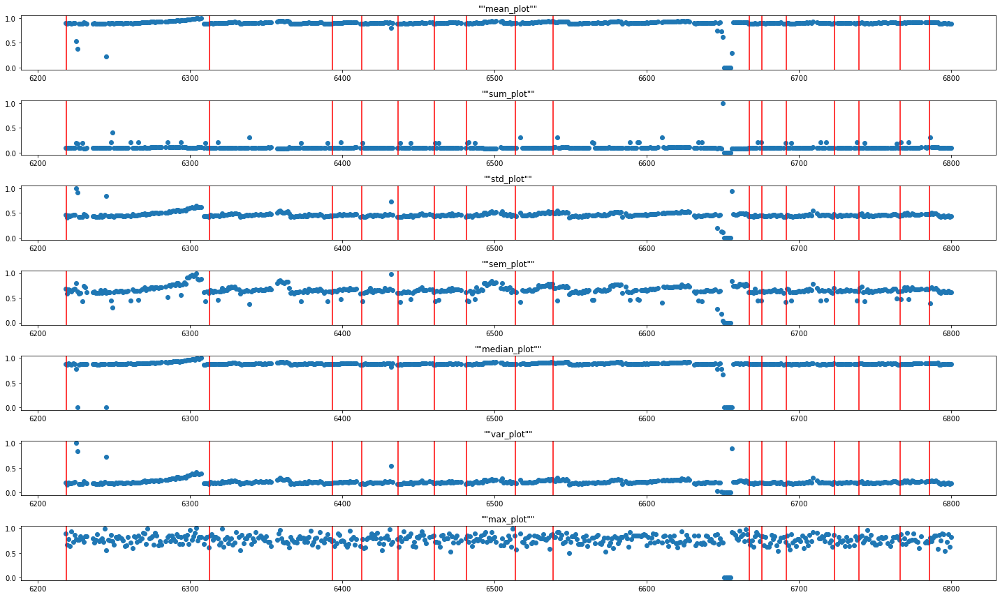

In [288]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool5_stat_mmS.index, tool5_stat_mmS.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

# (3) Statistics Robust Scaler

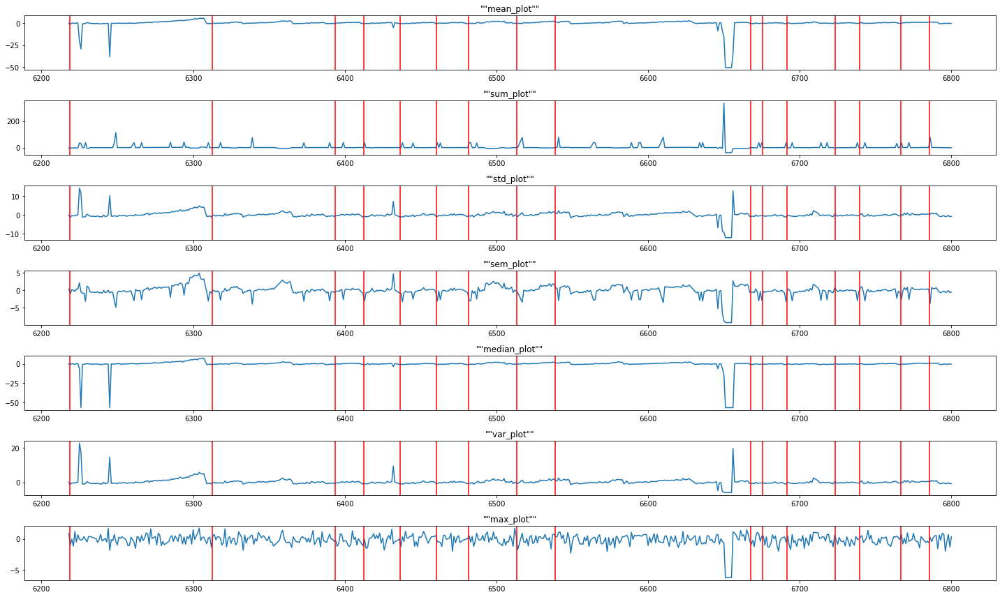

In [289]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool5_stat_rS.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

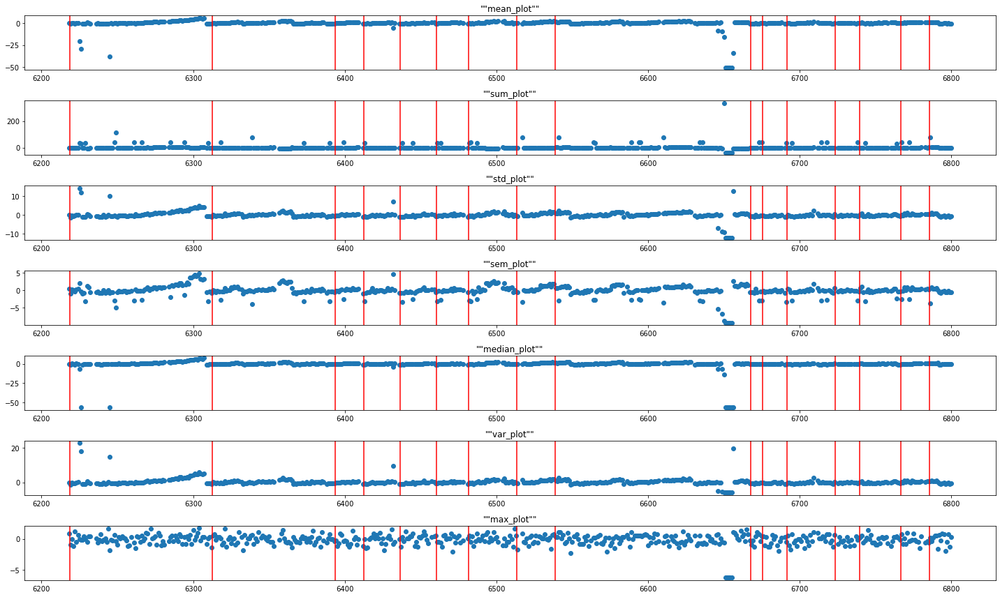

In [290]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool5_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool5_temp),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool5_stat_rS.index, tool5_stat_rS.iloc[:,idx])
    for chl_idx in tool5_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_rS_stat.iloc[:,idx].name))
plt.tight_layout()

# 3. Tool9 EDA

In [291]:
tool_9.head()

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 09:15:49,2022-08-03,9,15,49,900.0,6218,3.0,7.0,4125.0,2.0,0.0,0.0,9.0,cancel
2022-08-03 09:15:50,2022-08-03,9,15,50,900.0,6218,0.0,2.8,225.8,0.4,2400.0,0.0,9.0,cancel
2022-08-03 09:15:51,2022-08-03,9,15,51,900.0,6218,1.8,4.0,4.0,0.0,2400.0,0.0,9.0,cancel
2022-08-03 09:15:52,2022-08-03,9,15,52,909.0,6218,8.4,3.2,1363.2,63.4,0.0,126.2,9.0,operation
2022-08-03 09:15:53,2022-08-03,9,15,53,909.0,6218,307.0,496.8,4997.2,284.2,5656.8,34.4,9.0,operation


In [292]:
# 분 단위로 변환
tool_9_mod1 = tool_9.reset_index()

tool_9_mod1 = tool_9.groupby(['date', 'hour', 'minute']).mean()['current_spindle']
tool_9_mod1 = tool_9_mod1.reset_index()
tool_9_mod1['date'] = tool_9_mod1['date'].astype('str')
tool_9_mod1['hour'] = tool_9_mod1['hour'].astype('str')
tool_9_mod1['minute'] = tool_9_mod1['minute'].astype('str')
tool_9_mod1['datetime'] = tool_9_mod1['date'] + ' ' + tool_9_mod1['hour']+ ':' + tool_9_mod1['minute']
tool_9_mod1['datetime'] = pd.to_datetime(tool_9_mod1['datetime'])
tool_9_mod1 = tool_9_mod1.set_index('datetime')
tool_9_mod1

,date,hour,minute,current_spindle
datetime,,,,
2022-08-03 10:00:00,2022-08-03,10,0,2059.037037
2022-08-03 10:01:00,2022-08-03,10,1,2019.488889
2022-08-03 10:02:00,2022-08-03,10,2,2020.010656
2022-08-03 10:03:00,2022-08-03,10,3,2082.503333
2022-08-03 10:04:00,2022-08-03,10,4,2114.739444
...,...,...,...,...
2022-09-03 09:58:00,2022-09-03,9,58,2668.602516
2022-09-03 09:06:00,2022-09-03,9,6,1922.913636
2022-09-03 09:07:00,2022-09-03,9,7,2021.360556


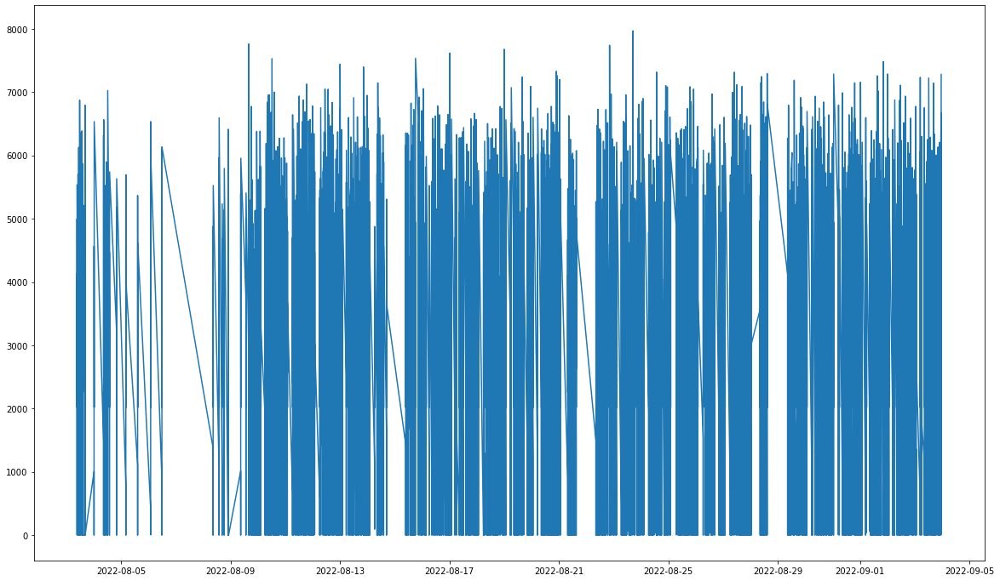

In [293]:
# 초 단위의 스핀들 전류값 시각화
plt.figure(figsize = (20,12))
plt.plot(tool_9['current_spindle'])

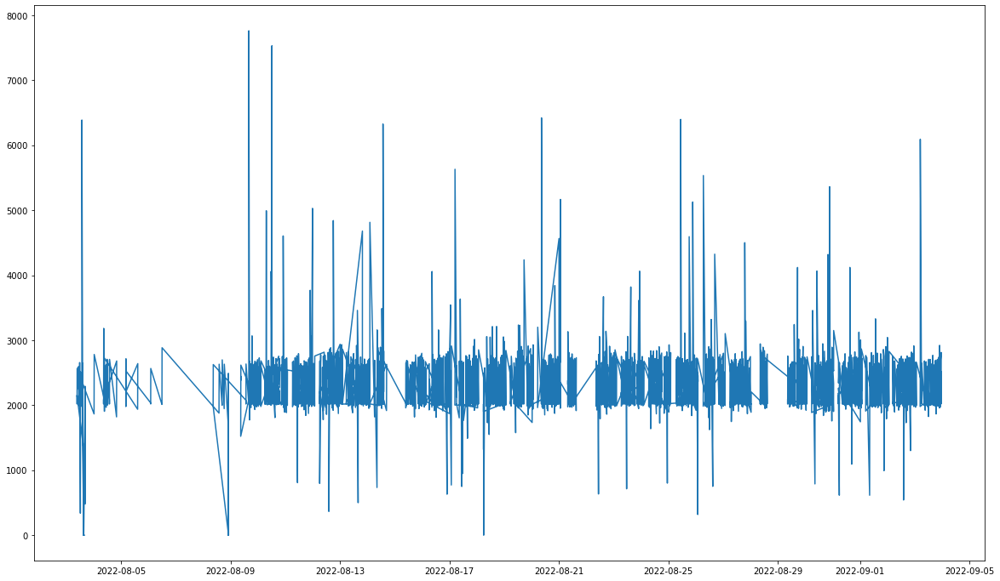

In [294]:
# 분 단위 스핀들 전류값 시각화
plt.figure(figsize=(20,12))
plt.plot(tool_9_mod1['current_spindle'])

In [295]:
tool9_mean = pd.Series(tool_9.groupby('shot_no').mean()['current_spindle'], name = 'mean')
tool9_sum = pd.Series(tool_9.groupby('shot_no').sum()['current_spindle'], name = 'sum')
tool9_std = pd.Series(tool_9.groupby('shot_no').std()['current_spindle'], name = 'std')
tool9_sem = pd.Series(tool_9.groupby('shot_no').sem()['current_spindle'], name = 'sem')
tool9_median = pd.Series(tool_9.groupby('shot_no').median()['current_spindle'], name = 'median')
tool9_var = pd.Series(tool_9.groupby('shot_no').var()['current_spindle'], name = 'var')
tool9_max = pd.Series(tool_9.groupby('shot_no').max()['current_spindle'], name = 'max')
tool9_temp = [tool9_mean, tool9_sum, tool9_std, tool9_sem, tool9_median, tool9_var, tool9_max]
tool9_stat = pd.Series()
for tool9_add in tool9_temp:
    tool9_stat = pd.concat([tool9_stat, tool9_add], axis = 1)
tool9_stat.drop(0, axis = 1, inplace = True)
tool9_stat

,mean,sum,std,sem,median,var,max
6218,2193.292908,9.277629e+05,404.457261,19.665385,2021.0,163585.676109,5536.00
6219,2180.994384,1.003257e+06,408.984609,19.069006,2022.6,167268.410224,5705.40
6220,2186.955503,9.207083e+05,406.885270,19.830375,2021.0,165555.623235,6126.60
6221,2191.375869,9.247606e+05,448.521607,21.833690,2022.8,201171.631549,6873.20
6222,2160.056110,9.957859e+05,394.290781,18.363952,2021.0,155465.219667,6355.00
...,...,...,...,...,...,...,...
6796,2211.704157,9.842083e+05,406.325973,19.261698,2025.6,165100.796441,6131.00
6797,2211.500897,9.863294e+05,438.232476,20.750909,2025.4,192047.703440,6131.20
6798,2220.679821,9.904232e+05,430.624964,20.390683,2027.5,185437.859259,6207.60
6799,2209.844270,9.833807e+05,395.140626,18.731462,2030.6,156136.114038,5282.25


No handles with labels found to put in legend.


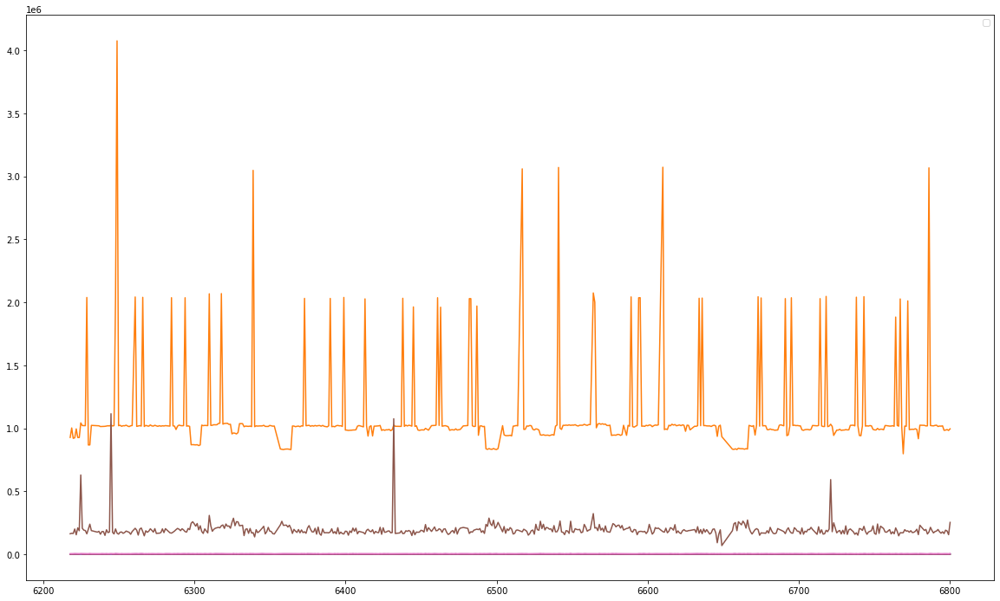

In [296]:
plt.figure(figsize=(20,12))
plt.plot(tool9_stat)
plt.legend()

In [297]:
tool_9.head()

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 09:15:49,2022-08-03,9,15,49,900.0,6218,3.0,7.0,4125.0,2.0,0.0,0.0,9.0,cancel
2022-08-03 09:15:50,2022-08-03,9,15,50,900.0,6218,0.0,2.8,225.8,0.4,2400.0,0.0,9.0,cancel
2022-08-03 09:15:51,2022-08-03,9,15,51,900.0,6218,1.8,4.0,4.0,0.0,2400.0,0.0,9.0,cancel
2022-08-03 09:15:52,2022-08-03,9,15,52,909.0,6218,8.4,3.2,1363.2,63.4,0.0,126.2,9.0,operation
2022-08-03 09:15:53,2022-08-03,9,15,53,909.0,6218,307.0,496.8,4997.2,284.2,5656.8,34.4,9.0,operation


In [298]:
tool_9[tool_9.index < '2022-08-24 18:20:13']

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-03 09:15:49,2022-08-03,9,15,49,900.0,6218,3.000000,7.0,4125.0,2.0,0.0,0.0,9.0,cancel
2022-08-03 09:15:50,2022-08-03,9,15,50,900.0,6218,0.000000,2.8,225.8,0.4,2400.0,0.0,9.0,cancel
2022-08-03 09:15:51,2022-08-03,9,15,51,900.0,6218,1.800000,4.0,4.0,0.0,2400.0,0.0,9.0,cancel
2022-08-03 09:15:52,2022-08-03,9,15,52,909.0,6218,8.400000,3.2,1363.2,63.4,0.0,126.2,9.0,operation
2022-08-03 09:15:53,2022-08-03,9,15,53,909.0,6218,307.000000,496.8,4997.2,284.2,5656.8,34.4,9.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-24 18:01:38,2022-08-24,18,1,38,909.0,6574,124.000000,1460.8,2023.8,299.4,5313.4,0.6,9.0,operation
2022-08-24 18:01:39,2022-08-24,18,1,39,909.0,6574,437.600000,1470.2,2023.0,299.4,7071.0,0.6,9.0,operation
2022-08-24 18:01:40,2022-08-24,18,1,40,909.0,6574,400.600000,1456.0,2022.0,299.4,6656.8,0.6,9.0,operation


In [299]:
tool_1[tool_1['shot_no'] == 6436]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-18 07:21:33,2022-08-18,7,21,33,101.0,6436,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,operation
2022-08-18 07:21:34,2022-08-18,7,21,34,101.0,6436,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,operation
2022-08-18 07:21:35,2022-08-18,7,21,35,101.0,6436,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,operation
2022-08-18 07:21:36,2022-08-18,7,21,36,101.0,6436,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,operation
2022-08-18 07:21:37,2022-08-18,7,21,37,101.0,6436,0.0,2.0,0.0,0.000000,0.0,0.000000,1.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-18 08:20:22,2022-08-18,8,20,22,101.0,6436,229.6,1489.6,2015.0,299.000000,5239.8,0.800000,1.0,operation
2022-08-18 08:20:23,2022-08-18,8,20,23,101.0,6436,471.6,1460.0,2014.2,299.600000,7071.0,0.600000,1.0,operation
2022-08-18 08:20:24,2022-08-18,8,20,24,101.0,6436,325.4,1456.6,2015.4,299.600000,5828.4,1.000000,1.0,operation


In [300]:
tool_5[tool_5['shot_no'] == 6691]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-08-30 09:07:47,2022-08-30,9,7,47,500.0,6691,0.0,771.0,2016.0,299.000000,0.0,0.000000,5.0,cancel
2022-08-30 09:07:48,2022-08-30,9,7,48,500.0,6691,0.0,8.5,2015.0,299.333333,4857.0,0.500000,5.0,cancel
2022-08-30 09:07:49,2022-08-30,9,7,49,500.0,6691,3.0,4.0,2014.4,299.400000,2400.0,0.200000,5.0,cancel
2022-08-30 09:07:50,2022-08-30,9,7,50,500.0,6691,3.0,2.0,2015.0,299.000000,0.0,0.000000,5.0,cancel
2022-08-30 09:07:50,2022-08-30,9,7,50,505.0,6691,149.0,325.0,2016.0,299.000000,4714.0,0.666667,5.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-30 10:00:20,2022-08-30,10,0,20,505.0,6691,469.8,1478.6,2016.6,299.400000,7071.0,0.600000,5.0,operation
2022-08-30 10:00:21,2022-08-30,10,0,21,505.0,6691,404.8,1457.8,2016.0,299.200000,6656.8,0.800000,5.0,operation
2022-08-30 10:00:22,2022-08-30,10,0,22,505.0,6691,395.2,224.2,2016.0,299.400000,3927.2,0.800000,5.0,operation


In [301]:
tool_9[tool_9['shot_no'] == 6785]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 09:06:17,2022-09-03,9,6,17,900.0,6785,0.000000,2.000000,545.000000,0.000000,0.000000,0.000000,9.0,cancel
2022-09-03 09:06:18,2022-09-03,9,6,18,900.0,6785,0.000000,2.000000,127.400000,0.000000,7200.000000,0.000000,9.0,cancel
2022-09-03 09:06:19,2022-09-03,9,6,19,900.0,6785,3.000000,4.000000,0.000000,0.000000,0.000000,0.000000,9.0,cancel
2022-09-03 09:06:19,2022-09-03,9,6,19,909.0,6785,0.000000,3.000000,0.000000,5.500000,0.000000,97.000000,9.0,operation
2022-09-03 09:06:20,2022-09-03,9,6,20,909.0,6785,85.000000,7.000000,2622.000000,144.400000,1414.200000,122.800000,9.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 09:13:51,2022-09-03,9,13,51,909.0,6785,184.000000,1467.600000,2020.400000,299.200000,5828.400000,1.000000,9.0,operation
2022-09-03 09:13:52,2022-09-03,9,13,52,909.0,6785,490.000000,1467.000000,2020.000000,299.750000,7071.000000,0.750000,9.0,operation
2022-09-03 09:13:53,2022-09-03,9,13,53,909.0,6785,412.666667,1316.166667,2020.166667,299.333333,6085.833333,0.333333,9.0,operation


In [302]:
tool_9[tool_9['shot_no'] == 6786]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 09:51:14,2022-09-03,9,51,14,900.0,6786,0.75,4.5,2033.5,0.000000,0.00,0.00,9.0,cancel
2022-09-03 09:51:15,2022-09-03,9,51,15,900.0,6786,0.60,2.4,13.6,0.000000,7200.00,0.00,9.0,cancel
2022-09-03 09:51:16,2022-09-03,9,51,16,900.0,6786,1.50,4.0,0.0,0.000000,0.00,0.00,9.0,cancel
2022-09-03 09:51:16,2022-09-03,9,51,16,909.0,6786,0.00,2.0,0.0,7.666667,0.00,117.00,9.0,operation
2022-09-03 09:51:17,2022-09-03,9,51,17,909.0,6786,217.40,89.2,4638.0,224.600000,2828.40,89.20,9.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 11:27:20,2022-09-03,11,27,20,909.0,6786,0.00,1467.4,2021.4,299.600000,4613.60,0.40,9.0,operation
2022-09-03 11:27:21,2022-09-03,11,27,21,909.0,6786,542.40,1565.4,2022.2,299.400000,6270.40,0.40,9.0,operation
2022-09-03 11:27:22,2022-09-03,11,27,22,909.0,6786,429.60,1448.2,2025.4,299.400000,7071.00,0.40,9.0,operation


In [303]:
tool_9[tool_9['shot_no'] == 6787]

,date,hour,minute,second,tool_number,shot_no,current_x,current_z,current_spindle,rpm,feed,load_1,tool,state
datetime,,,,,,,,,,,,,,
2022-09-03 12:04:55,2022-09-03,12,4,55,900.0,6787,0.0,2.0,611.75,0.00,857.25,0.00,9.0,cancel
2022-09-03 12:04:56,2022-09-03,12,4,56,900.0,6787,1.8,2.8,5.60,0.00,5485.80,0.00,9.0,cancel
2022-09-03 12:04:57,2022-09-03,12,4,57,900.0,6787,0.0,2.0,0.00,0.00,0.00,0.00,9.0,cancel
2022-09-03 12:04:57,2022-09-03,12,4,57,909.0,6787,4.5,3.5,1226.00,42.75,0.00,134.25,9.0,operation
2022-09-03 12:04:58,2022-09-03,12,4,58,909.0,6787,22.8,211.0,6024.20,261.80,4242.60,53.20,9.0,operation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-03 12:12:28,2022-09-03,12,12,28,909.0,6787,0.0,1468.2,2019.60,300.00,5000.00,0.80,9.0,operation
2022-09-03 12:12:29,2022-09-03,12,12,29,909.0,6787,461.2,1524.2,2018.00,299.20,5656.80,0.80,9.0,operation
2022-09-03 12:12:30,2022-09-03,12,12,30,909.0,6787,428.4,1456.4,2020.40,299.40,7071.00,1.00,9.0,operation


In [304]:
# tool9 교체시간 리스트화
tool9_change_list = pd.Series(['2022-08-03 09:30:12', '2022-08-14 08:46:46', '2022-08-16 13:29:18', '2022-08-17 08:18:57', '2022-08-18 08:27:36', '2022-08-19 09:02:46', '2022-08-20 09:24:40', '2022-08-21 14:24:03', '2022-08-24 18:20:13', '2022-08-28 18:48:35', '2022-08-29 5:50:00', '2022-08-30 09:52:18', '2022-08-31 19:07:39', '2022-09-01 10:49:24', '2022-09-02 13:30:39', '2022-09-03 09:49:45'], name = 'datetime')
tool9_change_shot = pd.Series([6218.5, 6357.5, 6393.5, 6412.5, 6436.5, 6460.5, 6481.5, 6513.5, 6538.5, 6574.5, 6667.5, 6675.5, 6691.5, 6723.5, 6739.5, 6766.5, 6785.5], name = 'shot_no')
tool9_state_list = []
for tool9_state_idx in range(0, len(change_list)):
    tool9_state_list.append('change')
tool9_state_list = pd.Series(state_list, name = 'state')
tool9_change_data = pd.concat([tool9_change_shot, tool9_state_list], axis = 1) # change_list
tool9_change_data = pd.concat([tool9_change_list, tool9_change_data], axis = 1)
tool9_change_data = tool9_change_data.set_index('datetime')
tool9_change_data

,shot_no,state
datetime,,
2022-08-03 09:30:12,6218.5,change
2022-08-14 08:46:46,6357.5,change
2022-08-16 13:29:18,6393.5,change
2022-08-17 08:18:57,6412.5,change
2022-08-18 08:27:36,6436.5,change
2022-08-19 09:02:46,6460.5,change
2022-08-20 09:24:40,6481.5,change
2022-08-21 14:24:03,6513.5,change
2022-08-24 18:20:13,6538.5,change


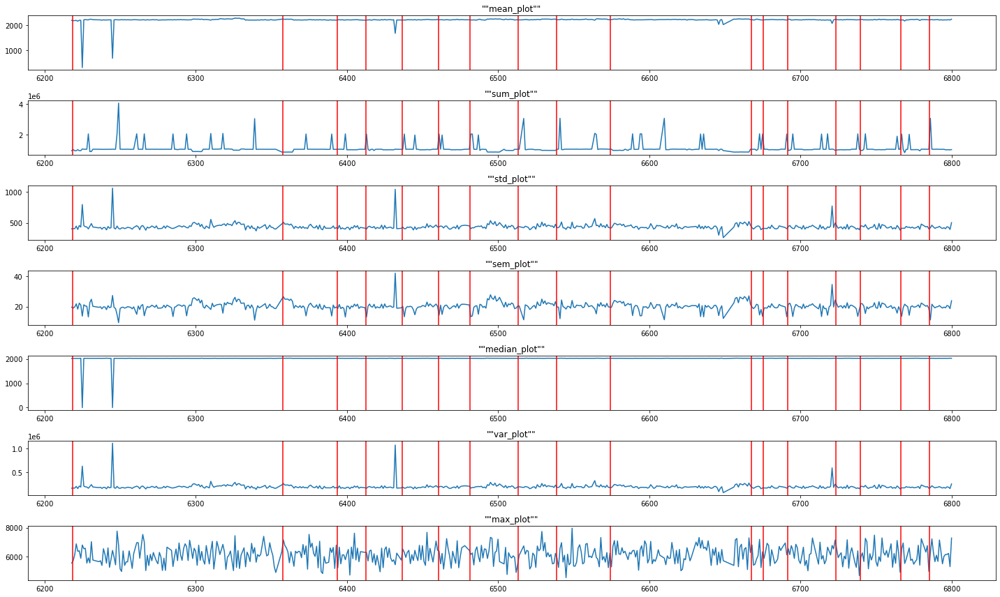

In [305]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool9_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool9_temp),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool9_stat.iloc[:,idx])
    for chl_idx in tool9_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool9_stat.iloc[:,idx].name))
plt.tight_layout()

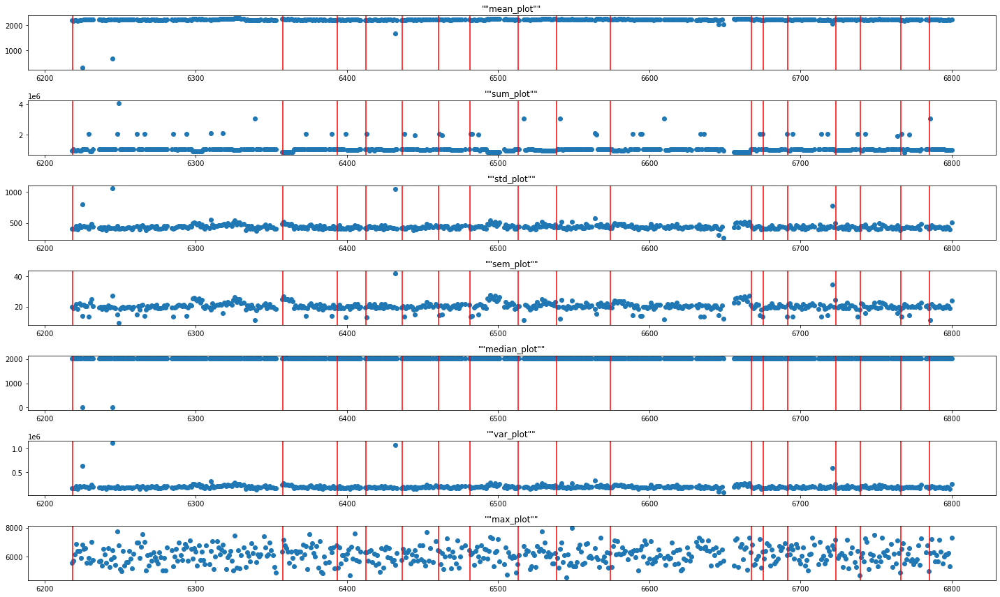

In [306]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool9_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool9_temp),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool9_stat.index, tool9_stat.iloc[:,idx])
    for chl_idx in tool9_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool9_stat.iloc[:,idx].name))
plt.tight_layout()

In [307]:
tool9_stat_stdS = pd.DataFrame(stdS.fit_transform(tool9_stat), columns = tool9_stat.columns, index = tool9_stat.index)
tool9_stat_mmS = pd.DataFrame(mmS.fit_transform(tool9_stat), columns = tool9_stat.columns, index = tool9_stat.index)
tool9_stat_rS = pd.DataFrame(rS.fit_transform(tool9_stat), columns = tool9_stat.columns, index = tool9_stat.index)

# (1) Statistics Standard Scaler

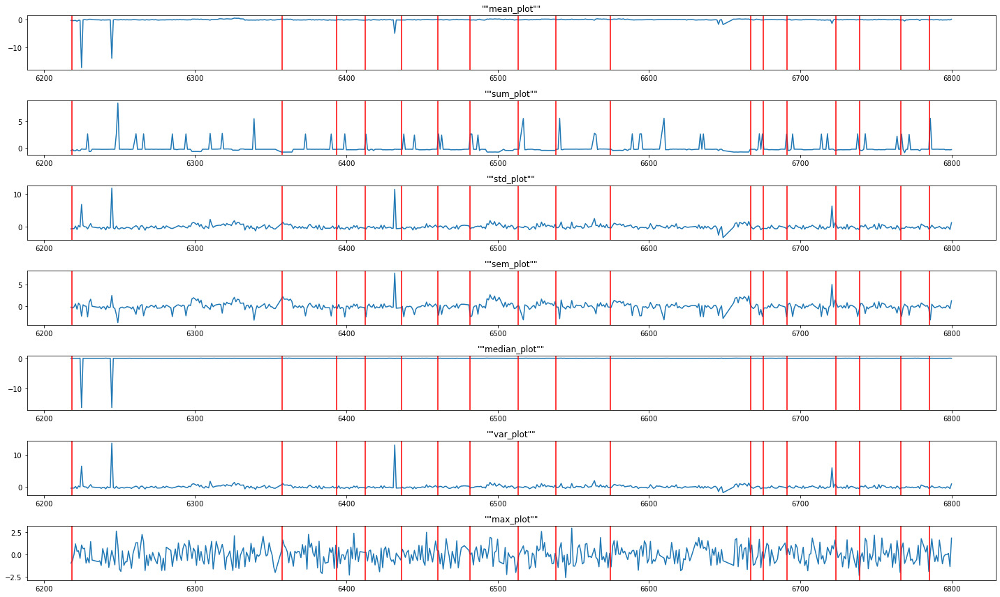

In [308]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool9_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool9_temp),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool9_stat_stdS.iloc[:,idx])
    for chl_idx in tool9_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

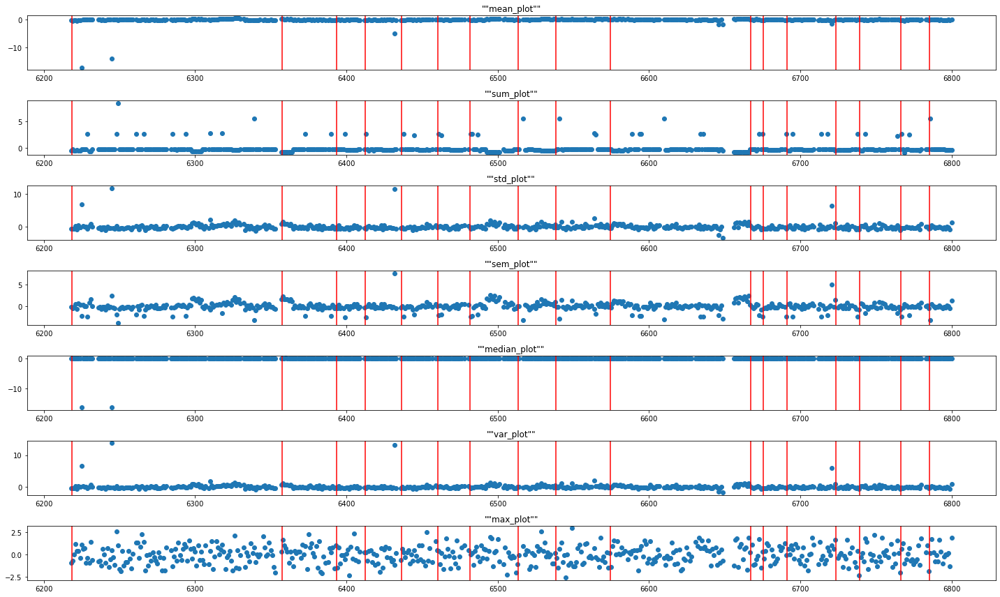

In [309]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool9_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool9_temp),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool9_stat_stdS.index, tool9_stat_stdS.iloc[:,idx])
    for chl_idx in tool9_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

# (2) Statistics Minmax Scaler

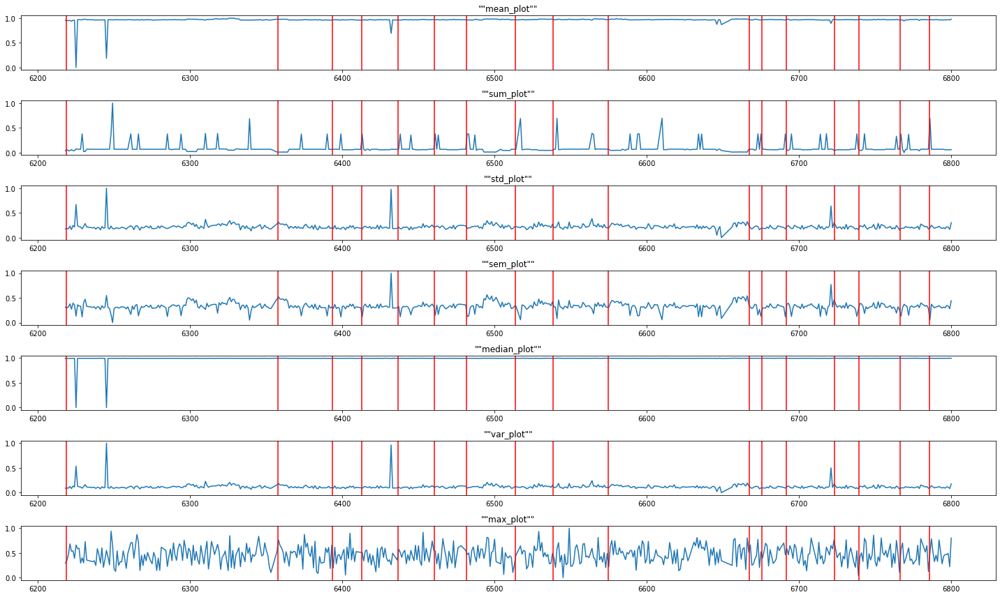

In [310]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool9_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool9_temp),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool9_stat_mmS.iloc[:,idx])
    for chl_idx in tool9_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

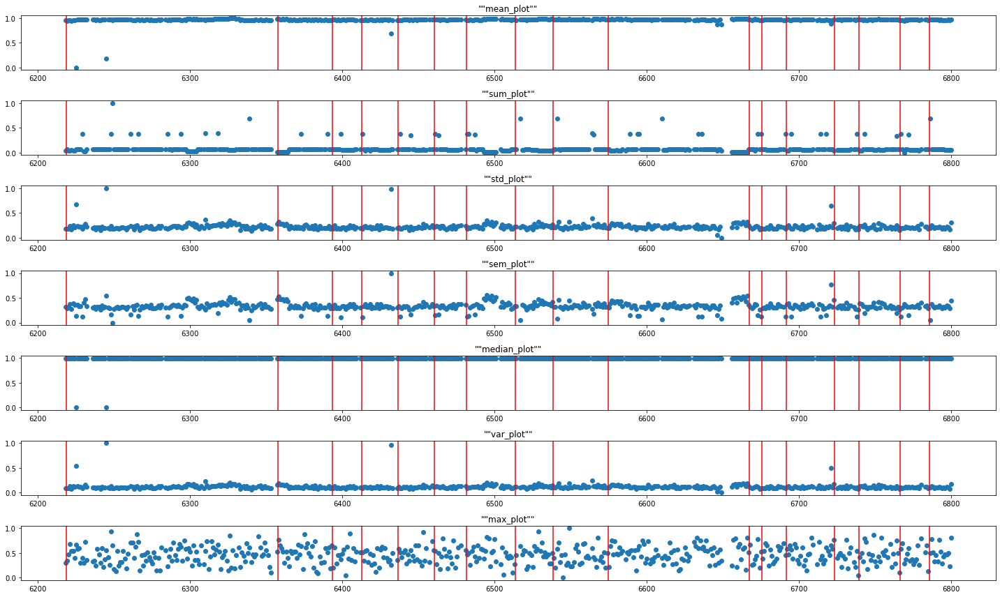

In [311]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool9_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool9_temp),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool9_stat_mmS.index, tool9_stat_mmS.iloc[:,idx])
    for chl_idx in tool9_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_mmS_stat.iloc[:,idx].name))
plt.tight_layout()

# (3) Statistics Robust Scaler

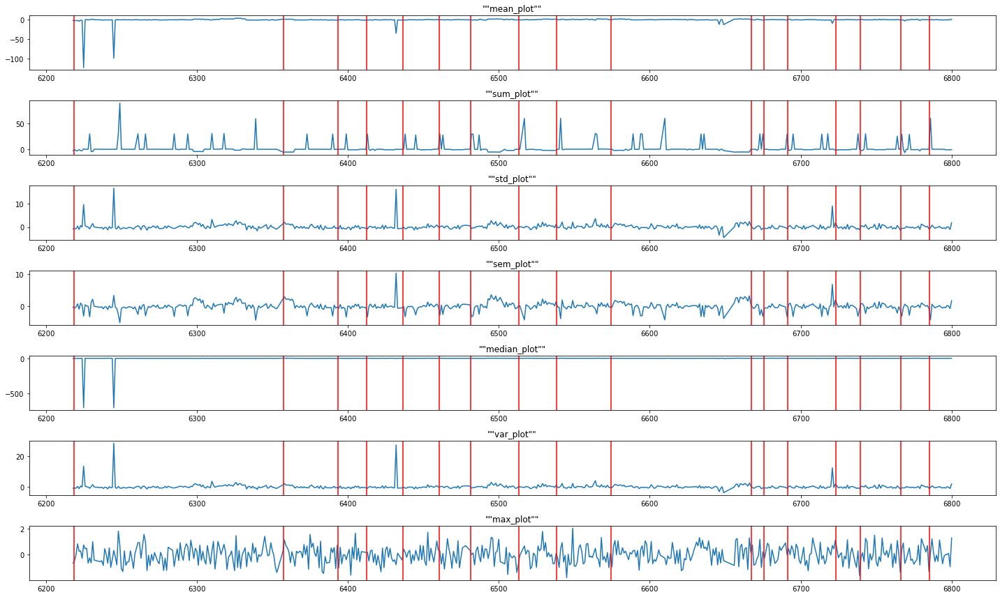

In [312]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool9_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool9_temp),1,idx+1)
    globals()['ax{}'.format(idx)].plot(tool9_stat_rS.iloc[:,idx])
    for chl_idx in tool9_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_rS_stat.iloc[:,idx].name))
plt.tight_layout()

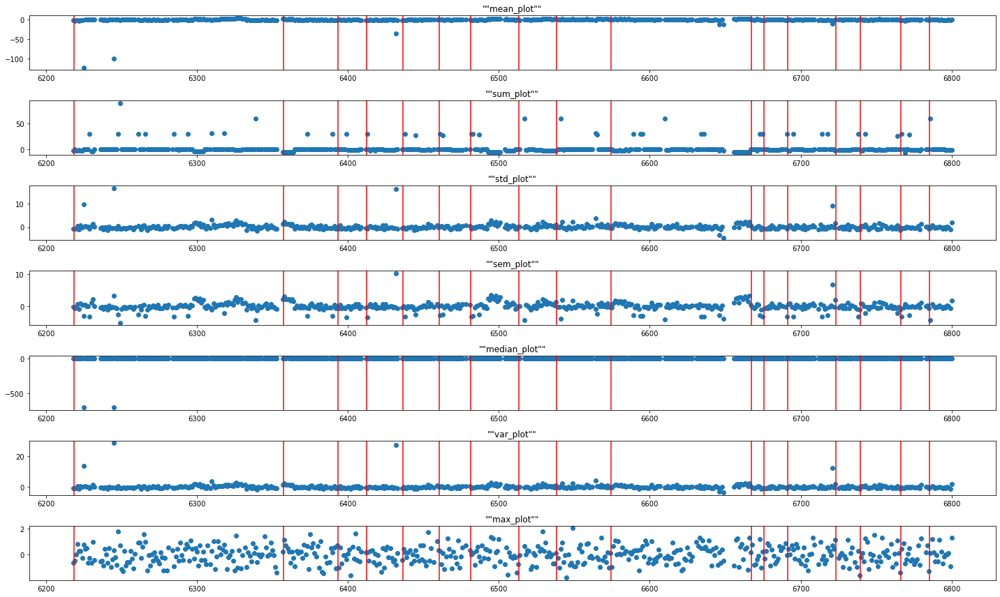

In [313]:
fig = plt.figure(figsize = (20, 12))

for idx in range(len(tool9_temp)):
    globals()['ax{}'.format(idx)] = fig.add_subplot(len(tool9_temp),1,idx+1)
    globals()['ax{}'.format(idx)].scatter(tool9_stat_rS.index, tool9_stat_rS.iloc[:,idx])
    for chl_idx in tool9_change_shot:
        globals()['ax{}'.format(idx)].axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')
    globals()['ax{}'.format(idx)].set_title('""{}_plot""'.format(tool1_rS_stat.iloc[:,idx].name))
plt.tight_layout()

In [314]:
tool9_stat_rS

,mean,sum,std,sem,median,var,max
6218,-1.609216,-2.651753,-0.758168,-0.235764,-1.666667,-0.730468,-0.650727
6219,-2.404693,-0.434111,-0.637623,-0.520679,-1.114943,-0.617649,-0.464081
6220,-2.019123,-2.858982,-0.693520,-0.156941,-1.666667,-0.670120,0.000000
6221,-1.733211,-2.739945,0.415084,0.800126,-1.045977,0.420963,0.822609
6222,-3.758995,-0.653587,-1.028859,-0.857513,-1.666667,-0.979235,0.251653
...,...,...,...,...,...,...,...
6796,-0.418363,-0.993675,-0.708412,-0.428622,-0.080460,-0.684053,0.004848
6797,-0.431510,-0.931370,0.141127,0.282836,-0.149425,0.141455,0.005068
6798,0.162189,-0.811115,-0.061430,0.110741,0.574713,-0.061035,0.089246
6799,-0.538662,-1.017987,-1.006231,-0.681938,1.643678,-0.958683,-0.930311


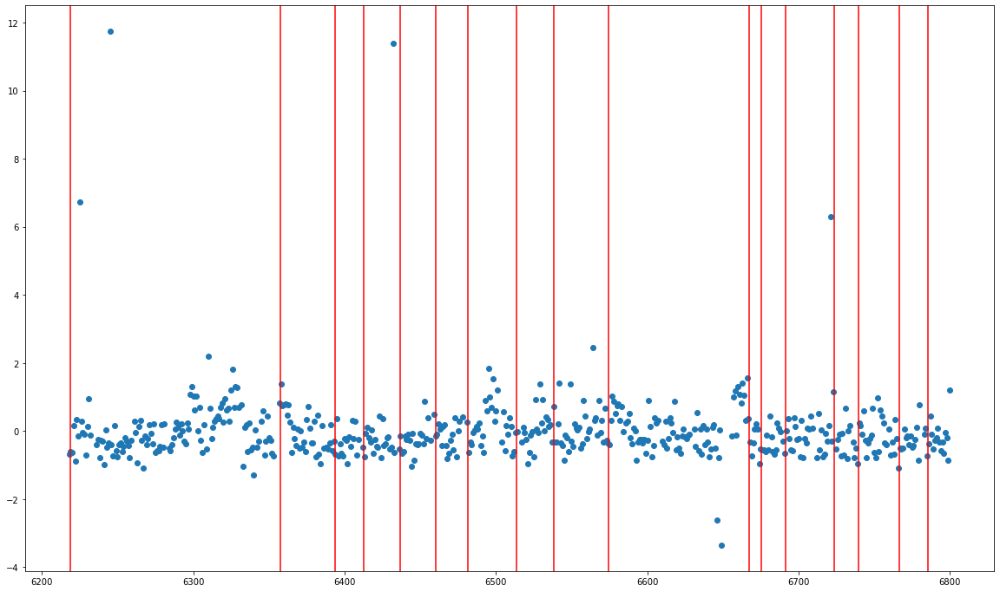

In [315]:
plt.figure(figsize = (20,12))
plt.scatter(tool9_stat_stdS.index, tool9_stat_stdS['std'])
for chl_idx in tool9_change_shot:
    plt.axvline(chl_idx, color = 'red', label = '{}'.format(chl_idx), linestyle = 'solid')

# 혼합 샷 샘플링 탐색

tool1의 경우 shot6412(교체직전) 생산시간도 매우김
shot6413(교체직후), shot6461(교체직후), shot6482(교체직후), shot6675(교체직전), shot6767(교체직후), shot6786(교체직후)

In [316]:
shot6413_tool1 = tool_1[tool_1['shot_no'] == 6413]
shot6413_tool5 = tool_5[tool_5['shot_no'] == 6413]
shot6413_tool9 = tool_9[tool_9['shot_no'] == 6413]
shot6461_tool1 = tool_1[tool_1['shot_no'] == 6461]
shot6461_tool5 = tool_5[tool_5['shot_no'] == 6461]
shot6461_tool9 = tool_9[tool_9['shot_no'] == 6461]
shot6482_tool1 = tool_1[tool_1['shot_no'] == 6482]
shot6482_tool5 = tool_5[tool_5['shot_no'] == 6482]
shot6482_tool9 = tool_9[tool_9['shot_no'] == 6482]
shot6786_tool1 = tool_1[tool_1['shot_no'] == 6786]
shot6786_tool5 = tool_5[tool_5['shot_no'] == 6786]
shot6786_tool9 = tool_9[tool_9['shot_no'] == 6786]

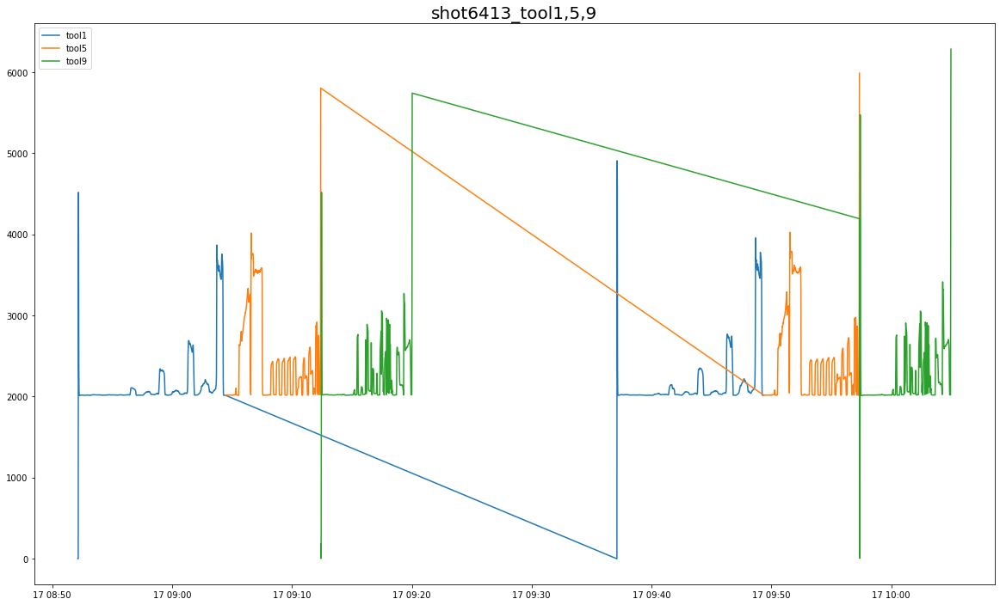

In [317]:
plt.figure(figsize = (20,12))
plt.plot(shot6413_tool1['current_spindle'], label = 'tool1')
plt.plot(shot6413_tool5['current_spindle'], label = 'tool5')
plt.plot(shot6413_tool9['current_spindle'], label = 'tool9')
plt.title('shot6413_tool1,5,9', fontsize = 20)
plt.legend()

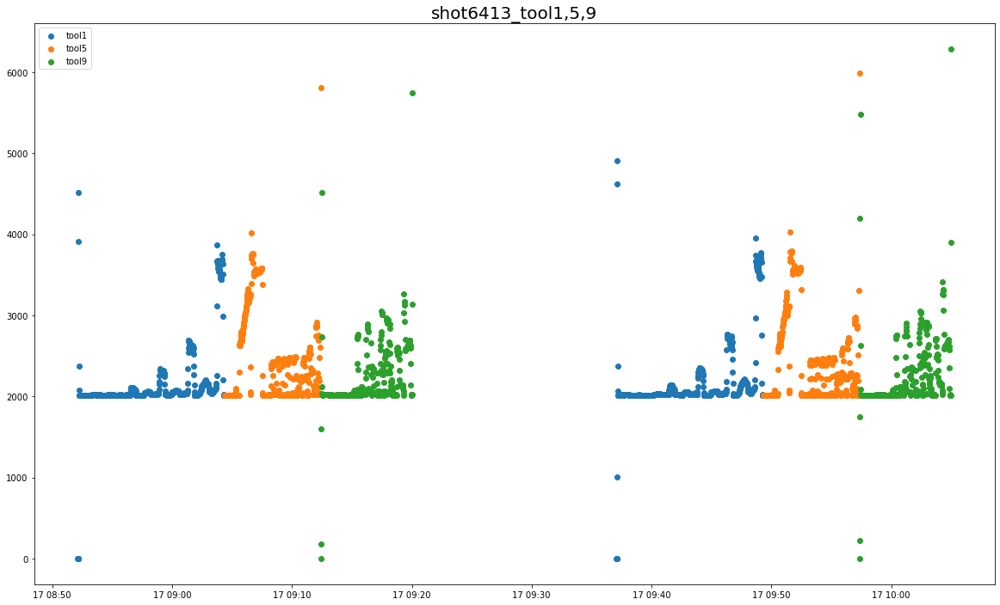

In [318]:
plt.figure(figsize = (20,12))
plt.scatter(shot6413_tool1.index, shot6413_tool1['current_spindle'], label = 'tool1')
plt.scatter(shot6413_tool5.index, shot6413_tool5['current_spindle'], label = 'tool5')
plt.scatter(shot6413_tool9.index, shot6413_tool9['current_spindle'], label = 'tool9')
plt.title('shot6413_tool1,5,9', fontsize = 20)
plt.legend()

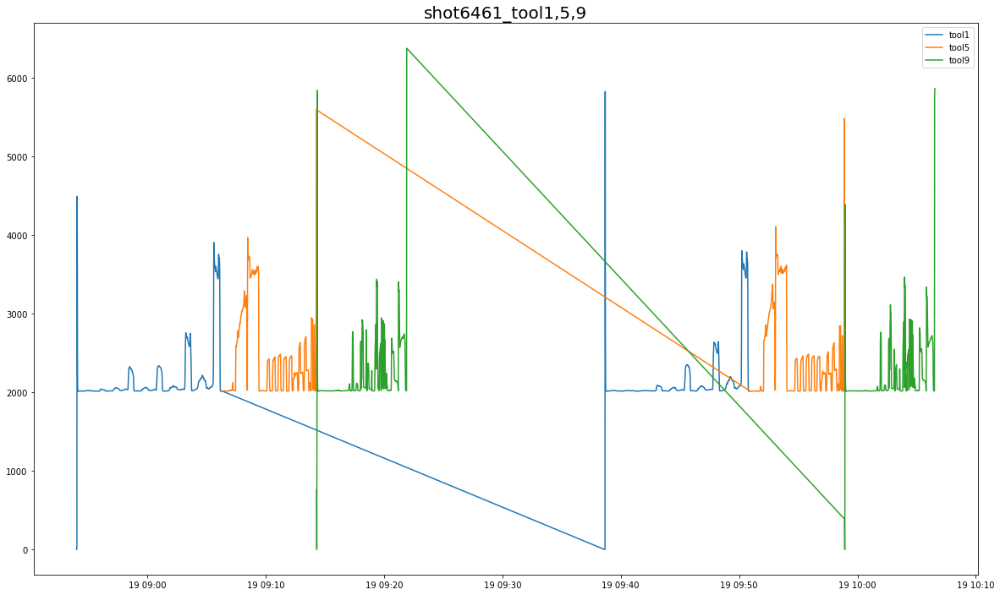

In [319]:
plt.figure(figsize = (20,12))
plt.plot(shot6461_tool1['current_spindle'], label = 'tool1')
plt.plot(shot6461_tool5['current_spindle'], label = 'tool5')
plt.plot(shot6461_tool9['current_spindle'], label = 'tool9')
plt.title('shot6461_tool1,5,9', fontsize = 20)
plt.legend()

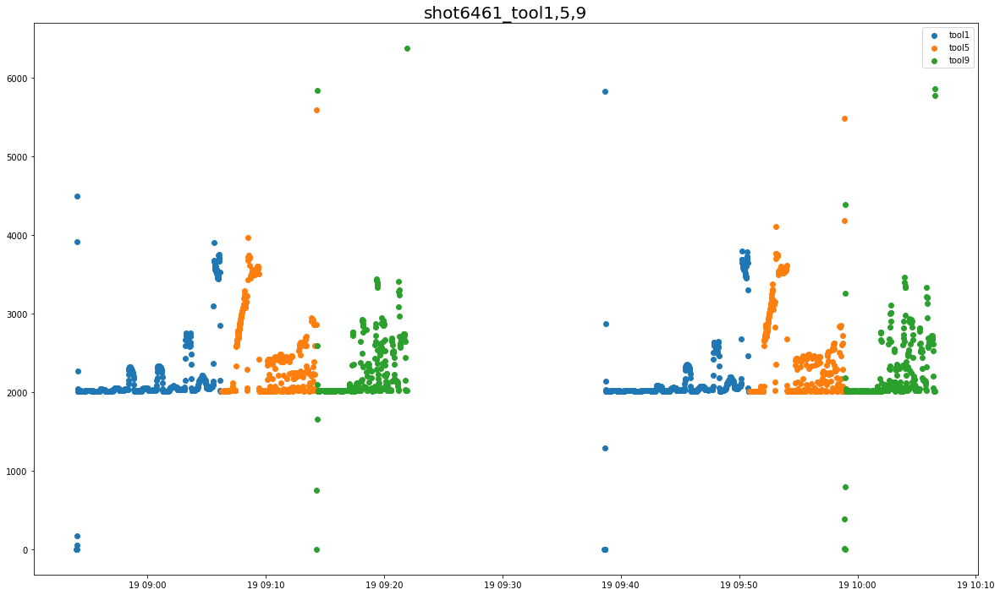

In [320]:
plt.figure(figsize = (20,12))
plt.scatter(shot6461_tool1.index, shot6461_tool1['current_spindle'], label = 'tool1')
plt.scatter(shot6461_tool5.index, shot6461_tool5['current_spindle'], label = 'tool5')
plt.scatter(shot6461_tool9.index, shot6461_tool9['current_spindle'], label = 'tool9')
plt.title('shot6461_tool1,5,9', fontsize = 20)
plt.legend()

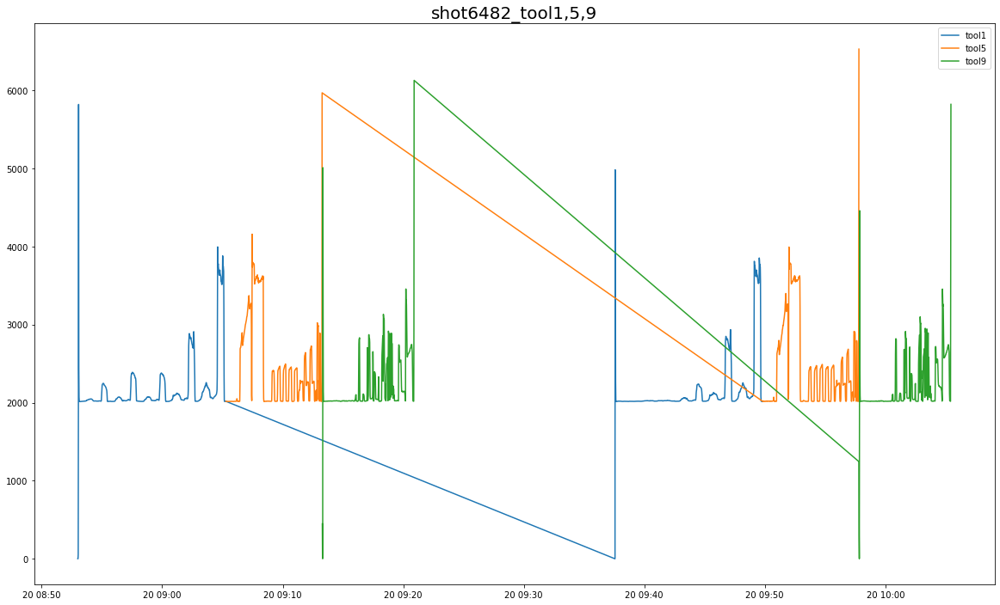

In [321]:
plt.figure(figsize = (20,12))
plt.plot(shot6482_tool1['current_spindle'], label = 'tool1')
plt.plot(shot6482_tool5['current_spindle'], label = 'tool5')
plt.plot(shot6482_tool9['current_spindle'], label = 'tool9')
plt.title('shot6482_tool1,5,9', fontsize = 20)
plt.legend()

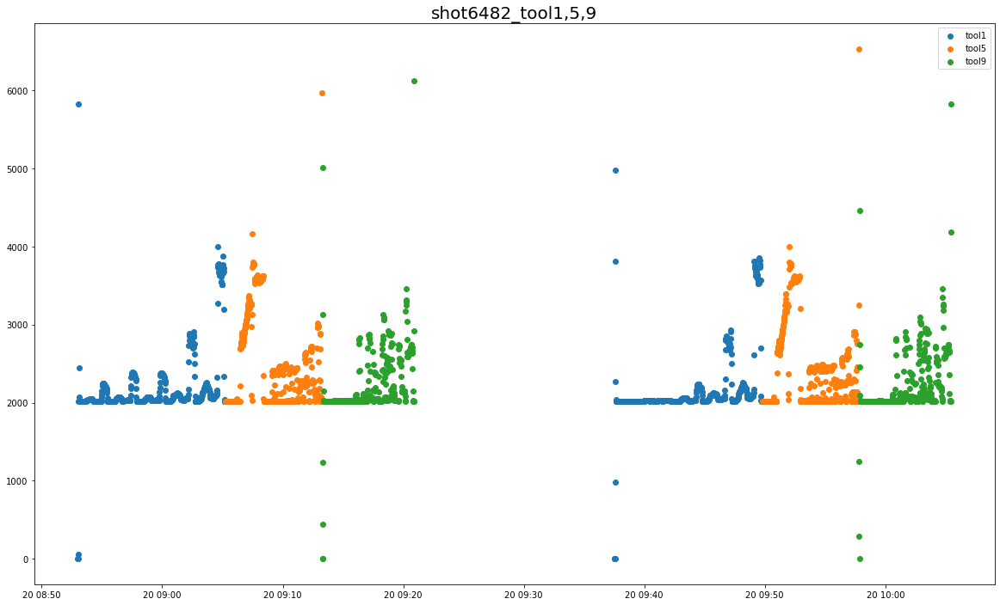

In [322]:
plt.figure(figsize = (20,12))
plt.scatter(shot6482_tool1.index, shot6482_tool1['current_spindle'], label = 'tool1')
plt.scatter(shot6482_tool5.index, shot6482_tool5['current_spindle'], label = 'tool5')
plt.scatter(shot6482_tool9.index, shot6482_tool9['current_spindle'], label = 'tool9')
plt.title('shot6482_tool1,5,9', fontsize = 20)
plt.legend()

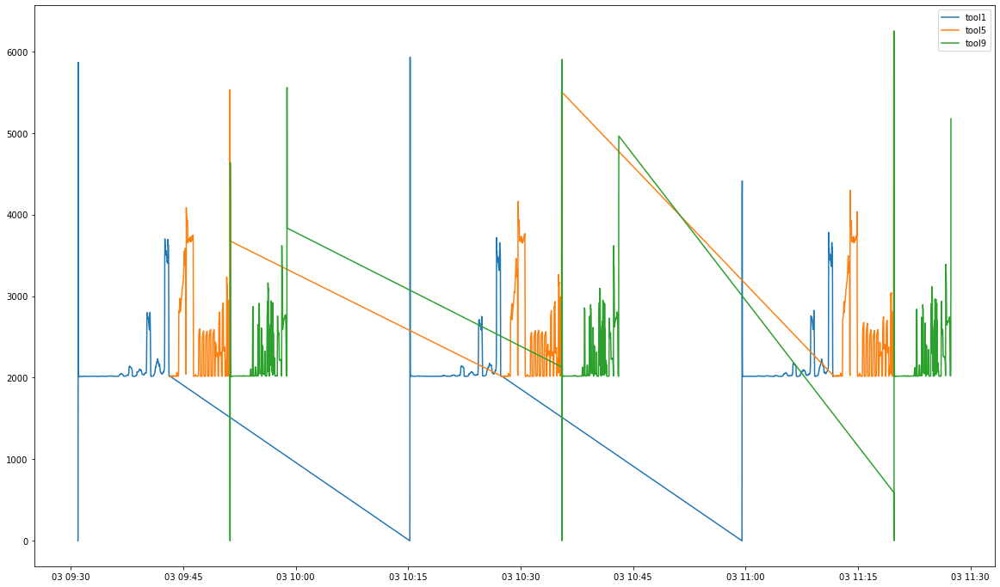

In [323]:
plt.figure(figsize = (20,12))
plt.plot(shot6786_tool1['current_spindle'], label = 'tool1')
plt.plot(shot6786_tool5['current_spindle'], label = 'tool5')
plt.plot(shot6786_tool9['current_spindle'], label = 'tool9')
plt.legend()

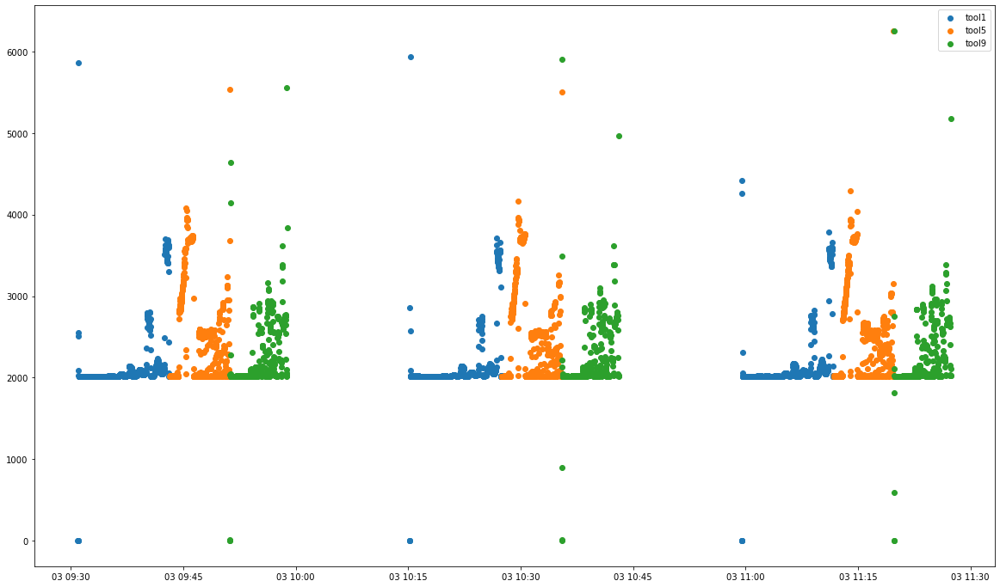

In [324]:
plt.figure(figsize = (20,12))
plt.scatter(shot6786_tool1.index, shot6786_tool1['current_spindle'], label = 'tool1')
plt.scatter(shot6786_tool5.index, shot6786_tool5['current_spindle'], label = 'tool5')
plt.scatter(shot6786_tool9.index, shot6786_tool9['current_spindle'], label = 'tool9')
plt.legend()